In [1]:
import torch
from torch import nn
import torch.utils.data as Data
import torch.optim as optim
import numpy as np
from os.path import join as PJ
import matplotlib.pyplot as plt

In [2]:
torch.cuda.set_device(0)
print(torch.cuda.current_device())

0


In [3]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image,ImageOps

In [4]:
import tensorflow as tf

In [ ]:
def LoadFiles(mode="train"):
    if mode == "train":
        with open(TrainFile, 'r') as trainf:
            image_info = trainf.readlines()
            image_info = [path.strip().split() for path in image_info]
            image_info = np.asarray(image_info)

            # Split to image path and label
            image_paths = image_info[:, 0]
            label_ids = image_info[:, 1].astype(int)

#             labels = tf.one_hot(label_ids, num_class, dtype=tf.int32)
            print("in Load : ", label_ids.shape)
            return image_paths, label_ids
    else:
        with open(TestFile, 'r') as testf:
            image_info = testf.readlines()
            image_info = [path.strip().split() for path in image_info]
            image_info = np.asarray(image_info)

            # Split to image path and label
            image_paths = image_info[:, 0]
            label_ids = image_info[:, 1].astype(int)
#             labels = tf.one_hot(label_ids, num_class, dtype=tf.int32)
            return image_paths, label_ids

In [7]:
import cv2
class TermiteDataset(Dataset):
    def __init__(self, data_file, transform):
        with open(data_file, 'r') as f:
            image_info = f.readlines()
        image_info = [path.strip().split() for path in image_info]
        image_info = np.asarray(image_info)

        # Split to image path and label
        self.image_paths = image_info[:, 0]
        self.label_ids = image_info[:, 1].astype(int)
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
#         print(idx, self.label_ids.shape, self.label_ids[idx])
        label = self.label_ids[idx]
        image_path = self.image_paths[idx]
        original_image = Image.open(image_path).convert('RGB')
        
#         print(original_image.size)
        
        if original_image.size[0] > 1000:
            original_image = original_image.resize((1000, original_image.size[1]*1000//original_image.size[0]))
        elif original_image.size[1] > 1000:
            original_image = original_image.resize((original_image.size[0]*1000//original_image.size[1], 1000))
#         print(original_image.shape)
        left = 500-original_image.size[0]//2
        right = 500-original_image.size[0]//2
        top = 500-original_image.size[1]//2
        bottom = 500-original_image.size[1]//2
        
        if left + right + original_image.size[0] != 1000:
            right = 1000 - left - original_image.size[0]
        if top + bottom + original_image.size[1] != 1000:
            top = 1000 - bottom - original_image.size[1]
        
#         original_image= cv2.copyMakeBorder(original_image,left,right,top,bottom,cv2.BORDER_CONSTANT,value=(0, 0, 0))
        original_image = ImageOps.expand(original_image, border=(left,top,right,bottom), fill=0)##left,top,right,bottom
        original_image = original_image.resize((130,130))
        transform1 = transforms.Compose([transforms.ToTensor()])
        original_image = transform1(original_image)
#         print(original_image.shape)
        
        
#         original_image = self.transform(original_image)
#         original_image.permute(2,0,1)
#         print(original_image.shape, answer.shape)
        return label, original_image, self.image_paths[idx]

def transform_set(train, new_size=None, pad=None):
    """
    train: True or False
    new_size: int or tuple
    
    """
#     transform_list = [transforms.ToTensor(),
#                       transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]
    transform_list = [transforms.ToTensor()]
    # replace centercrop to padding
#     transform_list = [transforms.CenterCrop((crop_h, crop_w))] + transform_list if crop else transform_list
#     transform_list = [transforms.Resize(new_size)] + transform_list if new_size is not None else transform_list

#     transform_list = [transforms.RandomHorizontalFlip()] + transform_list if train else transform_list
    transform = transforms.Compose(transform_list)
    return transform

In [8]:
def CheckFile(filename):
    with open(filename, 'r') as f:
            image_info = f.readlines()
    image_info = [path.strip().split() for path in image_info]
    image_info = np.asarray(image_info)
    counts = {"台灣土白蟻兵蟻" : 0,
             "台灣土白蟻工蟻" : 0,
             "台灣家白蟻兵蟻" : 0,
             "台灣家白蟻工蟻" : 0,
             "截頭堆沙兵蟻" : 0,
             "截頭堆沙工蟻" : 0,
             "黃肢散工蟻" : 0,
             "黃肢散兵蟻" : 0,}
        
    Locations = {"L1" : 0,
             "L2" : 0,
             "L3" : 0}
    for line in image_info:
        path = line[0]
        if "L1" in path:
            Locations["L1"] += 1
        if "L2" in path:
            Locations["L2"] += 1
        if "L3" in path:
            Locations["L3"] += 1
        if "台灣土白蟻兵蟻" in path:
            counts["台灣土白蟻兵蟻"] += 1
        if "台灣土白蟻工蟻" in path:
            counts["台灣土白蟻工蟻"] += 1
        if "台灣家白蟻兵蟻" in path:
            counts["台灣家白蟻兵蟻"] += 1
        if "台灣家白蟻工蟻" in path:
            counts["台灣家白蟻工蟻"] += 1
        if "截頭堆沙兵蟻" in path:
            counts["截頭堆沙兵蟻"] += 1
        if "截頭堆沙工蟻" in path:
            counts["截頭堆沙工蟻"] += 1
        if "黃肢散兵蟻" in path:
            counts["黃肢散兵蟻"] += 1
        if "黃肢散工蟻" in path:
            counts["黃肢散工蟻"] += 1
    print(Locations, counts)

In [9]:
BATCH_SIZE = 64
EPOCH = 100
LearningRate = 0.0001
Momentum = 0.9
TrainFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_trainfile_army_1.txt"
ValFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_valfile_army_1.txt"
TestFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_testfile_army_1.txt"
# classes = ["O. formosanus Army","O. formosanus Worker", "C. formosanus Army","C. formosanus Worker", "C. domesticus Army","C. domesticus Worker", "R. flaviceps Worker", "R. flaviceps Army"]
classes = ["O.f Soldier", "C.f Soldier", "C.d Soldier", "R.f Soldier"]
model_directory = "/home/ytliu/Termite-Bonnie/PAPER_termite/*BENCHMARK-LARGE_Soldier_1/"

In [10]:
print("TrainFile : ", TrainFile)
print("ValidationFile : ", ValFile)
print("TestFile : ", TestFile)
CheckFile(TrainFile)
CheckFile(ValFile)
CheckFile(TestFile)

TrainFile :  /home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_trainfile_army_1.txt
ValidationFile :  /home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_valfile_army_1.txt
TestFile :  /home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_testfile_army_1.txt
{'L1': 0, 'L2': 3200, 'L3': 3200} {'台灣土白蟻兵蟻': 1600, '台灣土白蟻工蟻': 0, '台灣家白蟻兵蟻': 1600, '台灣家白蟻工蟻': 0, '截頭堆沙兵蟻': 1600, '截頭堆沙工蟻': 0, '黃肢散工蟻': 0, '黃肢散兵蟻': 1600}
{'L1': 0, 'L2': 800, 'L3': 800} {'台灣土白蟻兵蟻': 400, '台灣土白蟻工蟻': 0, '台灣家白蟻兵蟻': 400, '台灣家白蟻工蟻': 0, '截頭堆沙兵蟻': 400, '截頭堆沙工蟻': 0, '黃肢散工蟻': 0, '黃肢散兵蟻': 400}
{'L1': 4000, 'L2': 0, 'L3': 0} {'台灣土白蟻兵蟻': 1000, '台灣土白蟻工蟻': 0, '台灣家白蟻兵蟻': 1000, '台灣家白蟻工蟻': 0, '截頭堆沙兵蟻': 1000, '截頭堆沙工蟻': 0, '黃肢散工蟻': 0, '黃肢散兵蟻': 1000}


In [11]:
import torchvision.models as models
import os
# from MobileNetV2 import MobileNetV2
print(torch.__version__)
# torch.cuda.set_device(1)
print(torch.cuda.current_device())
# mobilenet =  MobileNetV2(n_class=len(classes)).cuda()
mobilenet =  nn.Sequential(models.mobilenet_v2(pretrained=True), nn.Linear(1000, len(classes))).cuda()

1.3.0
0


In [12]:
model = mobilenet
# model = MobileNet(len(classes))
# model.to(cuda)
# model = model.cuda()
model = model
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=LearningRate, momentum=Momentum)

In [13]:
transform = transform_set(train=True)
trainset = TermiteDataset(TrainFile, transform)
trainloader = Data.DataLoader(
    dataset=trainset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)

In [14]:
transform2 = transform_set(train=False)
valset = TermiteDataset(ValFile, transform2)
valloader = Data.DataLoader(
    dataset=valset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)

In [15]:
# for labels, images in loader:
#     print(labels.shape)
#     print(images.shape)
#     ssssss

# TRAIN
### 
### validation

Train
[1, 00020] loss: 26.055 acc: 0.502
[1, 00040] loss: 33.880 acc: 0.678
[1, 00060] loss: 39.605 acc: 0.753
[1, 00080] loss: 43.930 acc: 0.798
[1, 00100] loss: 47.173 acc: 0.828
[0.82796875]
[47.17337954044342]


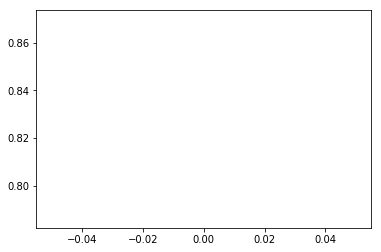

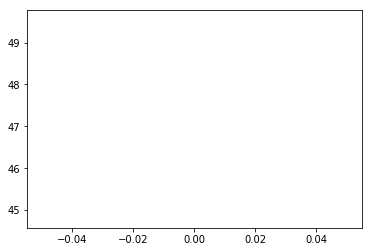

Validation
[0.9625]
[2.9868215173482895]


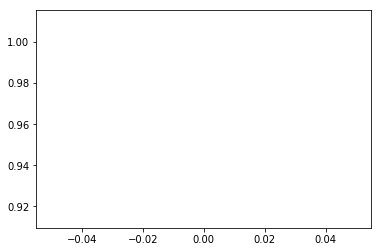

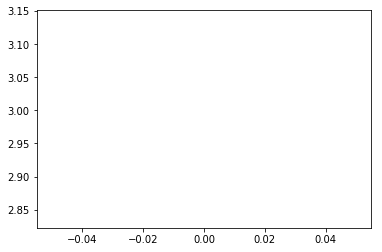


[1] accuracy: 0.963 loss: 2.987

Train
[2, 00020] loss: 2.213 acc: 0.973
[2, 00040] loss: 4.227 acc: 0.971
[2, 00060] loss: 6.195 acc: 0.971
[2, 00080] loss: 7.863 acc: 0.972
[2, 00100] loss: 9.199 acc: 0.974
[0.82796875, 0.9740625]
[47.17337954044342, 9.199239261448383]


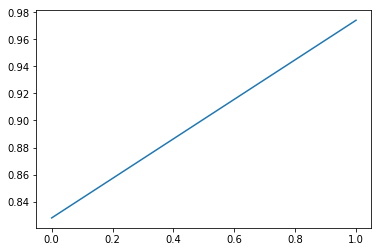

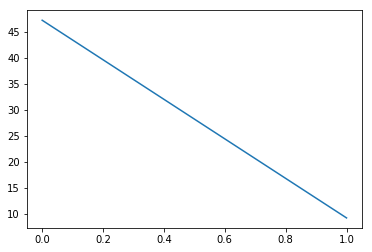

Validation
[0.9625, 0.97625]
[2.9868215173482895, 1.8567501604557037]


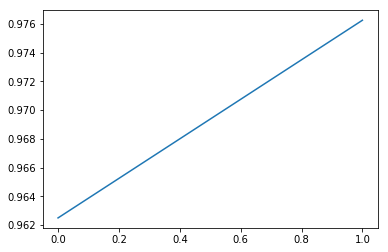

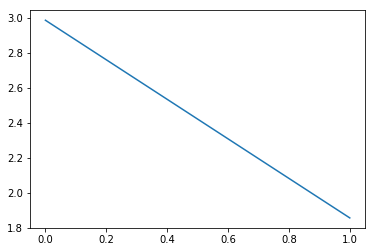


[2] accuracy: 0.976 loss: 1.857

Train
[3, 00020] loss: 1.071 acc: 0.984
[3, 00040] loss: 2.356 acc: 0.982
[3, 00060] loss: 3.152 acc: 0.986
[3, 00080] loss: 4.044 acc: 0.987
[3, 00100] loss: 4.908 acc: 0.988
[0.82796875, 0.9740625, 0.98828125]
[47.17337954044342, 9.199239261448383, 4.907560182735324]


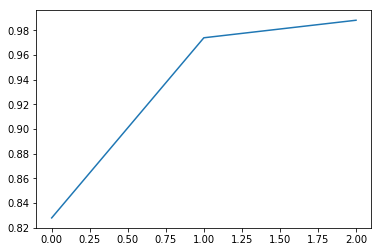

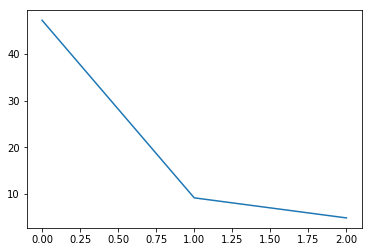

Validation
[0.9625, 0.97625, 0.983125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057]


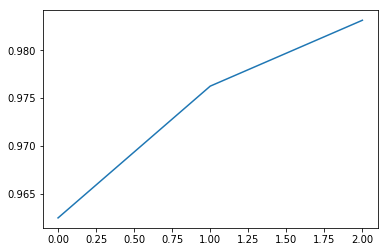

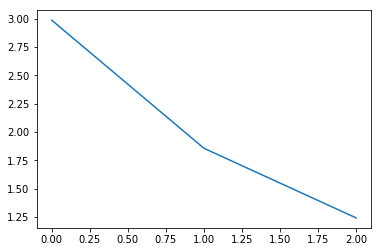


[3] accuracy: 0.983 loss: 1.242

Train
[4, 00020] loss: 0.602 acc: 0.994
[4, 00040] loss: 1.183 acc: 0.993
[4, 00060] loss: 1.846 acc: 0.993
[4, 00080] loss: 2.688 acc: 0.992
[4, 00100] loss: 3.302 acc: 0.992
[0.82796875, 0.9740625, 0.98828125, 0.99171875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961]


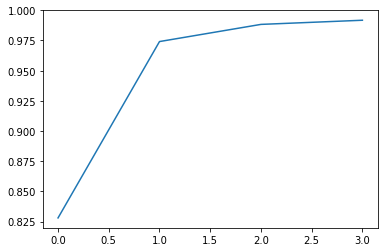

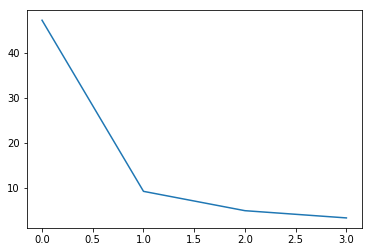

Validation
[0.9625, 0.97625, 0.983125, 0.985]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175]


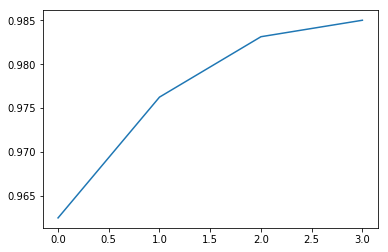

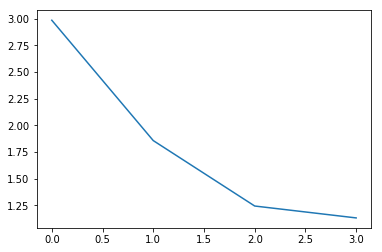


[4] accuracy: 0.985 loss: 1.130

Train
[5, 00020] loss: 0.584 acc: 0.994
[5, 00040] loss: 1.137 acc: 0.993
[5, 00060] loss: 1.548 acc: 0.993
[5, 00080] loss: 1.889 acc: 0.994
[5, 00100] loss: 2.357 acc: 0.994
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197]


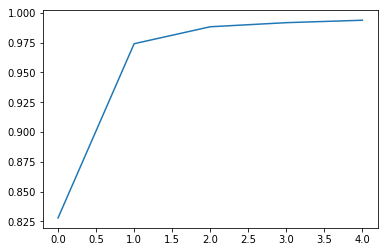

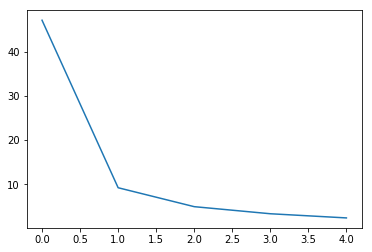

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689]


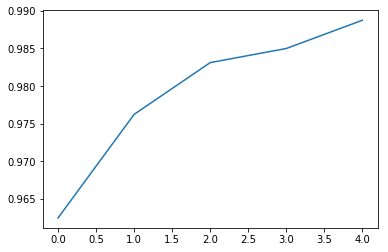

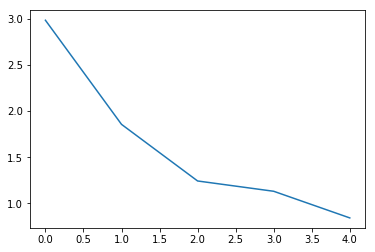


[5] accuracy: 0.989 loss: 0.841

Train
[6, 00020] loss: 0.344 acc: 0.996
[6, 00040] loss: 0.652 acc: 0.997
[6, 00060] loss: 0.919 acc: 0.997
[6, 00080] loss: 1.298 acc: 0.997
[6, 00100] loss: 1.723 acc: 0.997
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315]


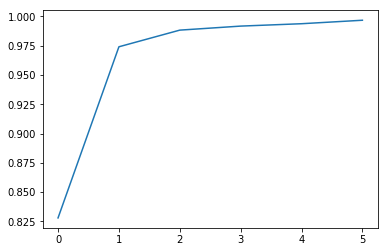

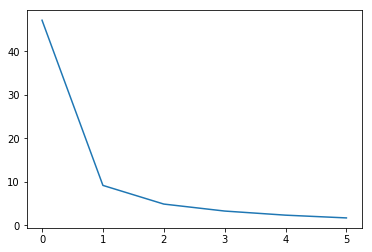

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849]


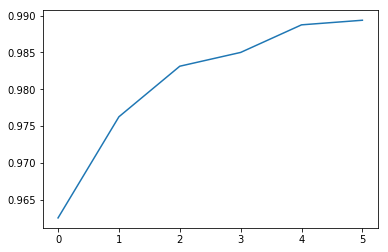

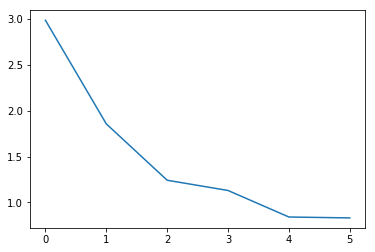


[6] accuracy: 0.989 loss: 0.831

Train
[7, 00020] loss: 0.244 acc: 0.998
[7, 00040] loss: 0.479 acc: 0.998
[7, 00060] loss: 0.698 acc: 0.998
[7, 00080] loss: 1.055 acc: 0.998
[7, 00100] loss: 1.294 acc: 0.998
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846]


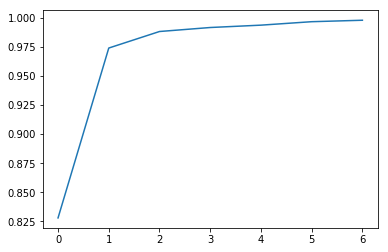

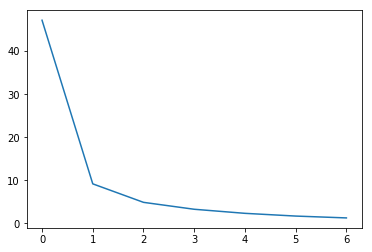

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065]


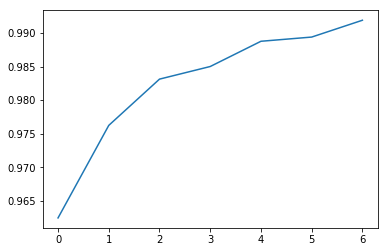

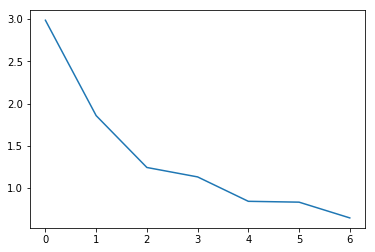


[7] accuracy: 0.992 loss: 0.645

Train
[8, 00020] loss: 0.239 acc: 0.998
[8, 00040] loss: 0.477 acc: 0.998
[8, 00060] loss: 0.683 acc: 0.998
[8, 00080] loss: 0.989 acc: 0.998
[8, 00100] loss: 1.160 acc: 0.998
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487]


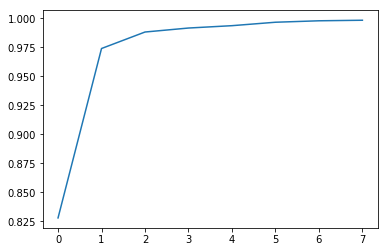

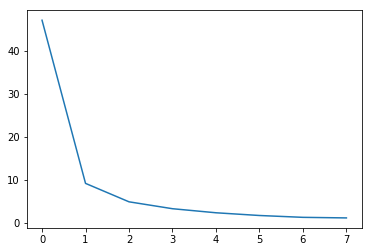

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646]


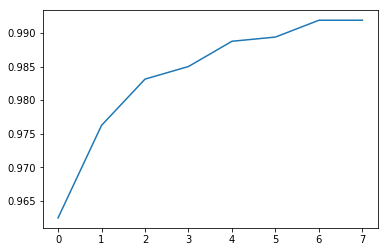

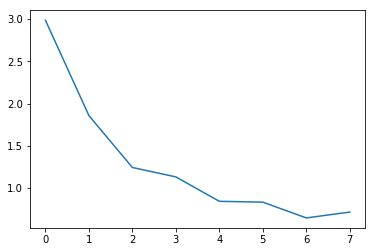


[8] accuracy: 0.992 loss: 0.714

Train
[9, 00020] loss: 0.141 acc: 1.000
[9, 00040] loss: 0.359 acc: 0.999
[9, 00060] loss: 0.546 acc: 0.999
[9, 00080] loss: 0.714 acc: 0.999
[9, 00100] loss: 0.844 acc: 0.999
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936]


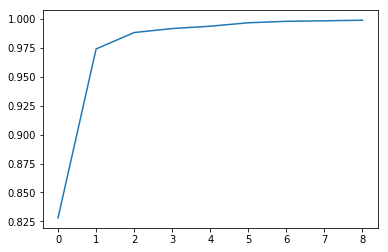

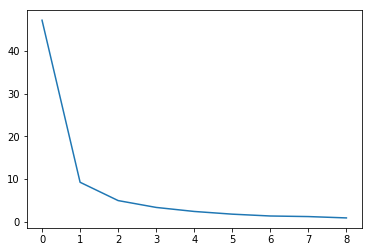

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091]


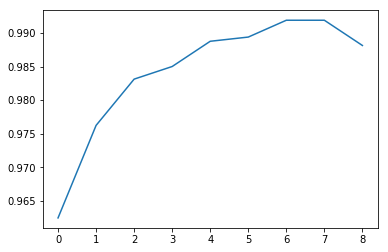

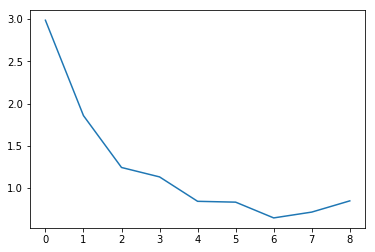


[9] accuracy: 0.988 loss: 0.847

Train
[10, 00020] loss: 0.178 acc: 0.998
[10, 00040] loss: 0.290 acc: 0.999
[10, 00060] loss: 0.443 acc: 0.999
[10, 00080] loss: 0.618 acc: 0.999
[10, 00100] loss: 0.717 acc: 0.999
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287]


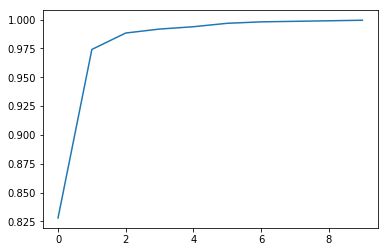

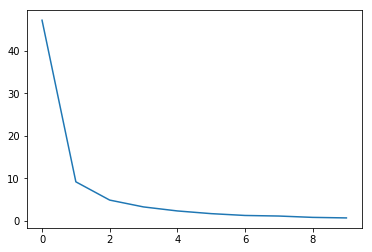

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238]


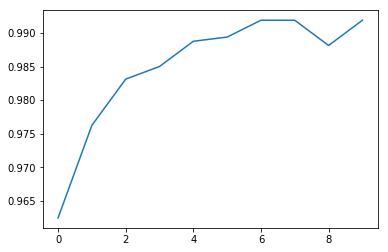

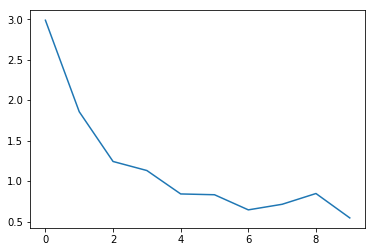


[10] accuracy: 0.992 loss: 0.545

Train
[11, 00020] loss: 0.135 acc: 1.000
[11, 00040] loss: 0.254 acc: 1.000
[11, 00060] loss: 0.422 acc: 1.000
[11, 00080] loss: 0.535 acc: 1.000
[11, 00100] loss: 0.622 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682]


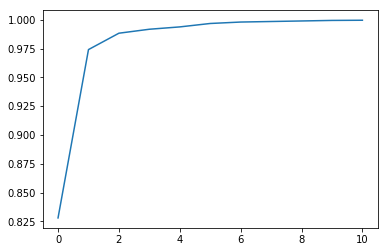

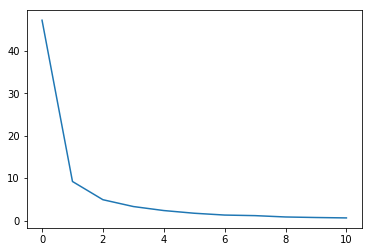

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928]


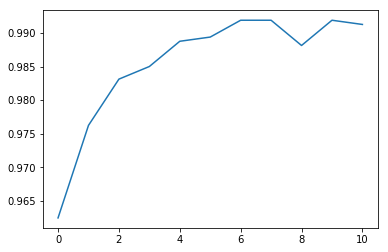

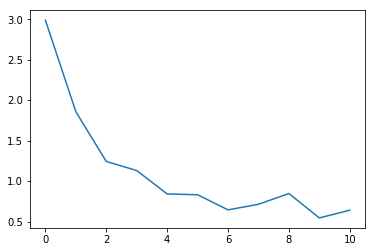


[11] accuracy: 0.991 loss: 0.640

Train
[12, 00020] loss: 0.114 acc: 0.999
[12, 00040] loss: 0.240 acc: 1.000
[12, 00060] loss: 0.366 acc: 1.000
[12, 00080] loss: 0.483 acc: 1.000
[12, 00100] loss: 0.563 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596]


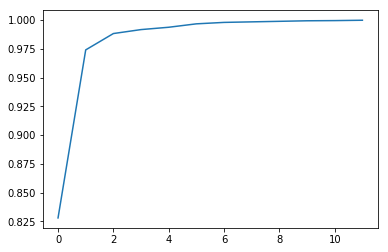

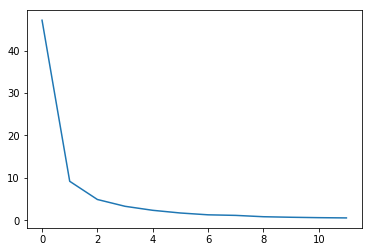

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413]


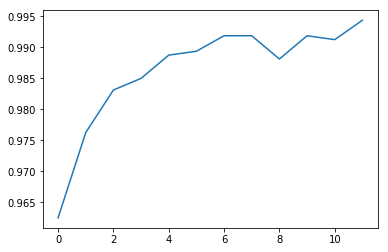

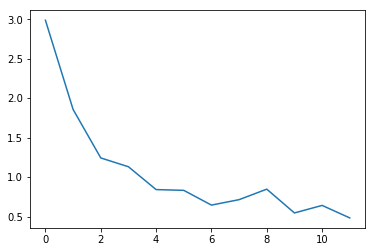


[12] accuracy: 0.994 loss: 0.482

Train
[13, 00020] loss: 0.094 acc: 1.000
[13, 00040] loss: 0.216 acc: 1.000
[13, 00060] loss: 0.325 acc: 1.000
[13, 00080] loss: 0.471 acc: 1.000
[13, 00100] loss: 0.619 acc: 0.999
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724]


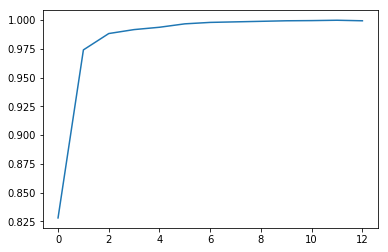

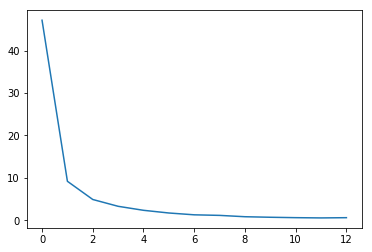

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774]


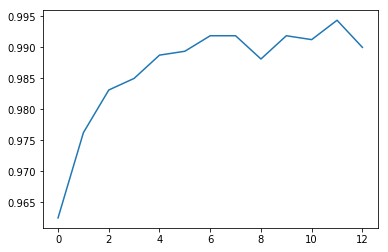

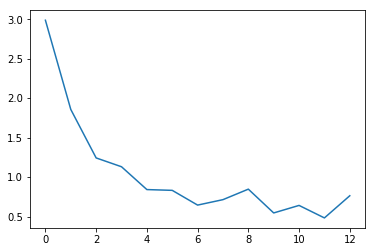


[13] accuracy: 0.990 loss: 0.763

Train
[14, 00020] loss: 0.068 acc: 1.000
[14, 00040] loss: 0.124 acc: 1.000
[14, 00060] loss: 0.219 acc: 1.000
[14, 00080] loss: 0.288 acc: 1.000
[14, 00100] loss: 0.411 acc: 0.999
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978]


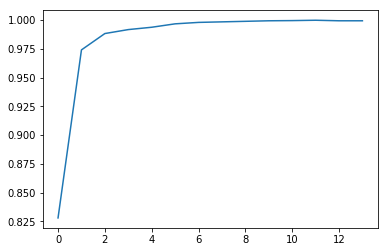

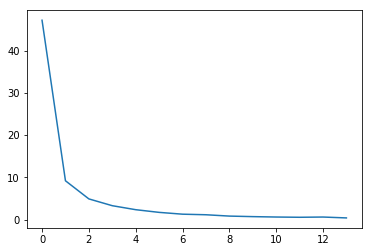

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052]


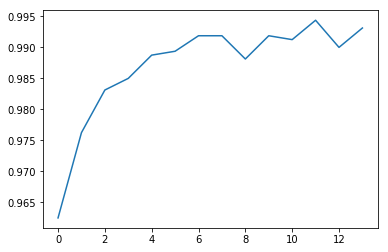

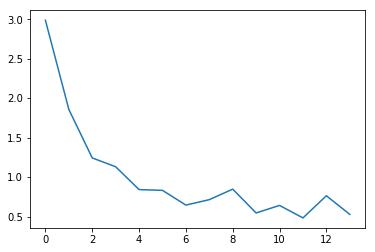


[14] accuracy: 0.993 loss: 0.527

Train
[15, 00020] loss: 0.077 acc: 1.000
[15, 00040] loss: 0.139 acc: 1.000
[15, 00060] loss: 0.196 acc: 1.000
[15, 00080] loss: 0.253 acc: 1.000
[15, 00100] loss: 0.312 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969]


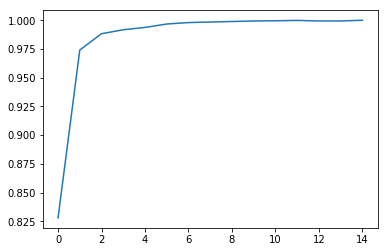

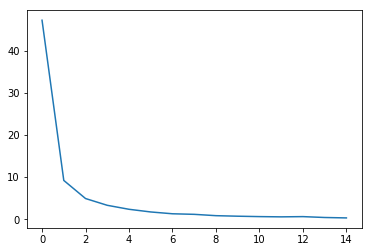

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833]


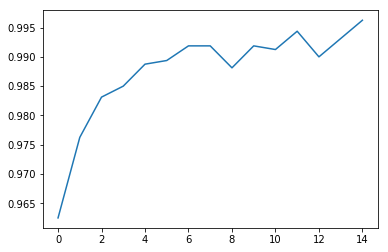

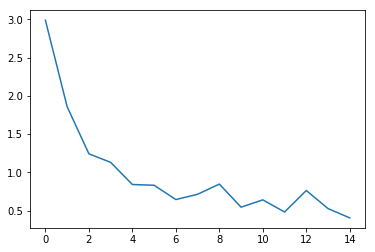


[15] accuracy: 0.996 loss: 0.405

Train
[16, 00020] loss: 0.065 acc: 1.000
[16, 00040] loss: 0.139 acc: 1.000
[16, 00060] loss: 0.212 acc: 1.000
[16, 00080] loss: 0.270 acc: 1.000
[16, 00100] loss: 0.323 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544]


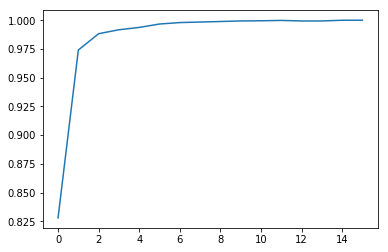

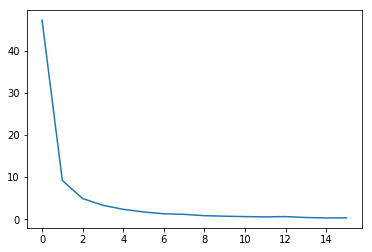

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003]


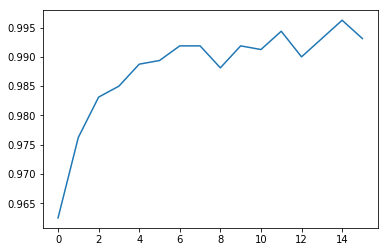

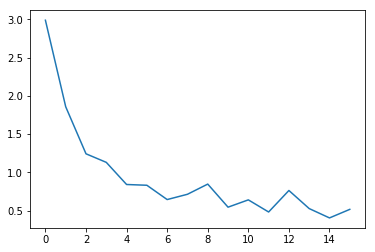


[16] accuracy: 0.993 loss: 0.516

Train
[17, 00020] loss: 0.050 acc: 1.000
[17, 00040] loss: 0.173 acc: 0.999
[17, 00060] loss: 0.233 acc: 0.999
[17, 00080] loss: 0.288 acc: 1.000
[17, 00100] loss: 0.349 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064]


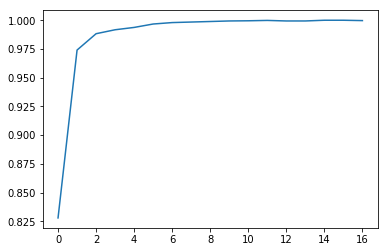

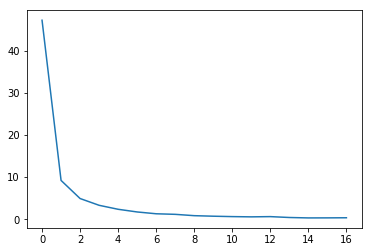

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309]


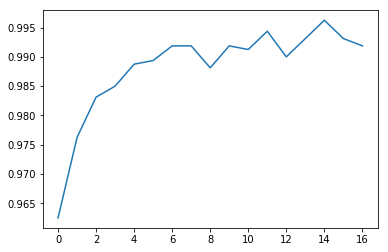

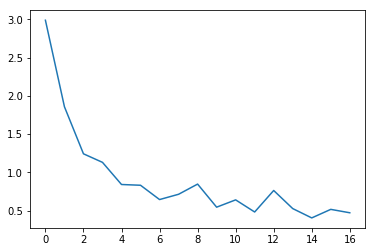


[17] accuracy: 0.992 loss: 0.472

Train
[18, 00020] loss: 0.041 acc: 1.000
[18, 00040] loss: 0.103 acc: 1.000
[18, 00060] loss: 0.154 acc: 1.000
[18, 00080] loss: 0.209 acc: 1.000
[18, 00100] loss: 0.266 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868]


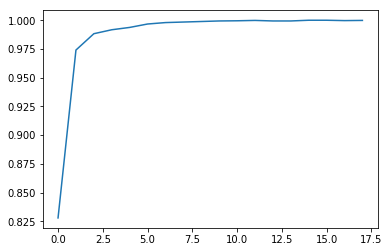

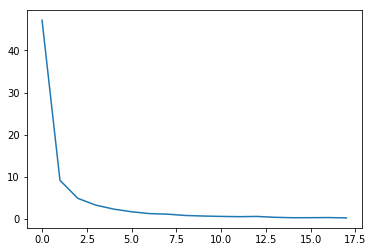

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918]


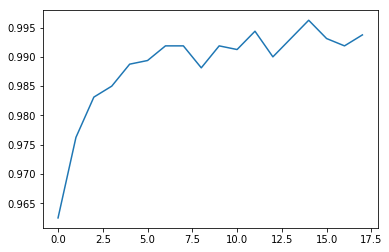

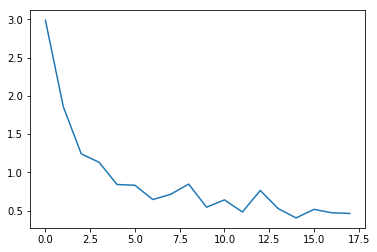


[18] accuracy: 0.994 loss: 0.463

Train
[19, 00020] loss: 0.075 acc: 1.000
[19, 00040] loss: 0.126 acc: 1.000
[19, 00060] loss: 0.188 acc: 1.000
[19, 00080] loss: 0.237 acc: 1.000
[19, 00100] loss: 0.310 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696]


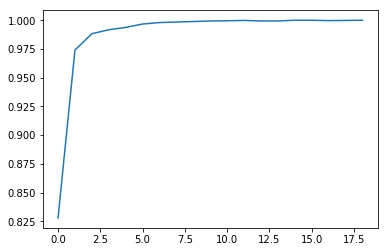

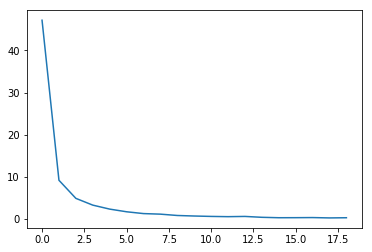

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273]


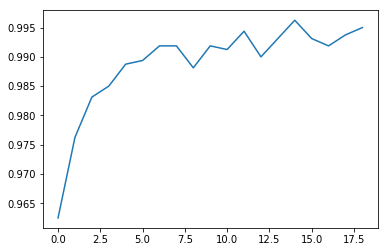

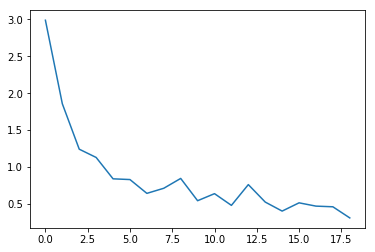


[19] accuracy: 0.995 loss: 0.312

Train
[20, 00020] loss: 0.051 acc: 1.000
[20, 00040] loss: 0.109 acc: 1.000
[20, 00060] loss: 0.195 acc: 1.000
[20, 00080] loss: 0.245 acc: 1.000
[20, 00100] loss: 0.285 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036]


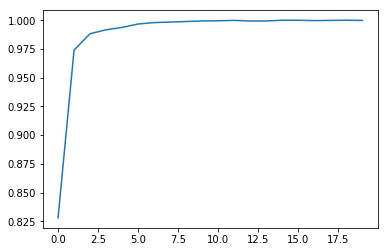

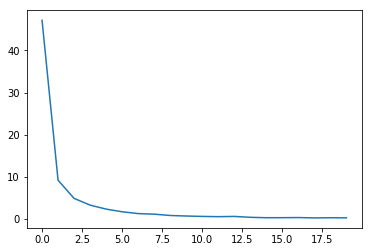

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965]


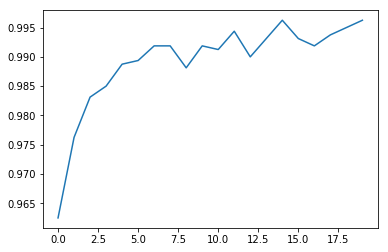

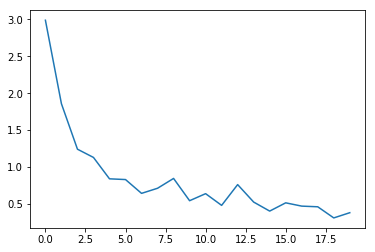


[20] accuracy: 0.996 loss: 0.383

Train
[21, 00020] loss: 0.046 acc: 1.000
[21, 00040] loss: 0.089 acc: 1.000
[21, 00060] loss: 0.124 acc: 1.000
[21, 00080] loss: 0.164 acc: 1.000
[21, 00100] loss: 0.215 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067]


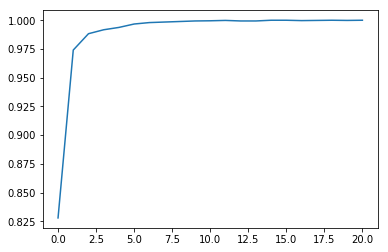

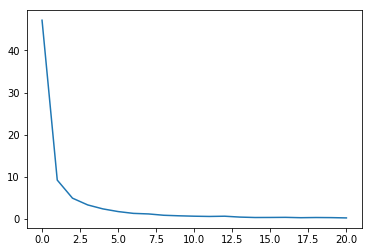

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651]


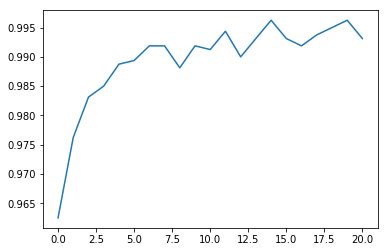

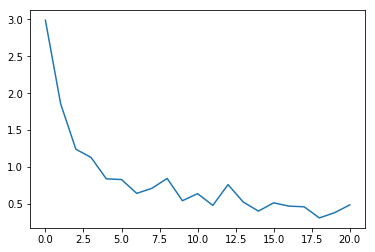


[21] accuracy: 0.993 loss: 0.489

Train
[22, 00020] loss: 0.076 acc: 1.000
[22, 00040] loss: 0.115 acc: 1.000
[22, 00060] loss: 0.160 acc: 1.000
[22, 00080] loss: 0.192 acc: 1.000
[22, 00100] loss: 0.251 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245]


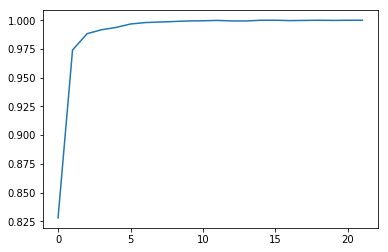

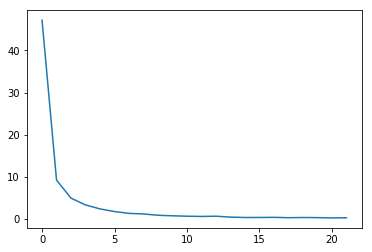

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128]


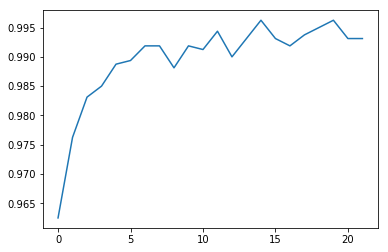

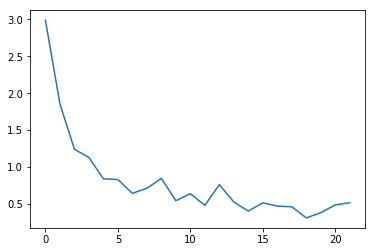


[22] accuracy: 0.993 loss: 0.518

Train
[23, 00020] loss: 0.050 acc: 1.000
[23, 00040] loss: 0.119 acc: 1.000
[23, 00060] loss: 0.155 acc: 1.000
[23, 00080] loss: 0.184 acc: 1.000
[23, 00100] loss: 0.227 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083]


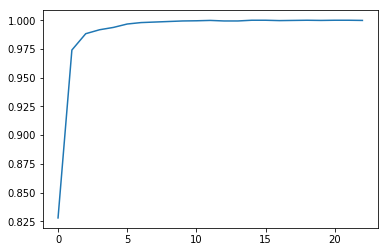

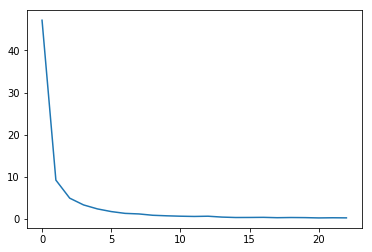

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045]


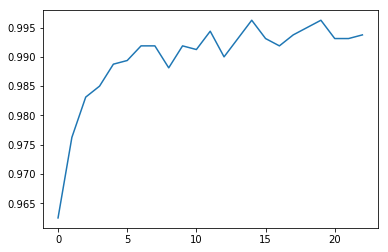

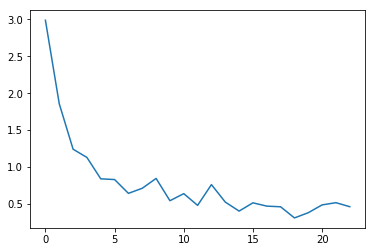


[23] accuracy: 0.994 loss: 0.464

Train
[24, 00020] loss: 0.051 acc: 1.000
[24, 00040] loss: 0.093 acc: 1.000
[24, 00060] loss: 0.148 acc: 1.000
[24, 00080] loss: 0.181 acc: 1.000
[24, 00100] loss: 0.230 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598]


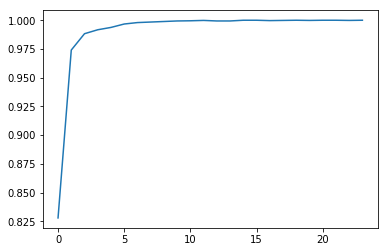

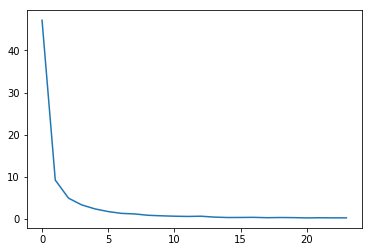

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293]


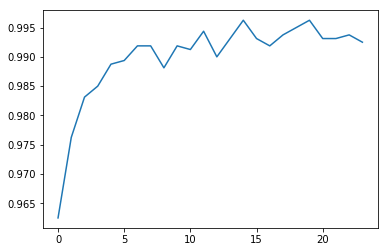

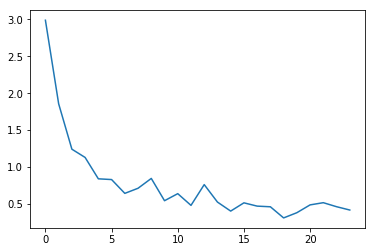


[24] accuracy: 0.993 loss: 0.419

Train
[25, 00020] loss: 0.054 acc: 1.000
[25, 00040] loss: 0.094 acc: 1.000
[25, 00060] loss: 0.118 acc: 1.000
[25, 00080] loss: 0.149 acc: 1.000
[25, 00100] loss: 0.190 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857]


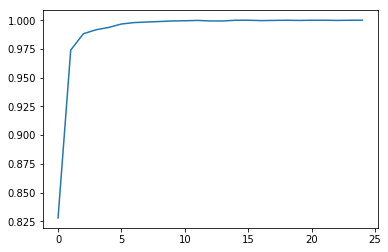

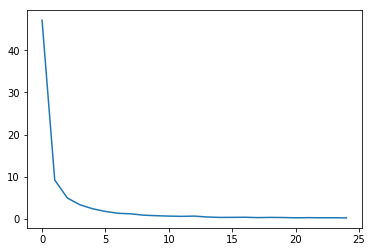

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823]


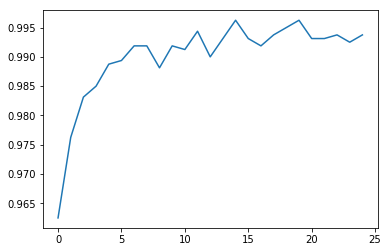

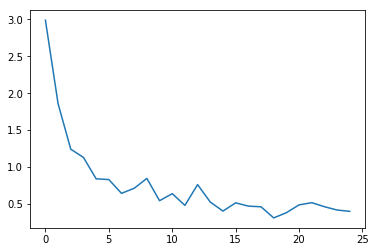


[25] accuracy: 0.994 loss: 0.401

Train
[26, 00020] loss: 0.048 acc: 0.999
[26, 00040] loss: 0.101 acc: 0.999
[26, 00060] loss: 0.177 acc: 0.999
[26, 00080] loss: 0.213 acc: 1.000
[26, 00100] loss: 0.256 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857, 0.2558737024664879]


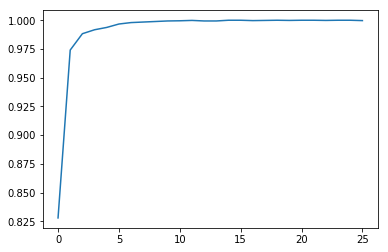

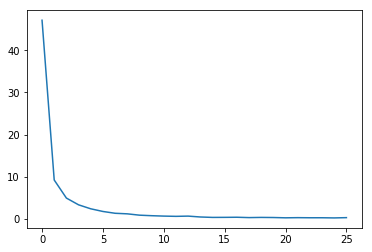

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455]


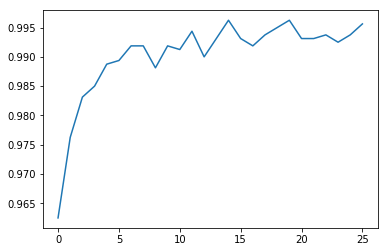

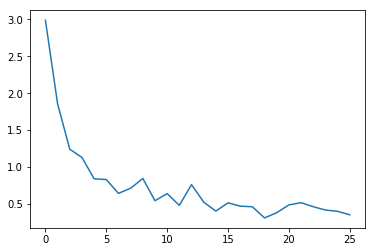


[26] accuracy: 0.996 loss: 0.354

Train
[27, 00020] loss: 0.038 acc: 1.000
[27, 00040] loss: 0.077 acc: 1.000
[27, 00060] loss: 0.116 acc: 1.000
[27, 00080] loss: 0.160 acc: 1.000
[27, 00100] loss: 0.202 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857, 0.2558737024664879, 0.2018411

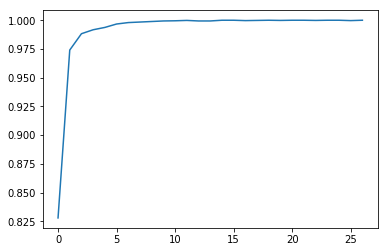

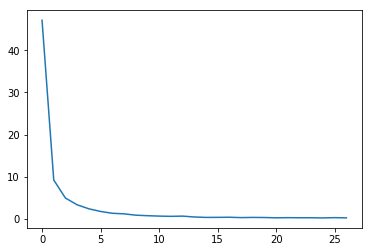

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186]


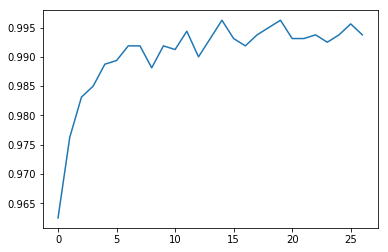

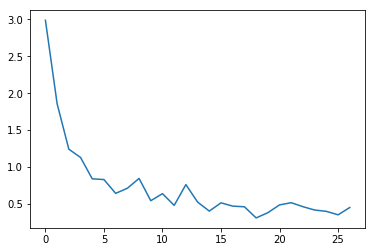


[27] accuracy: 0.994 loss: 0.453

Train
[28, 00020] loss: 0.025 acc: 1.000
[28, 00040] loss: 0.058 acc: 1.000
[28, 00060] loss: 0.088 acc: 1.000
[28, 00080] loss: 0.128 acc: 1.000
[28, 00100] loss: 0.162 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857, 0.2558737024664879, 0.20

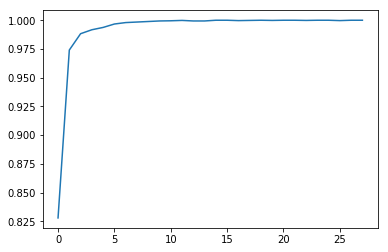

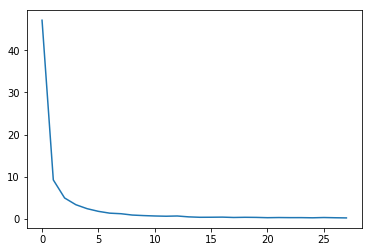

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782]


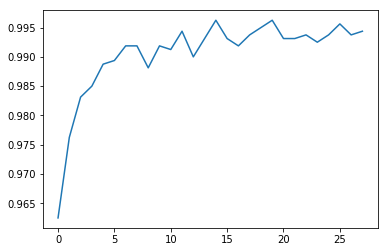

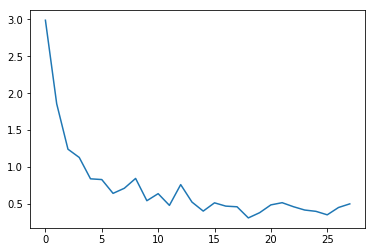


[28] accuracy: 0.994 loss: 0.502

Train
[29, 00020] loss: 0.025 acc: 1.000
[29, 00040] loss: 0.047 acc: 1.000
[29, 00060] loss: 0.083 acc: 1.000
[29, 00080] loss: 0.109 acc: 1.000
[29, 00100] loss: 0.144 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857, 0.2558737024664879,

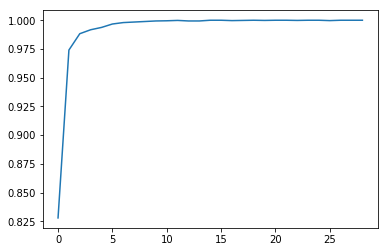

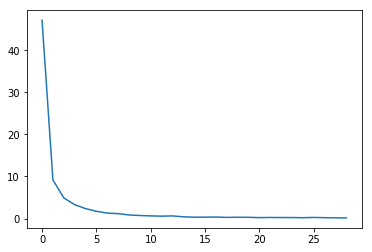

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659]


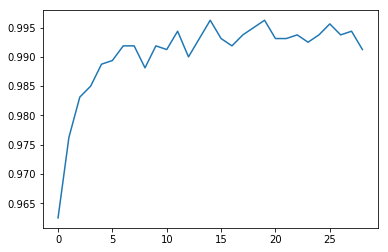

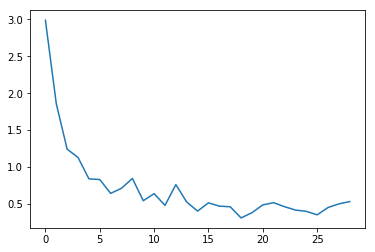


[29] accuracy: 0.991 loss: 0.533

Train
[30, 00020] loss: 0.020 acc: 1.000
[30, 00040] loss: 0.053 acc: 1.000
[30, 00060] loss: 0.075 acc: 1.000
[30, 00080] loss: 0.120 acc: 1.000
[30, 00100] loss: 0.150 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857, 0.25587

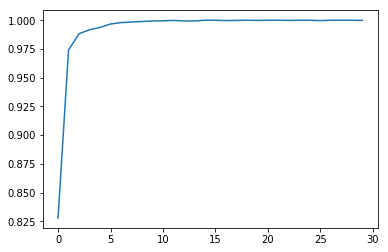

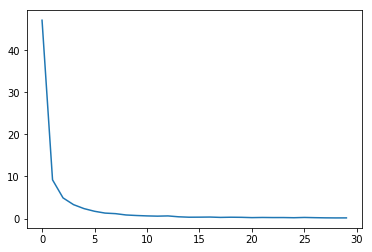

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606]


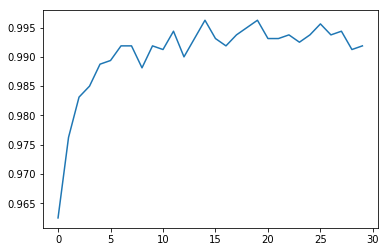

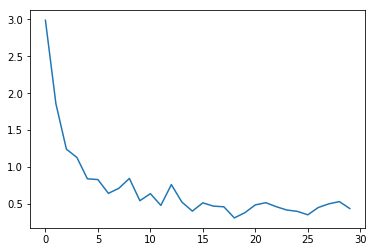


[30] accuracy: 0.992 loss: 0.439

Train
[31, 00020] loss: 0.024 acc: 1.000
[31, 00040] loss: 0.048 acc: 1.000
[31, 00060] loss: 0.074 acc: 1.000
[31, 00080] loss: 0.124 acc: 1.000
[31, 00100] loss: 0.186 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020500034093857, 0.

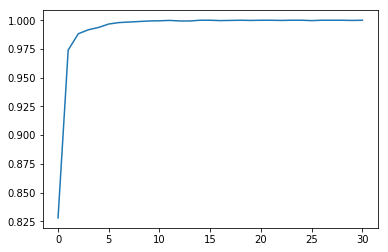

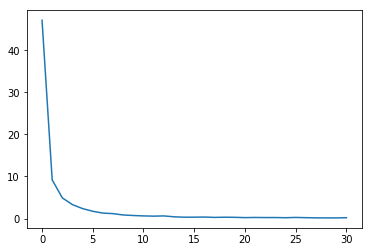

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735]


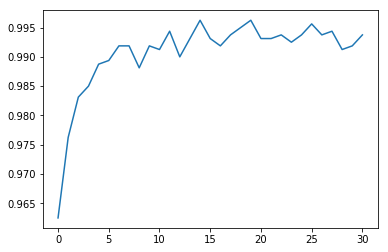

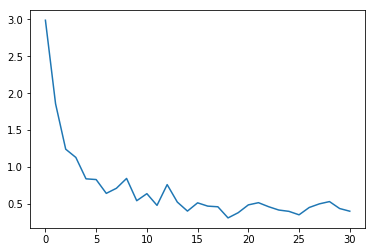


[31] accuracy: 0.994 loss: 0.403

Train
[32, 00020] loss: 0.065 acc: 0.999
[32, 00040] loss: 0.093 acc: 1.000
[32, 00060] loss: 0.151 acc: 0.999
[32, 00080] loss: 0.183 acc: 1.000
[32, 00100] loss: 0.230 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.1902050003

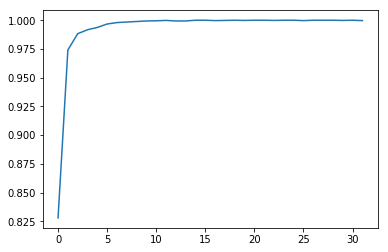

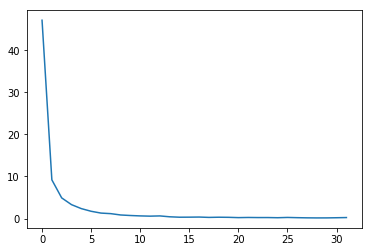

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.5086175203323364]


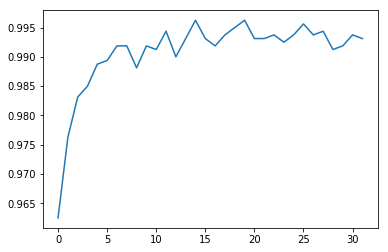

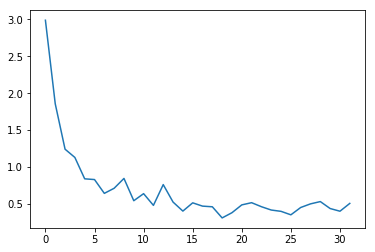


[32] accuracy: 0.993 loss: 0.509

Train
[33, 00020] loss: 0.054 acc: 1.000
[33, 00040] loss: 0.079 acc: 1.000
[33, 00060] loss: 0.097 acc: 1.000
[33, 00080] loss: 0.127 acc: 1.000
[33, 00100] loss: 0.166 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255598, 0.19020

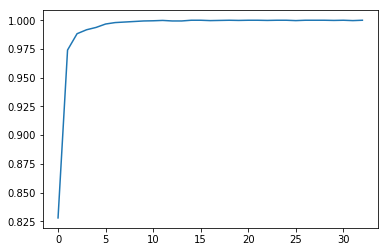

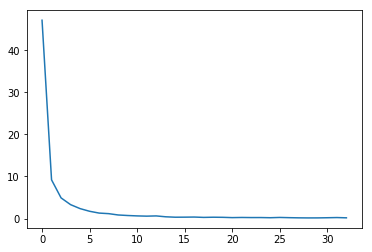

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.5086175203323364, 0.4368675835430622]


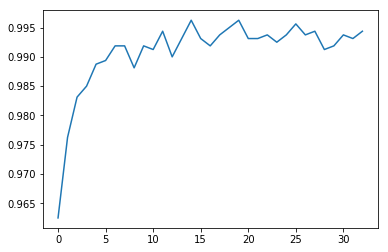

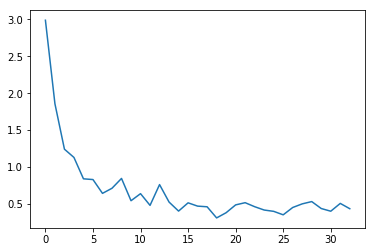


[33] accuracy: 0.994 loss: 0.437

Train
[34, 00020] loss: 0.032 acc: 1.000
[34, 00040] loss: 0.062 acc: 1.000
[34, 00060] loss: 0.107 acc: 1.000
[34, 00080] loss: 0.123 acc: 1.000
[34, 00100] loss: 0.164 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.23020848911255

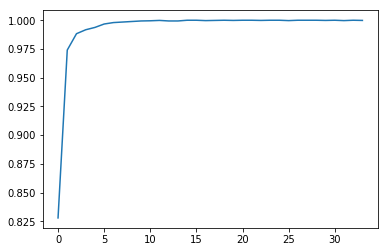

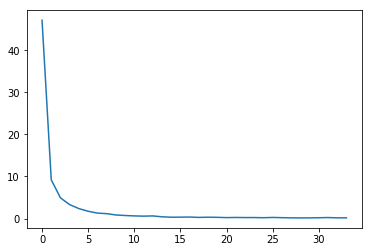

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.5086175203323364, 0.4368675835430622, 0.7025

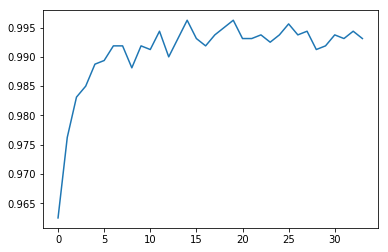

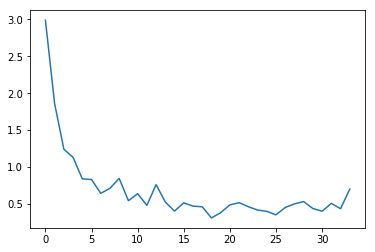


[34] accuracy: 0.993 loss: 0.703

Train
[35, 00020] loss: 0.031 acc: 1.000
[35, 00040] loss: 0.061 acc: 1.000
[35, 00060] loss: 0.090 acc: 1.000
[35, 00080] loss: 0.118 acc: 1.000
[35, 00100] loss: 0.137 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.230208489

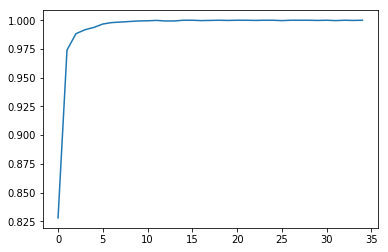

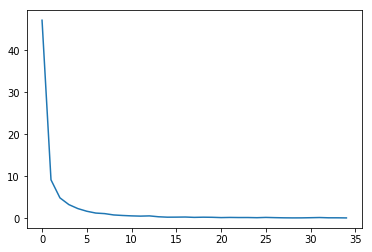

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.5086175203323364, 0.436867583543062

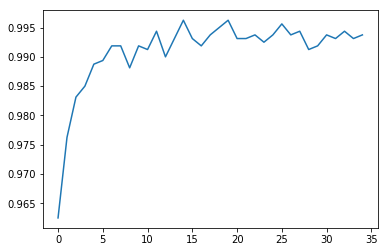

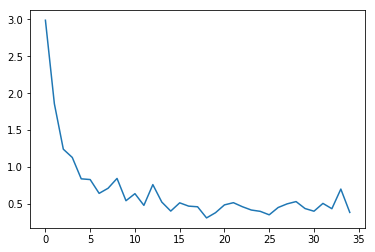


[35] accuracy: 0.994 loss: 0.387

Train
[36, 00020] loss: 0.024 acc: 1.000
[36, 00040] loss: 0.044 acc: 1.000
[36, 00060] loss: 0.077 acc: 1.000
[36, 00080] loss: 0.100 acc: 1.000
[36, 00100] loss: 0.132 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244083, 0.2302

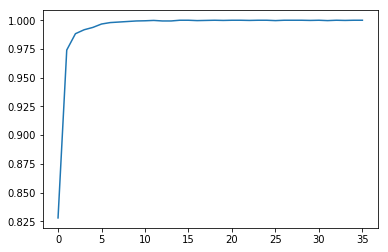

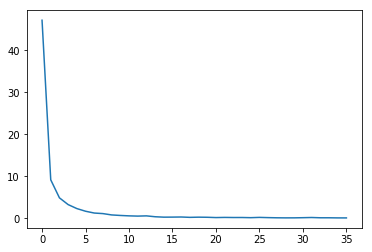

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.5086175203323364, 0.43686

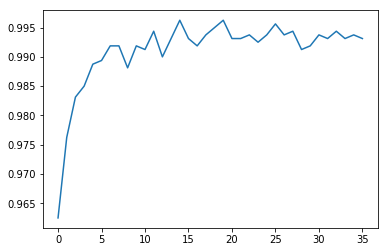

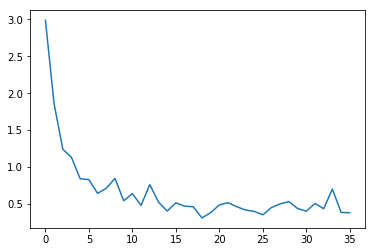


[36] accuracy: 0.993 loss: 0.382

Train
[37, 00020] loss: 0.015 acc: 1.000
[37, 00040] loss: 0.042 acc: 1.000
[37, 00060] loss: 0.086 acc: 0.999
[37, 00080] loss: 0.107 acc: 1.000
[37, 00100] loss: 0.127 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.22728163935244

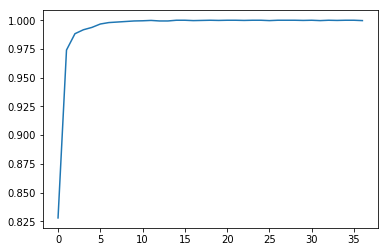

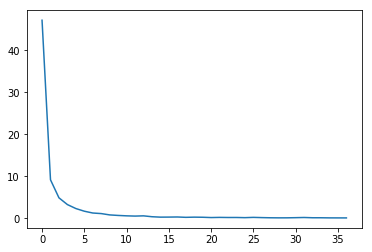

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.508617520332336

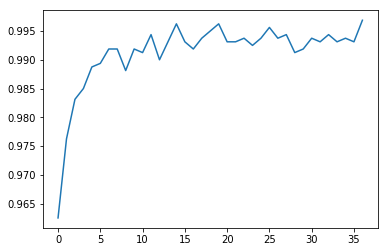

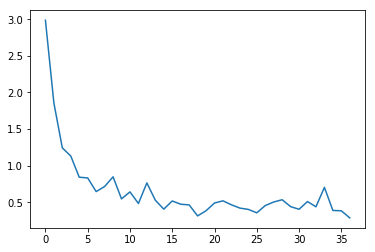


[37] accuracy: 0.997 loss: 0.285

Train
[38, 00020] loss: 0.024 acc: 1.000
[38, 00040] loss: 0.039 acc: 1.000
[38, 00060] loss: 0.059 acc: 1.000
[38, 00080] loss: 0.078 acc: 1.000
[38, 00100] loss: 0.100 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.227281639

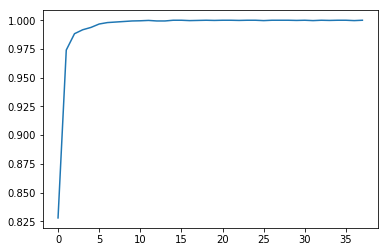

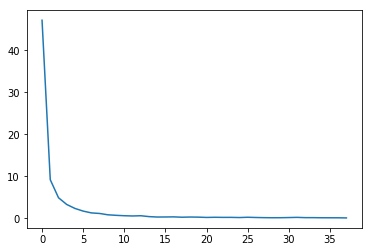

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 0.50861

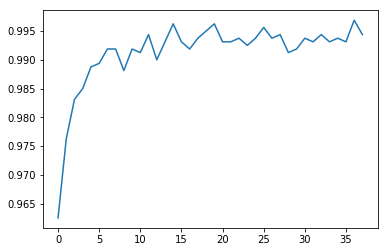

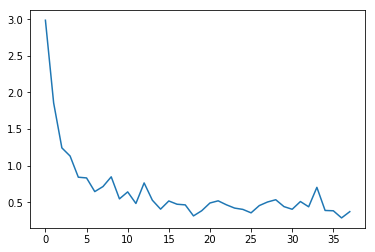


[38] accuracy: 0.994 loss: 0.370

Train
[39, 00020] loss: 0.022 acc: 1.000
[39, 00040] loss: 0.034 acc: 1.000
[39, 00060] loss: 0.045 acc: 1.000
[39, 00080] loss: 0.059 acc: 1.000
[39, 00100] loss: 0.087 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0.2272

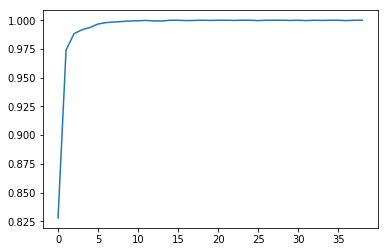

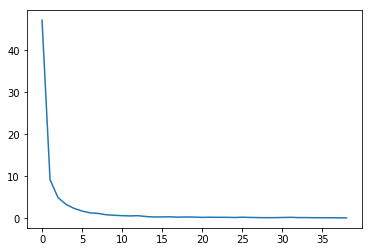

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.40296318009495735, 

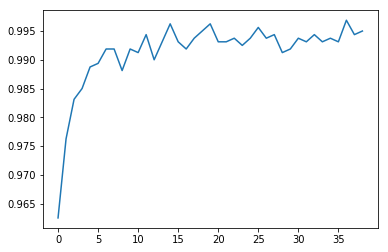

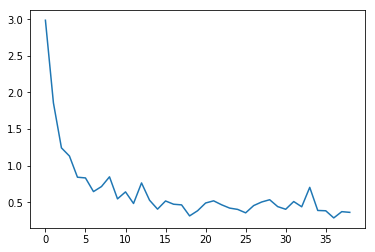


[39] accuracy: 0.995 loss: 0.361

Train
[40, 00020] loss: 0.016 acc: 1.000
[40, 00040] loss: 0.028 acc: 1.000
[40, 00060] loss: 0.050 acc: 1.000
[40, 00080] loss: 0.064 acc: 1.000
[40, 00100] loss: 0.077 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513838317245245, 0

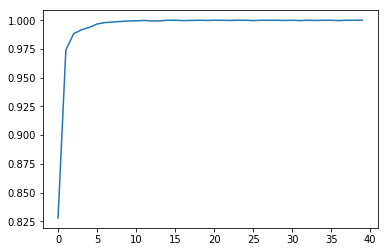

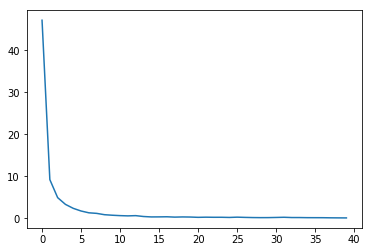

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0.402963180

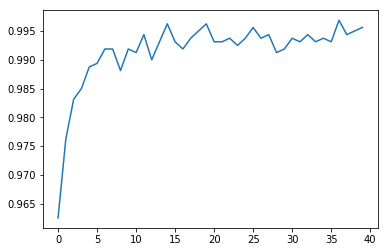

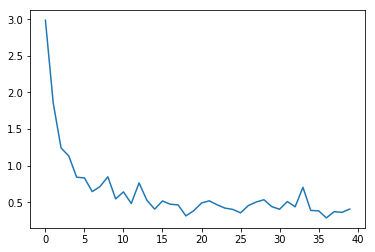


[40] accuracy: 0.996 loss: 0.406

Train
[41, 00020] loss: 0.019 acc: 1.000
[41, 00040] loss: 0.033 acc: 1.000
[41, 00060] loss: 0.055 acc: 1.000
[41, 00080] loss: 0.068 acc: 1.000
[41, 00100] loss: 0.086 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.25138383172452

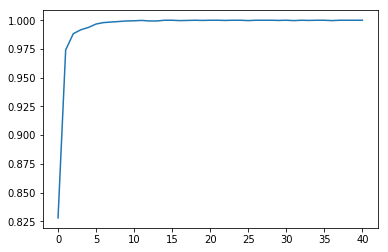

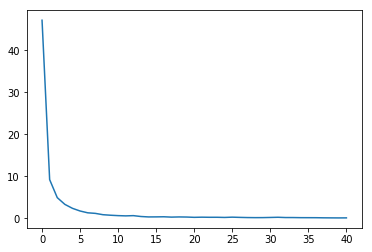

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.43931153416633606, 0

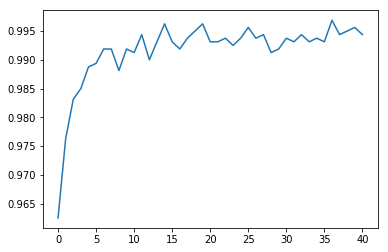

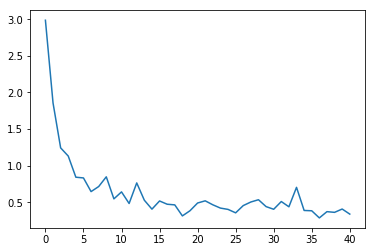


[41] accuracy: 0.994 loss: 0.337

Train
[42, 00020] loss: 0.031 acc: 1.000
[42, 00040] loss: 0.049 acc: 1.000
[42, 00060] loss: 0.072 acc: 1.000
[42, 00080] loss: 0.094 acc: 1.000
[42, 00100] loss: 0.109 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.251383831

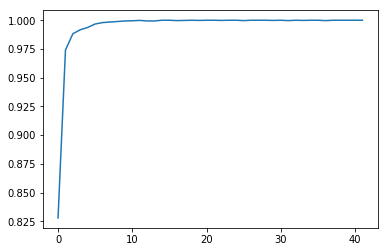

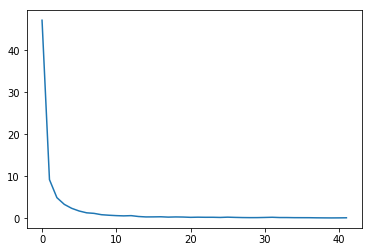

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.4393115341

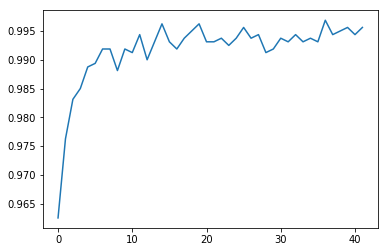

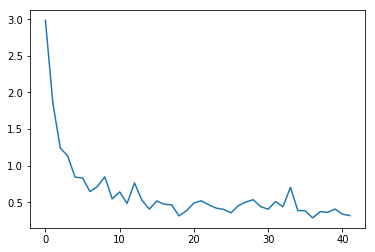


[42] accuracy: 0.996 loss: 0.317

Train
[43, 00020] loss: 0.029 acc: 1.000
[43, 00040] loss: 0.045 acc: 1.000
[43, 00060] loss: 0.059 acc: 1.000
[43, 00080] loss: 0.074 acc: 1.000
[43, 00100] loss: 0.087 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0.2513

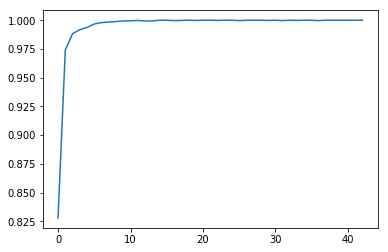

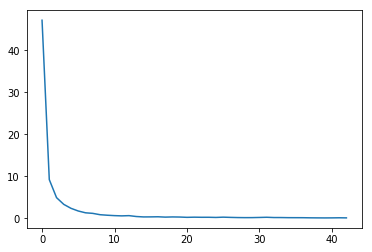

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.533325556665659, 0.4

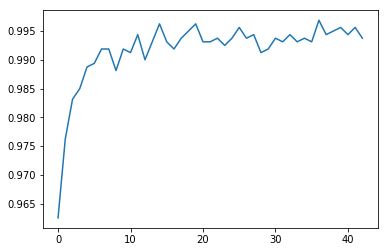

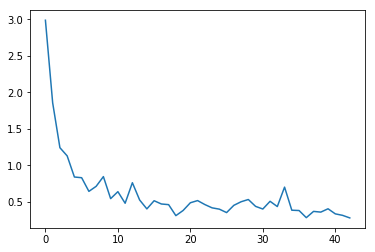


[43] accuracy: 0.994 loss: 0.281

Train
[44, 00020] loss: 0.017 acc: 1.000
[44, 00040] loss: 0.034 acc: 1.000
[44, 00060] loss: 0.057 acc: 1.000
[44, 00080] loss: 0.072 acc: 1.000
[44, 00100] loss: 0.096 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147844210267067, 0

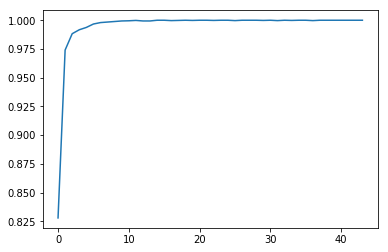

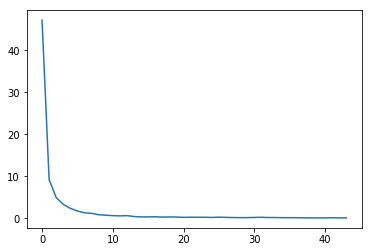

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.5333255566

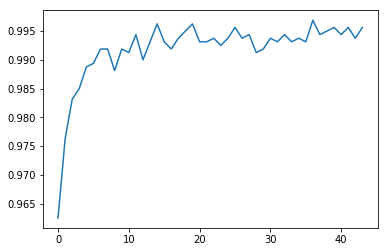

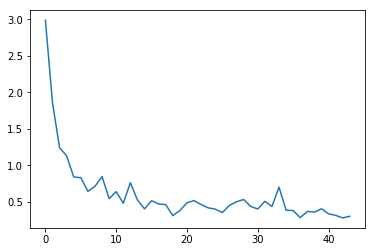


[44] accuracy: 0.996 loss: 0.304

Train
[45, 00020] loss: 0.013 acc: 1.000
[45, 00040] loss: 0.026 acc: 1.000
[45, 00060] loss: 0.041 acc: 1.000
[45, 00080] loss: 0.066 acc: 1.000
[45, 00100] loss: 0.086 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.21478442102670

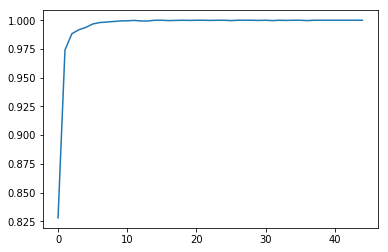

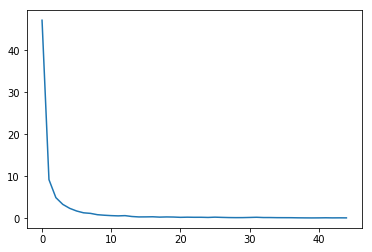

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566657782, 0.

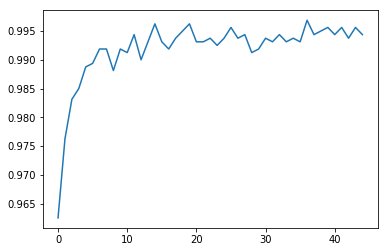

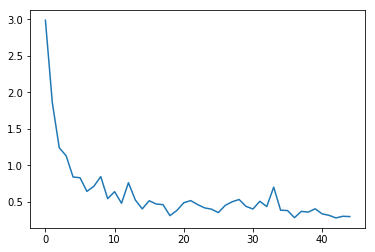


[45] accuracy: 0.994 loss: 0.300

Train
[46, 00020] loss: 0.011 acc: 1.000
[46, 00040] loss: 0.023 acc: 1.000
[46, 00060] loss: 0.055 acc: 1.000
[46, 00080] loss: 0.080 acc: 1.000
[46, 00100] loss: 0.098 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.214784421

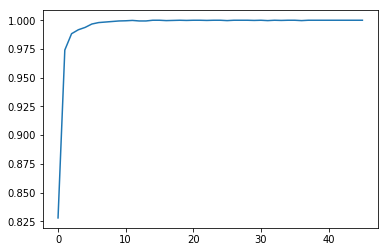

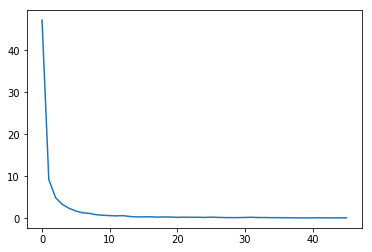

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.5023660566

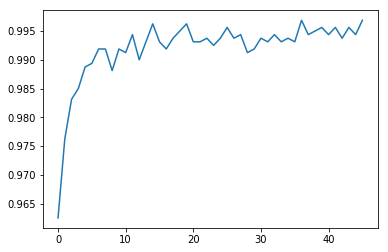

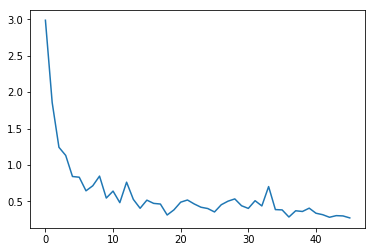


[46] accuracy: 0.997 loss: 0.272

Train
[47, 00020] loss: 0.019 acc: 1.000
[47, 00040] loss: 0.034 acc: 1.000
[47, 00060] loss: 0.046 acc: 1.000
[47, 00080] loss: 0.059 acc: 1.000
[47, 00100] loss: 0.075 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967867583036, 0.2147

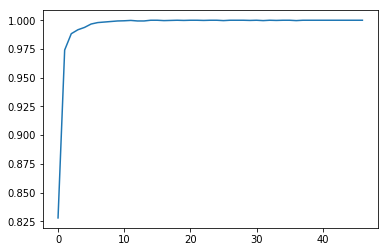

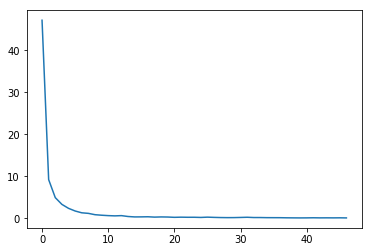

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273557186, 0.

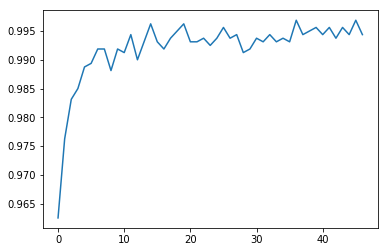

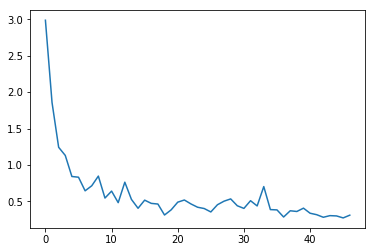


[47] accuracy: 0.994 loss: 0.310

Train
[48, 00020] loss: 0.014 acc: 1.000
[48, 00040] loss: 0.050 acc: 1.000
[48, 00060] loss: 0.061 acc: 1.000
[48, 00080] loss: 0.079 acc: 1.000
[48, 00100] loss: 0.100 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.2845496786758

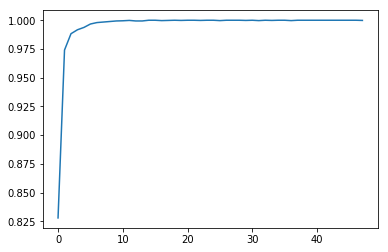

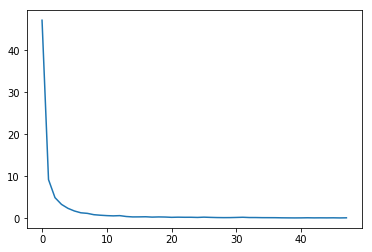

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.45332067273

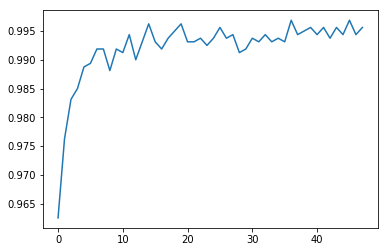

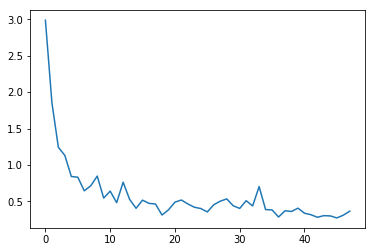


[48] accuracy: 0.996 loss: 0.365

Train
[49, 00020] loss: 0.009 acc: 1.000
[49, 00040] loss: 0.022 acc: 1.000
[49, 00060] loss: 0.038 acc: 1.000
[49, 00080] loss: 0.054 acc: 1.000
[49, 00100] loss: 0.077 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.28454967

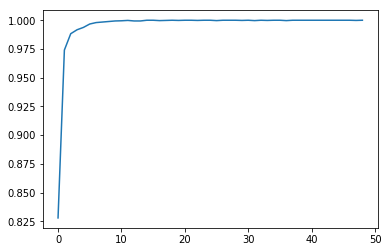

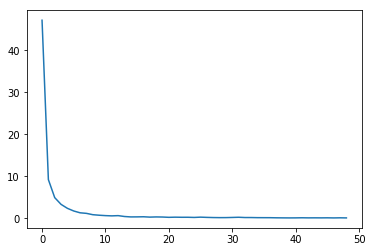

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.35421196930110455, 0.4

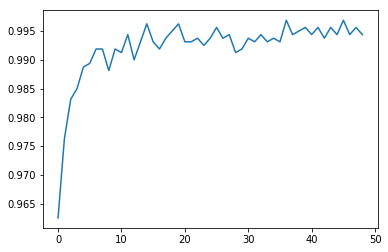

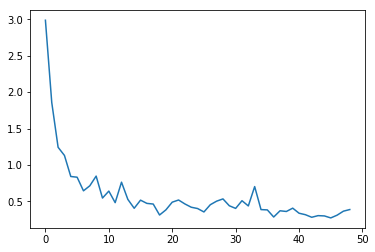


[49] accuracy: 0.994 loss: 0.387

Train
[50, 00020] loss: 0.021 acc: 1.000
[50, 00040] loss: 0.032 acc: 1.000
[50, 00060] loss: 0.072 acc: 1.000
[50, 00080] loss: 0.086 acc: 1.000
[50, 00100] loss: 0.118 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 0.284

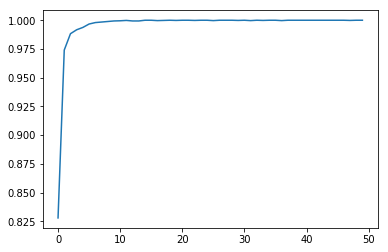

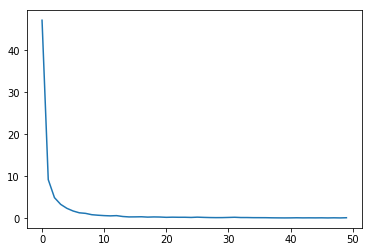

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.354211969301

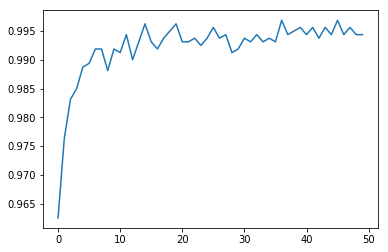

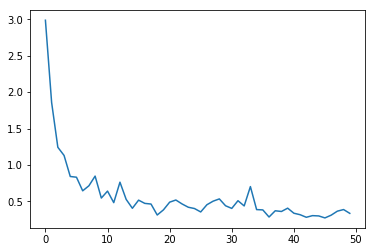


[50] accuracy: 0.994 loss: 0.335

Train
[51, 00020] loss: 0.009 acc: 1.000
[51, 00040] loss: 0.023 acc: 1.000
[51, 00060] loss: 0.034 acc: 1.000
[51, 00080] loss: 0.049 acc: 1.000
[51, 00100] loss: 0.062 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368696, 

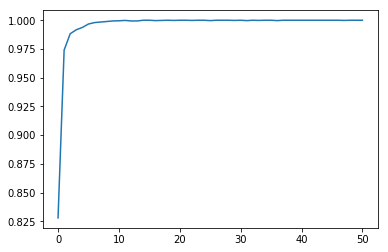

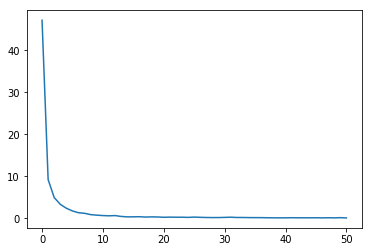

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118206292390823, 0.354

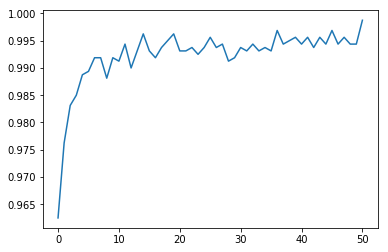

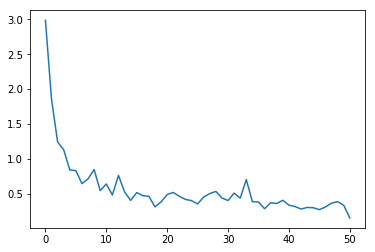


[51] accuracy: 0.999 loss: 0.154

Train
[52, 00020] loss: 0.017 acc: 1.000
[52, 00040] loss: 0.032 acc: 1.000
[52, 00060] loss: 0.042 acc: 1.000
[52, 00080] loss: 0.052 acc: 1.000
[52, 00100] loss: 0.065 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.3097050469368

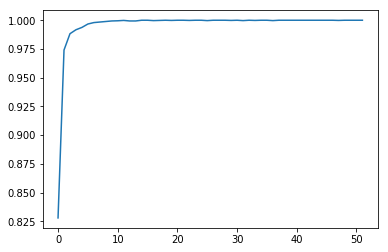

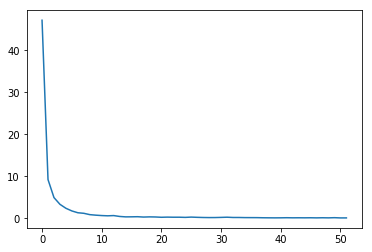

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.401182062923908

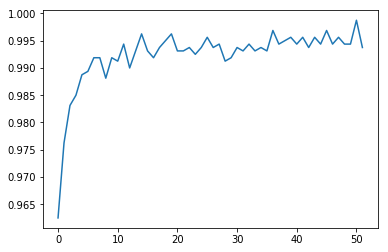

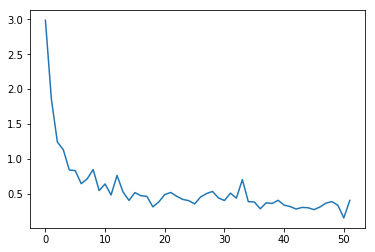


[52] accuracy: 0.994 loss: 0.405

Train
[53, 00020] loss: 0.013 acc: 1.000
[53, 00040] loss: 0.024 acc: 1.000
[53, 00060] loss: 0.038 acc: 1.000
[53, 00080] loss: 0.053 acc: 1.000
[53, 00100] loss: 0.067 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.30970504

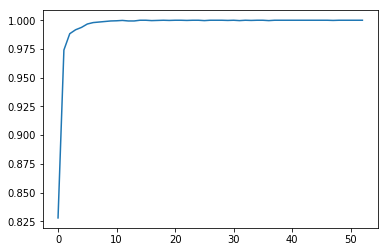

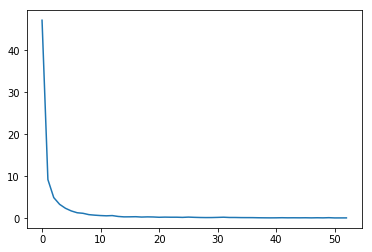

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293, 0.40118

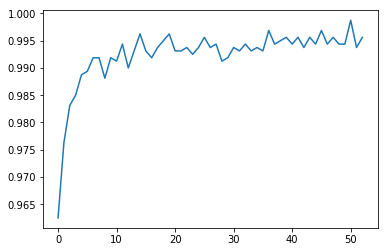

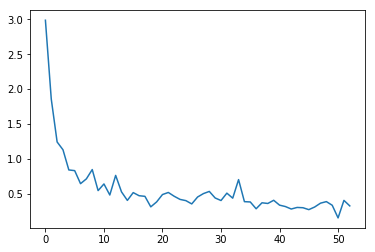


[53] accuracy: 0.996 loss: 0.326

Train
[54, 00020] loss: 0.016 acc: 1.000
[54, 00040] loss: 0.024 acc: 1.000
[54, 00060] loss: 0.031 acc: 1.000
[54, 00080] loss: 0.051 acc: 1.000
[54, 00100] loss: 0.069 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 0.309

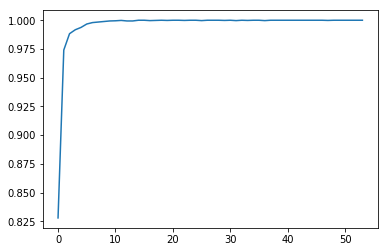

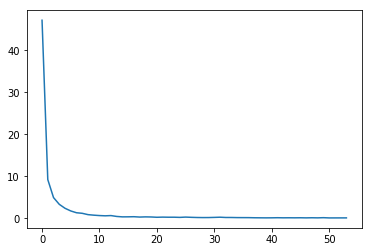

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.41902916319668293

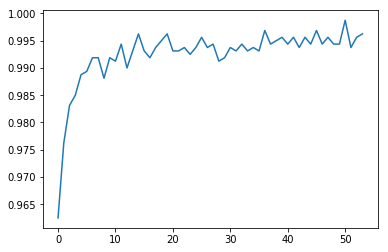

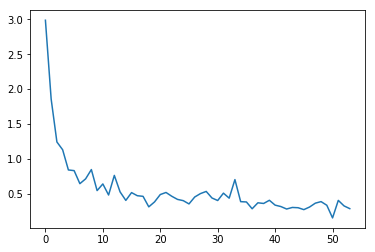


[54] accuracy: 0.996 loss: 0.287

Train
[55, 00020] loss: 0.028 acc: 1.000
[55, 00040] loss: 0.037 acc: 1.000
[55, 00060] loss: 0.047 acc: 1.000
[55, 00080] loss: 0.054 acc: 1.000
[55, 00100] loss: 0.066 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465868, 

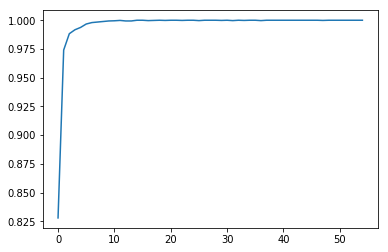

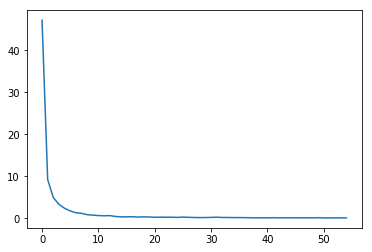

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.4190291631

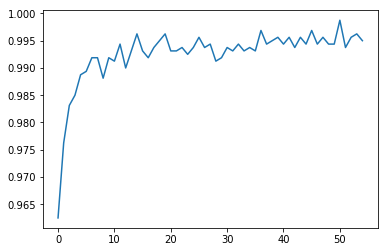

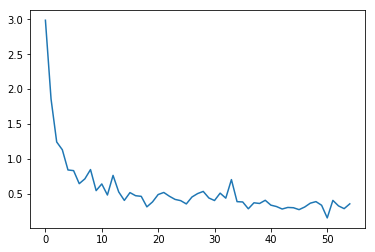


[55] accuracy: 0.995 loss: 0.355

Train
[56, 00020] loss: 0.011 acc: 1.000
[56, 00040] loss: 0.017 acc: 1.000
[56, 00060] loss: 0.032 acc: 1.000
[56, 00080] loss: 0.045 acc: 1.000
[56, 00100] loss: 0.061 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.266472477465

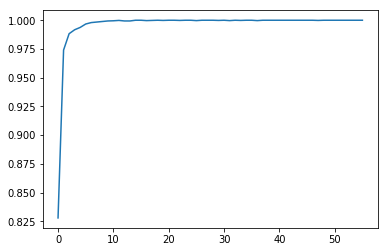

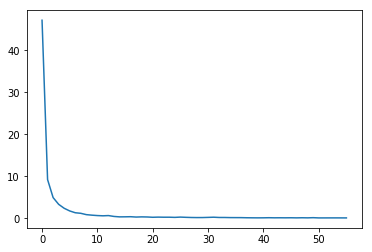

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.4640468545258045, 0.4

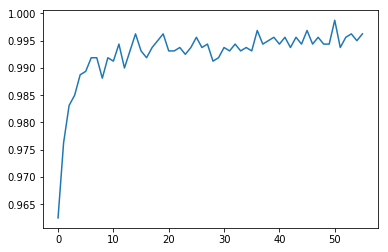

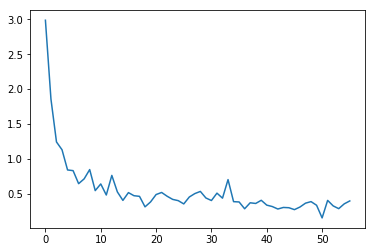


[56] accuracy: 0.996 loss: 0.397

Train
[57, 00020] loss: 0.009 acc: 1.000
[57, 00040] loss: 0.021 acc: 1.000
[57, 00060] loss: 0.038 acc: 1.000
[57, 00080] loss: 0.045 acc: 1.000
[57, 00100] loss: 0.064 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.2664724

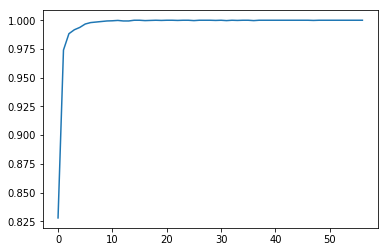

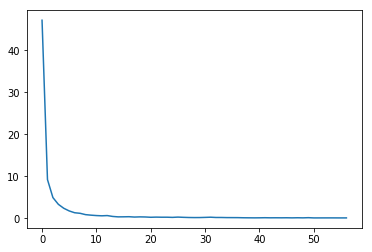

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.464046854525

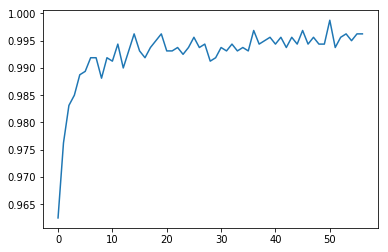

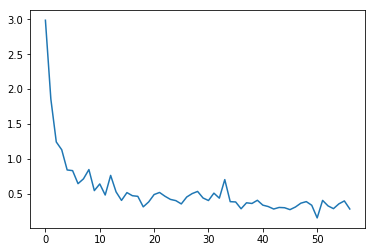


[57] accuracy: 0.996 loss: 0.282

Train
[58, 00020] loss: 0.009 acc: 1.000
[58, 00040] loss: 0.021 acc: 1.000
[58, 00060] loss: 0.030 acc: 1.000
[58, 00080] loss: 0.053 acc: 1.000
[58, 00100] loss: 0.060 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064, 0.26

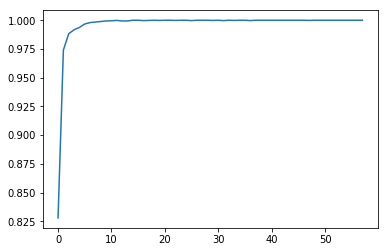

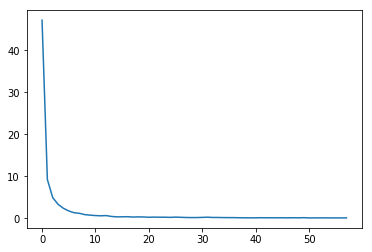

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 0.46404

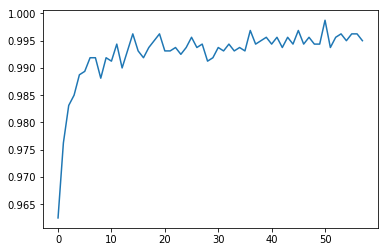

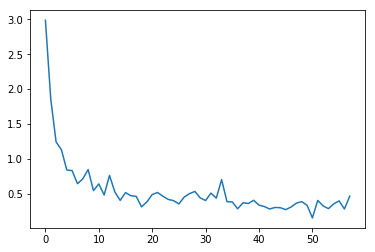


[58] accuracy: 0.995 loss: 0.466

Train
[59, 00020] loss: 0.022 acc: 1.000
[59, 00040] loss: 0.033 acc: 1.000
[59, 00060] loss: 0.045 acc: 1.000
[59, 00080] loss: 0.056 acc: 1.000
[59, 00100] loss: 0.063 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.34898317977786064,

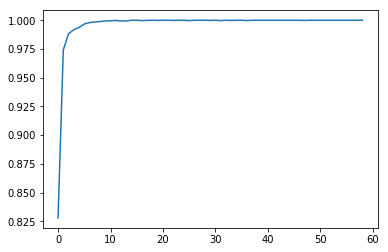

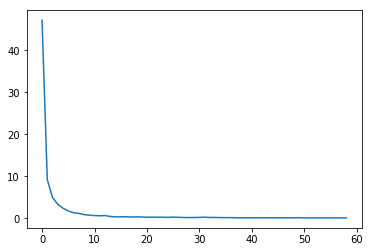

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5183334853500128, 

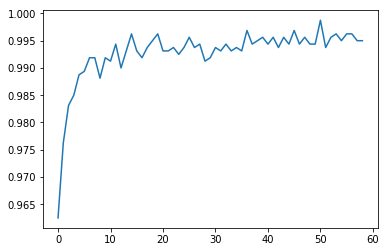

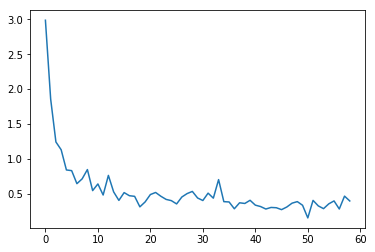


[59] accuracy: 0.995 loss: 0.396

Train
[60, 00020] loss: 0.022 acc: 1.000
[60, 00040] loss: 0.035 acc: 1.000
[60, 00060] loss: 0.080 acc: 1.000
[60, 00080] loss: 0.089 acc: 1.000
[60, 00100] loss: 0.104 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.348983

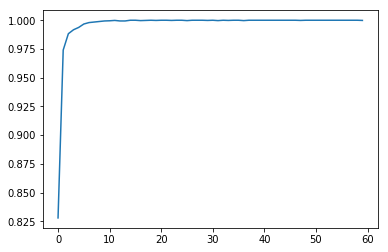

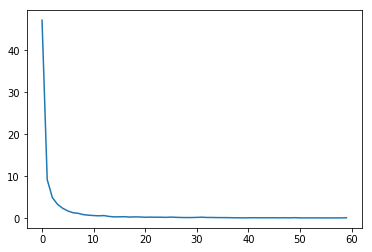

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.51833348535

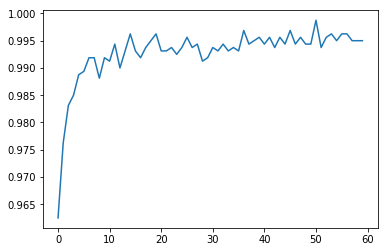

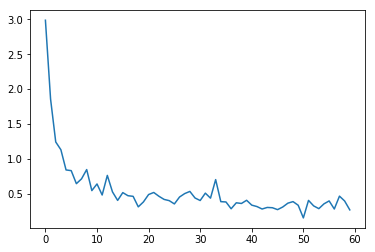


[60] accuracy: 0.995 loss: 0.269

Train
[61, 00020] loss: 0.009 acc: 1.000
[61, 00040] loss: 0.021 acc: 1.000
[61, 00060] loss: 0.029 acc: 1.000
[61, 00080] loss: 0.038 acc: 1.000
[61, 00100] loss: 0.063 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544, 0.3

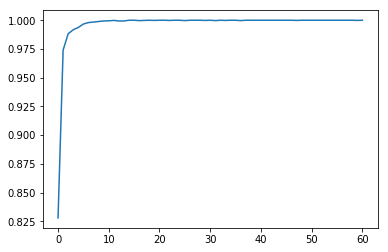

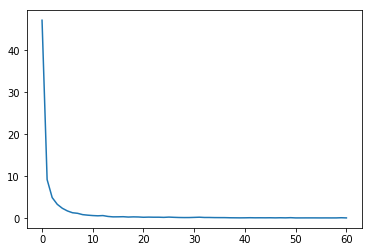

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4885741323232651, 0.5

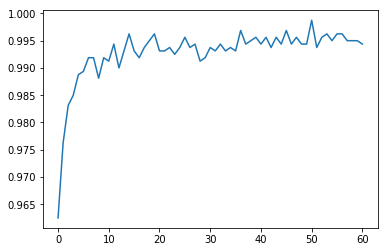

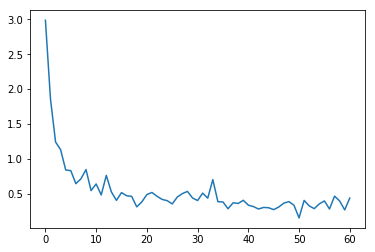


[61] accuracy: 0.994 loss: 0.438

Train
[62, 00020] loss: 0.015 acc: 1.000
[62, 00040] loss: 0.037 acc: 1.000
[62, 00060] loss: 0.050 acc: 1.000
[62, 00080] loss: 0.059 acc: 1.000
[62, 00100] loss: 0.067 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322849253192544

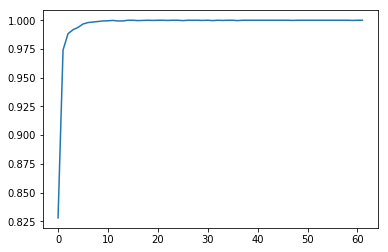

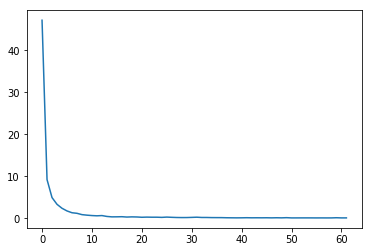

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.48857413232

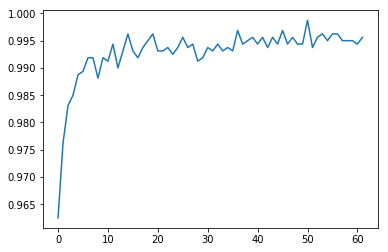

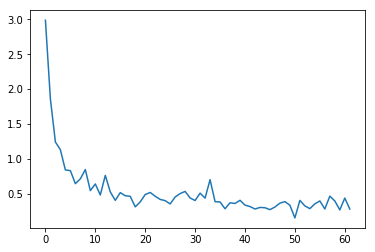


[62] accuracy: 0.996 loss: 0.281

Train
[63, 00020] loss: 0.012 acc: 1.000
[63, 00040] loss: 0.022 acc: 1.000
[63, 00060] loss: 0.040 acc: 1.000
[63, 00080] loss: 0.050 acc: 1.000
[63, 00100] loss: 0.061 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 0.322

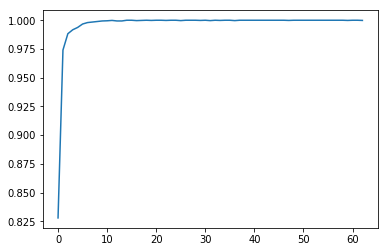

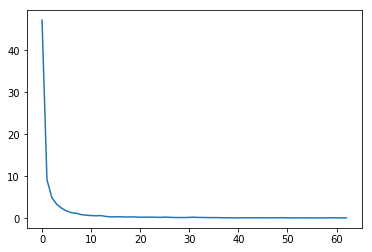

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38282316736876965, 0.4

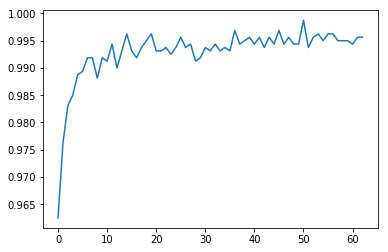

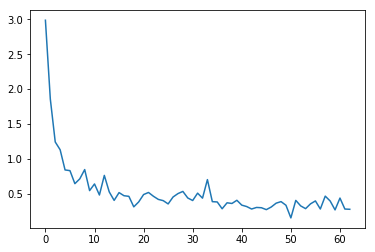


[63] accuracy: 0.996 loss: 0.277

Train
[64, 00020] loss: 0.010 acc: 1.000
[64, 00040] loss: 0.025 acc: 1.000
[64, 00060] loss: 0.039 acc: 1.000
[64, 00080] loss: 0.061 acc: 1.000
[64, 00100] loss: 0.084 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201969, 

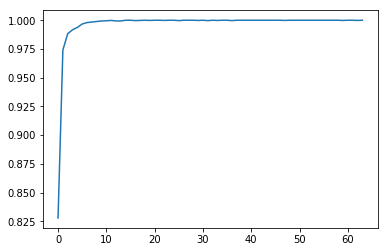

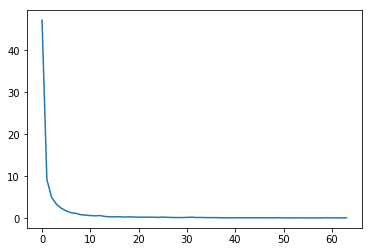

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.382823167368

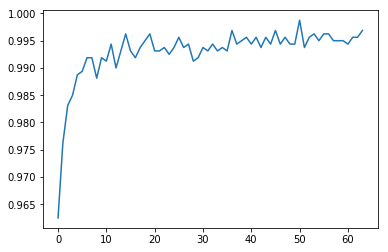

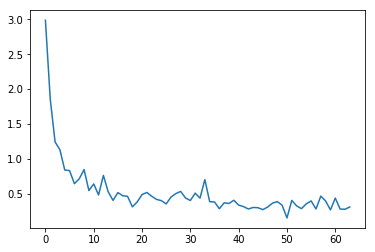


[64] accuracy: 0.997 loss: 0.310

Train
[65, 00020] loss: 0.014 acc: 1.000
[65, 00040] loss: 0.028 acc: 1.000
[65, 00060] loss: 0.038 acc: 1.000
[65, 00080] loss: 0.045 acc: 1.000
[65, 00100] loss: 0.054 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.3115926720201

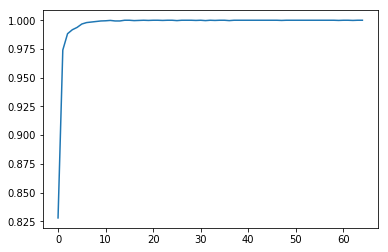

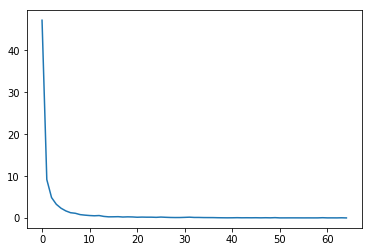

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.31231293454766273, 0.38

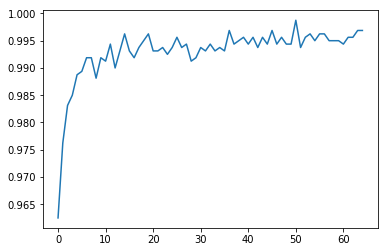

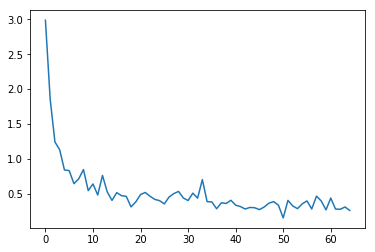


[65] accuracy: 0.997 loss: 0.260

Train
[66, 00020] loss: 0.008 acc: 1.000
[66, 00040] loss: 0.018 acc: 1.000
[66, 00060] loss: 0.028 acc: 1.000
[66, 00080] loss: 0.037 acc: 1.000
[66, 00100] loss: 0.045 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.31159267

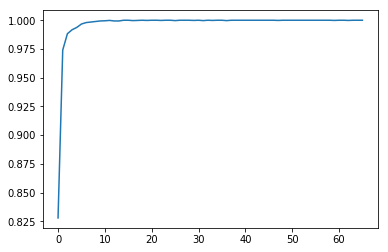

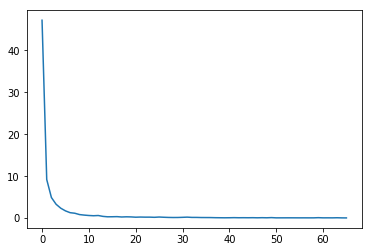

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.3123129345476

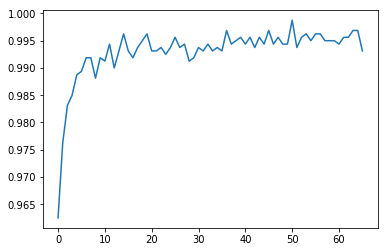

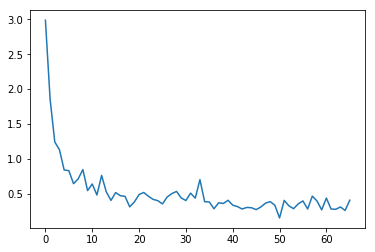


[66] accuracy: 0.993 loss: 0.407

Train
[67, 00020] loss: 0.009 acc: 1.000
[67, 00040] loss: 0.019 acc: 1.000
[67, 00060] loss: 0.029 acc: 1.000
[67, 00080] loss: 0.037 acc: 1.000
[67, 00100] loss: 0.045 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 0.311

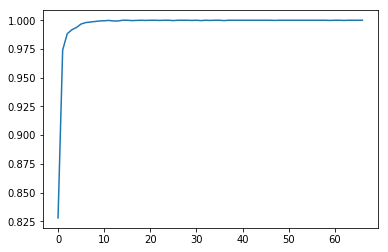

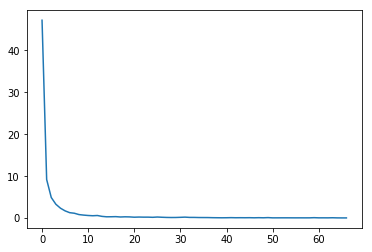

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918, 0.312312

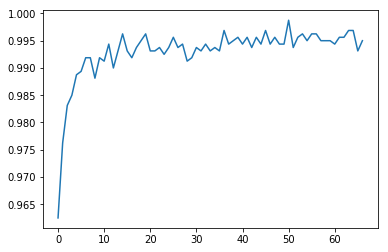

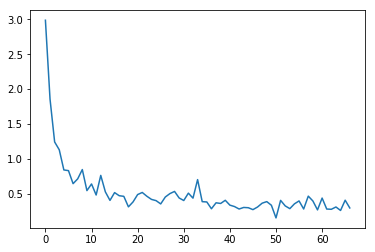


[67] accuracy: 0.995 loss: 0.296

Train
[68, 00020] loss: 0.005 acc: 1.000
[68, 00040] loss: 0.016 acc: 1.000
[68, 00060] loss: 0.022 acc: 1.000
[68, 00080] loss: 0.028 acc: 1.000
[68, 00100] loss: 0.036 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605978, 

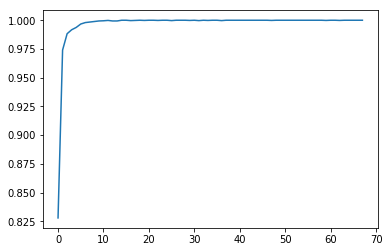

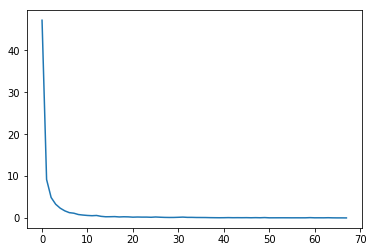

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.4629212897270918

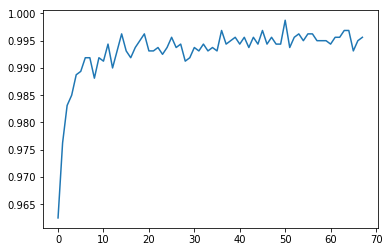

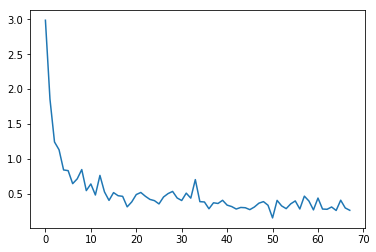


[68] accuracy: 0.996 loss: 0.263

Train
[69, 00020] loss: 0.006 acc: 1.000
[69, 00040] loss: 0.013 acc: 1.000
[69, 00060] loss: 0.023 acc: 1.000
[69, 00080] loss: 0.038 acc: 1.000
[69, 00100] loss: 0.063 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.411405261605

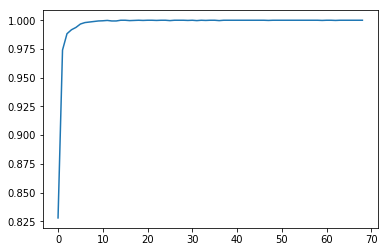

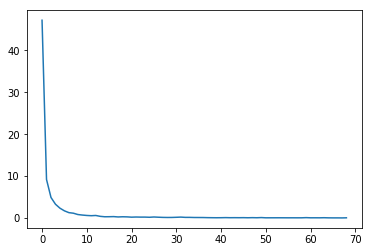

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.462921289

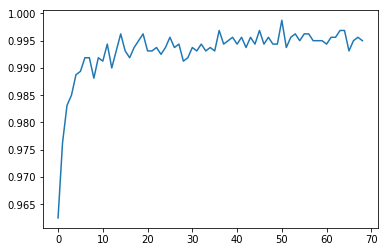

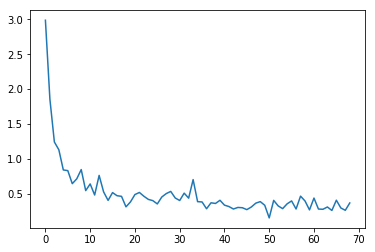


[69] accuracy: 0.995 loss: 0.368

Train
[70, 00020] loss: 0.038 acc: 0.999
[70, 00040] loss: 0.045 acc: 1.000
[70, 00060] loss: 0.051 acc: 1.000
[70, 00080] loss: 0.057 acc: 1.000
[70, 00100] loss: 0.070 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019634724, 0.

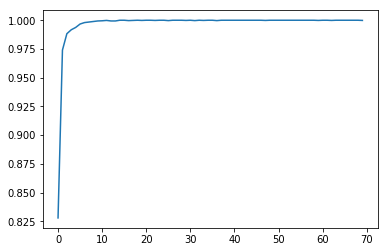

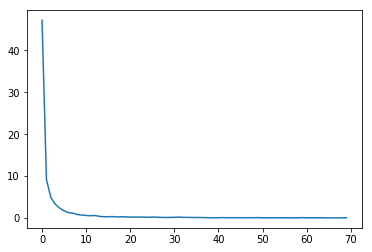

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361309, 0.46

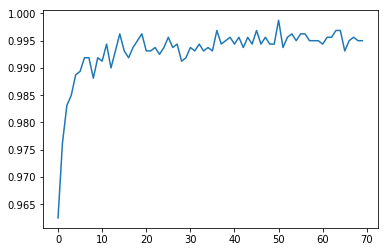

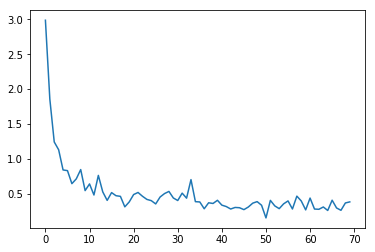


[70] accuracy: 0.995 loss: 0.383

Train
[71, 00020] loss: 0.006 acc: 1.000
[71, 00040] loss: 0.014 acc: 1.000
[71, 00060] loss: 0.021 acc: 1.000
[71, 00080] loss: 0.027 acc: 1.000
[71, 00100] loss: 0.050 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.619142401963472

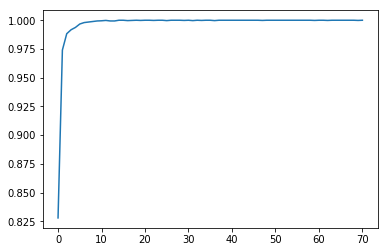

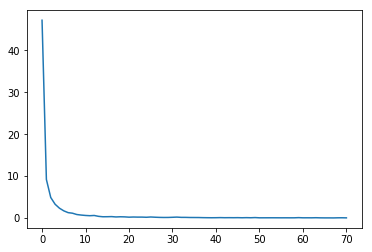

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.4718986265361

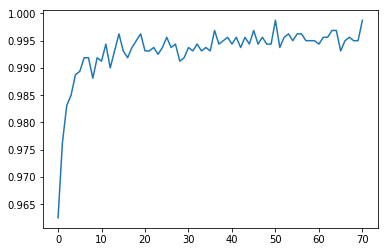

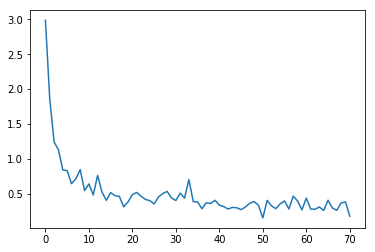


[71] accuracy: 0.999 loss: 0.177

Train
[72, 00020] loss: 0.006 acc: 1.000
[72, 00040] loss: 0.014 acc: 1.000
[72, 00060] loss: 0.020 acc: 1.000
[72, 00080] loss: 0.032 acc: 1.000
[72, 00100] loss: 0.036 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 0.6191424019

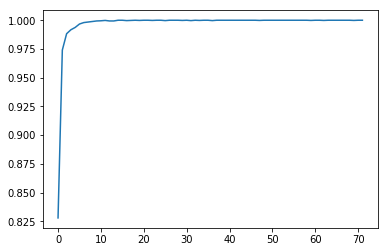

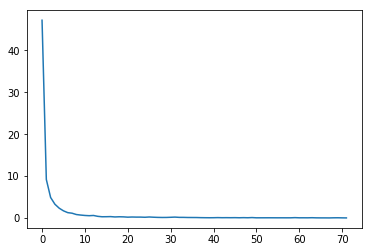

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003, 0.471

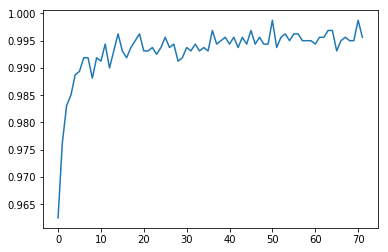

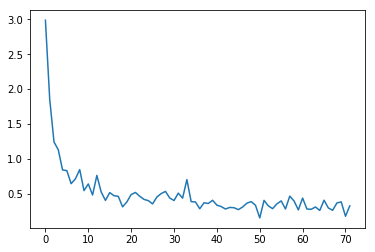


[72] accuracy: 0.996 loss: 0.326

Train
[73, 00020] loss: 0.008 acc: 1.000
[73, 00040] loss: 0.029 acc: 1.000
[73, 00060] loss: 0.039 acc: 1.000
[73, 00080] loss: 0.050 acc: 1.000
[73, 00100] loss: 0.060 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.5629925206303596, 

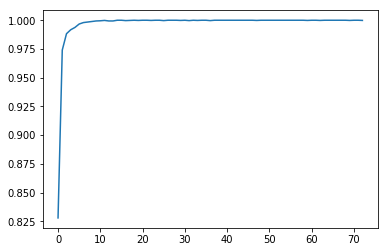

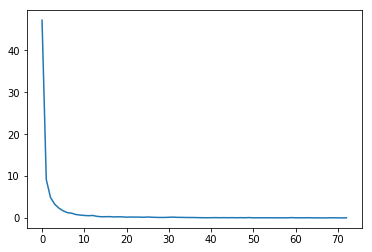

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977406919003

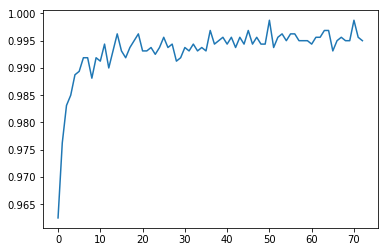

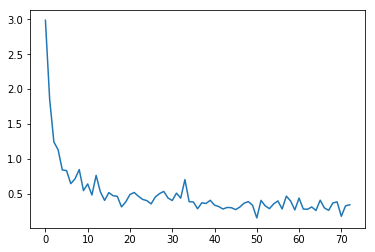


[73] accuracy: 0.995 loss: 0.343

Train
[74, 00020] loss: 0.017 acc: 1.000
[74, 00040] loss: 0.036 acc: 1.000
[74, 00060] loss: 0.042 acc: 1.000
[74, 00080] loss: 0.050 acc: 1.000
[74, 00100] loss: 0.073 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220478229224682, 0.562992

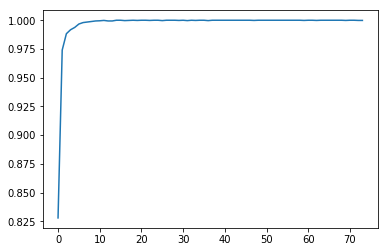

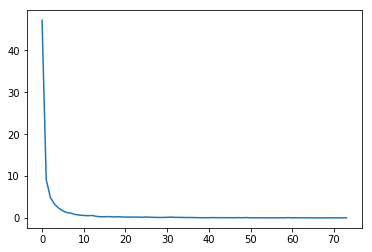

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 0.5163977

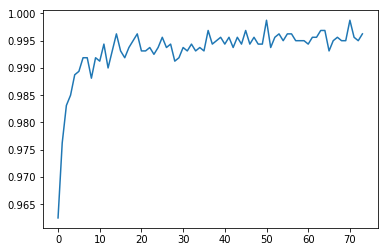

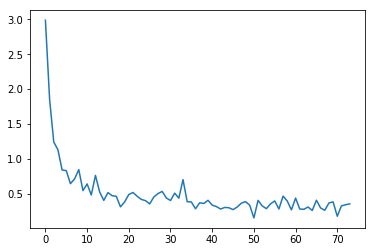


[74] accuracy: 0.996 loss: 0.355

Train
[75, 00020] loss: 0.008 acc: 1.000
[75, 00040] loss: 0.020 acc: 1.000
[75, 00060] loss: 0.030 acc: 1.000
[75, 00080] loss: 0.050 acc: 1.000
[75, 00100] loss: 0.061 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.62204782292246

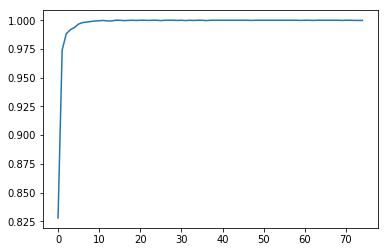

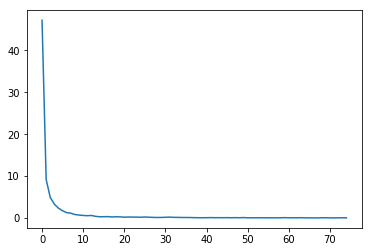

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.4047149885445833, 

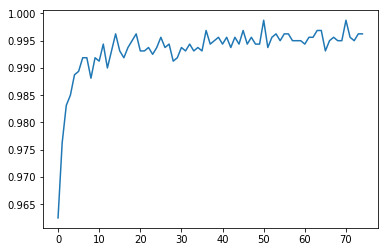

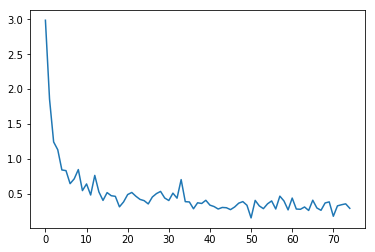


[75] accuracy: 0.996 loss: 0.291

Train
[76, 00020] loss: 0.007 acc: 1.000
[76, 00040] loss: 0.016 acc: 1.000
[76, 00060] loss: 0.023 acc: 1.000
[76, 00080] loss: 0.041 acc: 1.000
[76, 00100] loss: 0.047 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.622047822

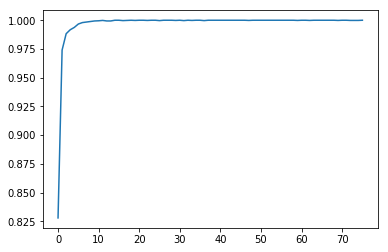

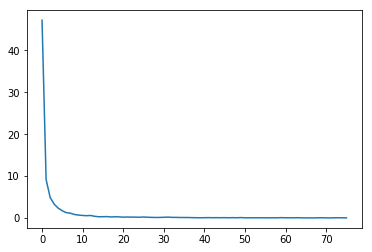

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0.404714988

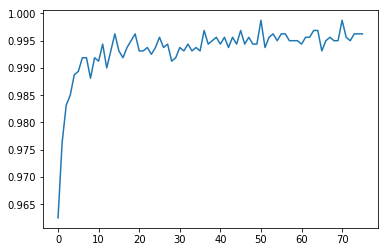

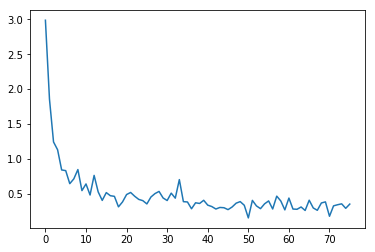


[76] accuracy: 0.996 loss: 0.352

Train
[77, 00020] loss: 0.010 acc: 1.000
[77, 00040] loss: 0.016 acc: 1.000
[77, 00060] loss: 0.023 acc: 1.000
[77, 00080] loss: 0.040 acc: 1.000
[77, 00100] loss: 0.052 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0.6220

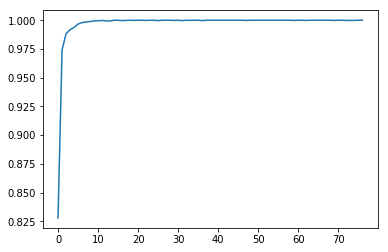

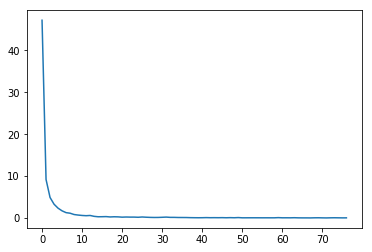

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.526722876355052, 0

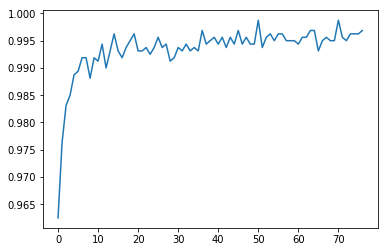

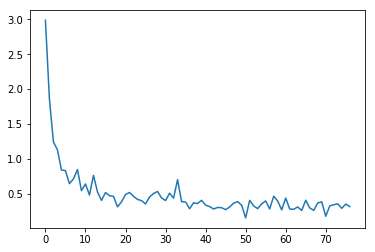


[77] accuracy: 0.997 loss: 0.316

Train
[78, 00020] loss: 0.008 acc: 1.000
[78, 00040] loss: 0.018 acc: 1.000
[78, 00060] loss: 0.037 acc: 1.000
[78, 00080] loss: 0.045 acc: 1.000
[78, 00100] loss: 0.051 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.7172896955162287, 0

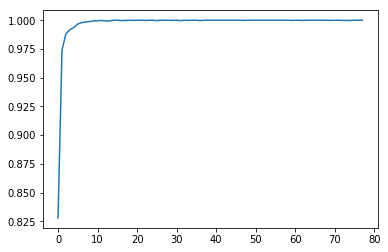

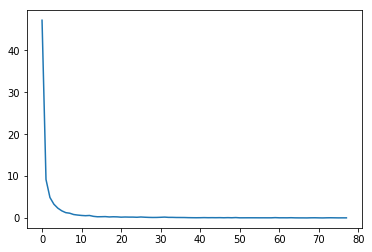

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0.52672287

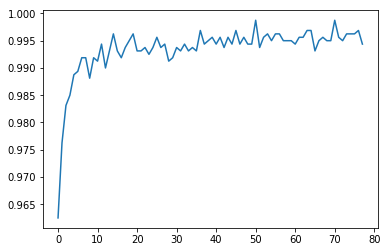

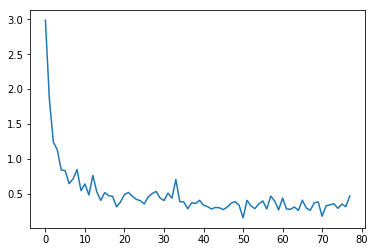


[78] accuracy: 0.994 loss: 0.469

Train
[79, 00020] loss: 0.015 acc: 1.000
[79, 00040] loss: 0.027 acc: 1.000
[79, 00060] loss: 0.034 acc: 1.000
[79, 00080] loss: 0.043 acc: 1.000
[79, 00100] loss: 0.050 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.71728969551622

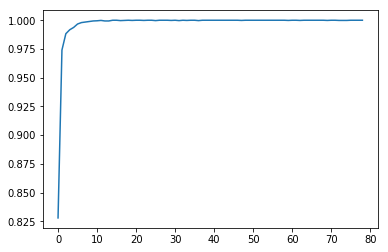

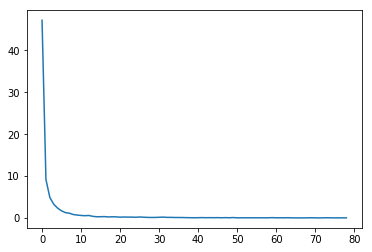

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.7629857901483774, 0

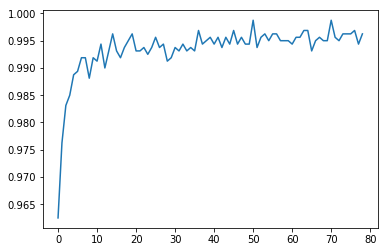

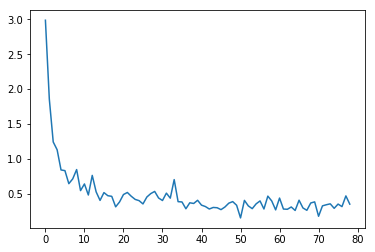


[79] accuracy: 0.996 loss: 0.351

Train
[80, 00020] loss: 0.006 acc: 1.000
[80, 00040] loss: 0.014 acc: 1.000
[80, 00060] loss: 0.031 acc: 1.000
[80, 00080] loss: 0.039 acc: 1.000
[80, 00100] loss: 0.059 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936, 0.717289695

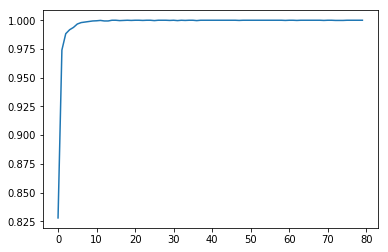

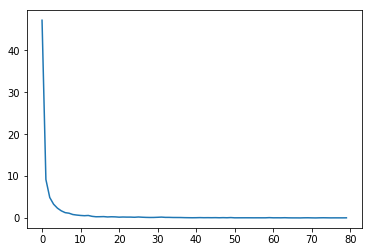

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.762985790148

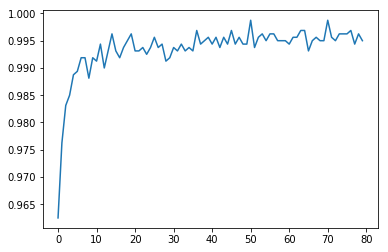

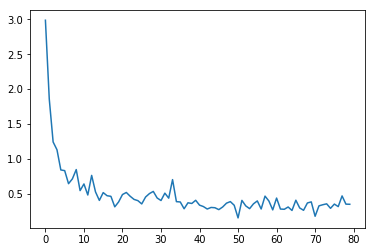


[80] accuracy: 0.995 loss: 0.349

Train
[81, 00020] loss: 0.034 acc: 0.999
[81, 00040] loss: 0.041 acc: 1.000
[81, 00060] loss: 0.059 acc: 1.000
[81, 00080] loss: 0.073 acc: 1.000
[81, 00100] loss: 0.091 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.8437983179464936,

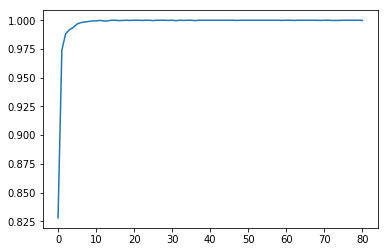

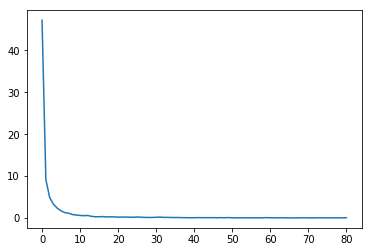

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.4820642303675413, 0.76

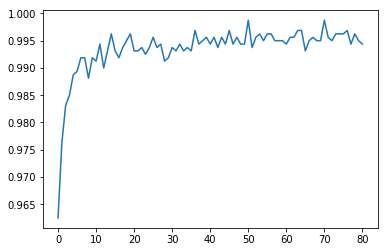

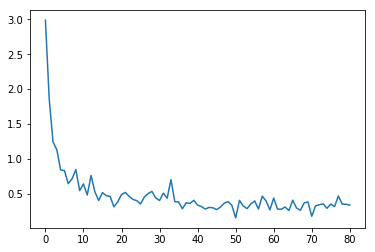


[81] accuracy: 0.994 loss: 0.337

Train
[82, 00020] loss: 0.005 acc: 1.000
[82, 00040] loss: 0.012 acc: 1.000
[82, 00060] loss: 0.017 acc: 1.000
[82, 00080] loss: 0.024 acc: 1.000
[82, 00100] loss: 0.041 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.843798317946

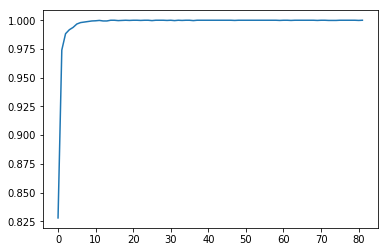

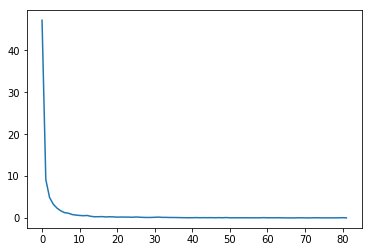

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.482064230367

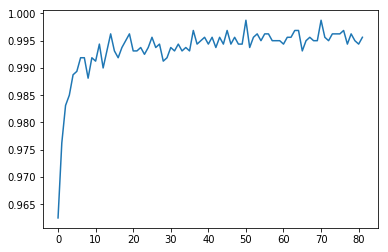

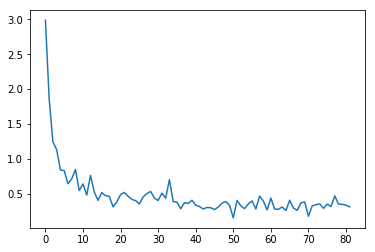


[82] accuracy: 0.996 loss: 0.312

Train
[83, 00020] loss: 0.032 acc: 0.999
[83, 00040] loss: 0.036 acc: 1.000
[83, 00060] loss: 0.040 acc: 1.000
[83, 00080] loss: 0.049 acc: 1.000
[83, 00100] loss: 0.065 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785120487, 0.

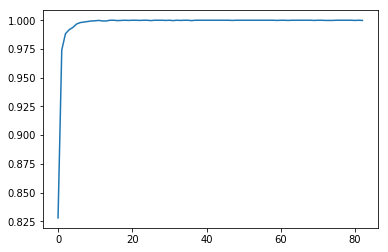

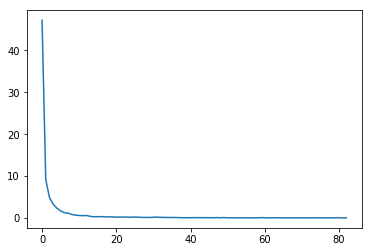

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491928, 0.482

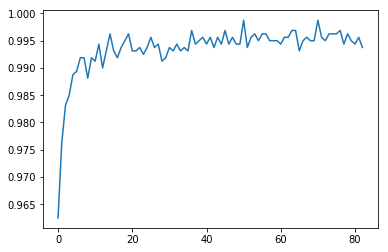

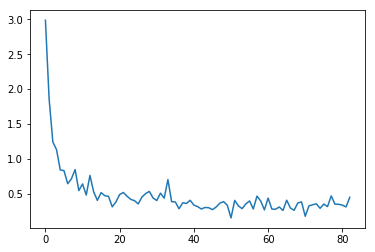


[83] accuracy: 0.994 loss: 0.449

Train
[84, 00020] loss: 0.008 acc: 1.000
[84, 00040] loss: 0.015 acc: 1.000
[84, 00060] loss: 0.022 acc: 1.000
[84, 00080] loss: 0.031 acc: 1.000
[84, 00100] loss: 0.042 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.159650478512048

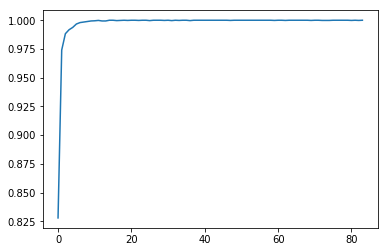

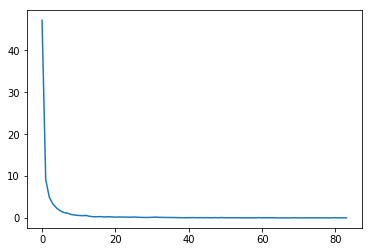

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404806226491

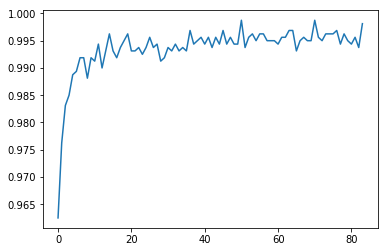

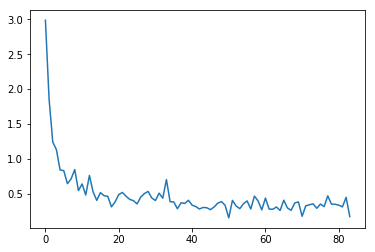


[84] accuracy: 0.998 loss: 0.172

Train
[85, 00020] loss: 0.005 acc: 1.000
[85, 00040] loss: 0.012 acc: 1.000
[85, 00060] loss: 0.030 acc: 1.000
[85, 00080] loss: 0.036 acc: 1.000
[85, 00100] loss: 0.047 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.1596504785

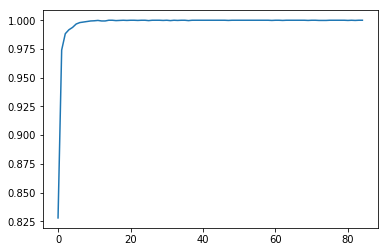

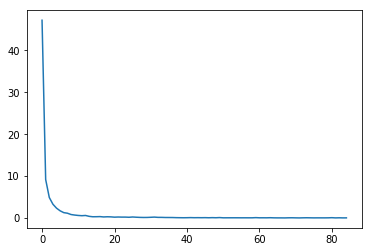

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238, 0.6404

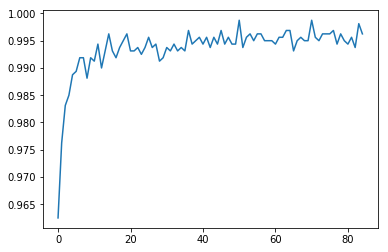

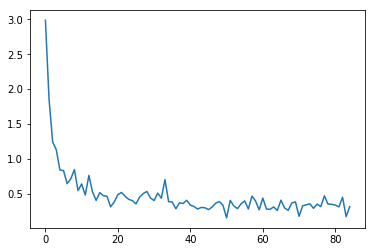


[85] accuracy: 0.996 loss: 0.316

Train
[86, 00020] loss: 0.007 acc: 1.000
[86, 00040] loss: 0.014 acc: 1.000
[86, 00060] loss: 0.026 acc: 1.000
[86, 00080] loss: 0.030 acc: 1.000
[86, 00100] loss: 0.039 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.15965

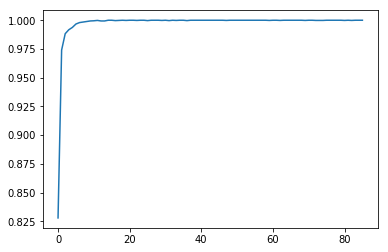

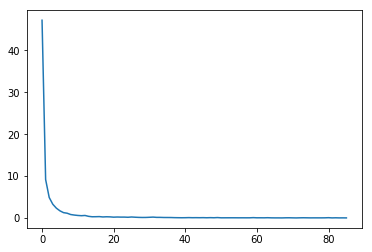

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826231390238,

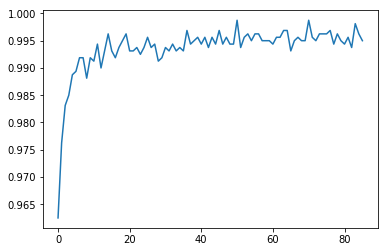

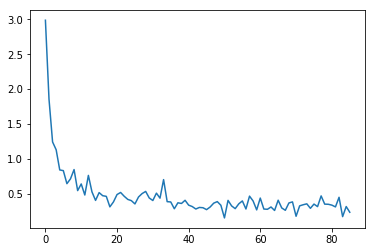


[86] accuracy: 0.995 loss: 0.235

Train
[87, 00020] loss: 0.006 acc: 1.000
[87, 00040] loss: 0.027 acc: 1.000
[87, 00060] loss: 0.033 acc: 1.000
[87, 00080] loss: 0.050 acc: 1.000
[87, 00100] loss: 0.057 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202291846, 1.

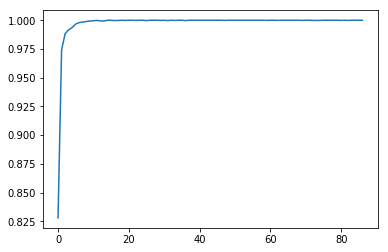

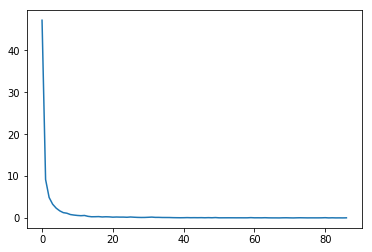

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0.5450826

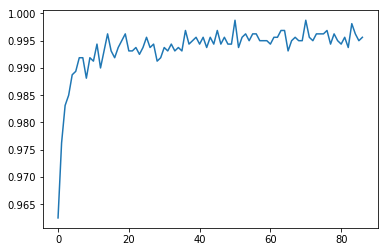

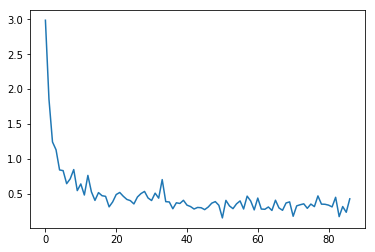


[87] accuracy: 0.996 loss: 0.427

Train
[88, 00020] loss: 0.007 acc: 1.000
[88, 00040] loss: 0.015 acc: 1.000
[88, 00060] loss: 0.030 acc: 1.000
[88, 00080] loss: 0.036 acc: 1.000
[88, 00100] loss: 0.041 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.293966620229184

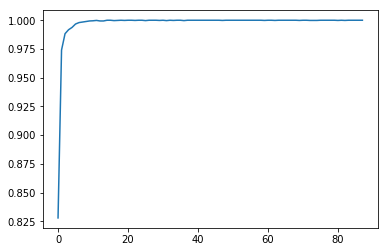

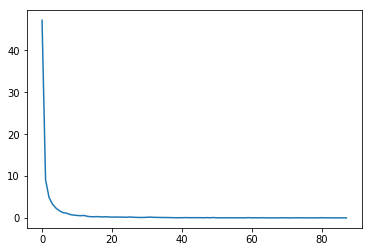

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.8465477451682091, 0

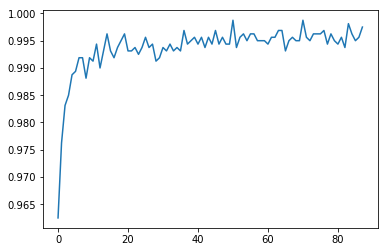

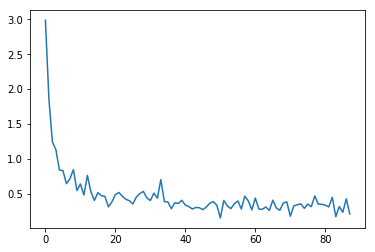


[88] accuracy: 0.998 loss: 0.210

Train
[89, 00020] loss: 0.004 acc: 1.000
[89, 00040] loss: 0.012 acc: 1.000
[89, 00060] loss: 0.021 acc: 1.000
[89, 00080] loss: 0.032 acc: 1.000
[89, 00100] loss: 0.044 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.2939666202

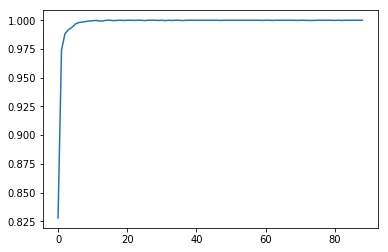

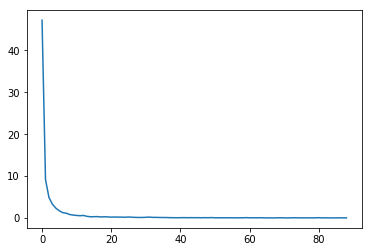

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.846547745

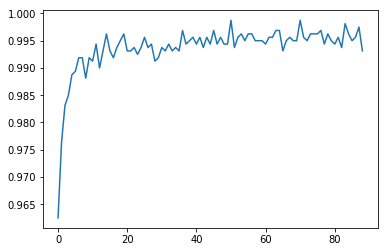

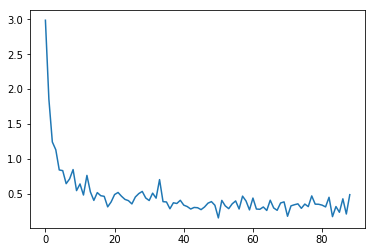


[89] accuracy: 0.993 loss: 0.487

Train
[90, 00020] loss: 0.007 acc: 1.000
[90, 00040] loss: 0.013 acc: 1.000
[90, 00060] loss: 0.017 acc: 1.000
[90, 00080] loss: 0.024 acc: 1.000
[90, 00100] loss: 0.037 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.29396

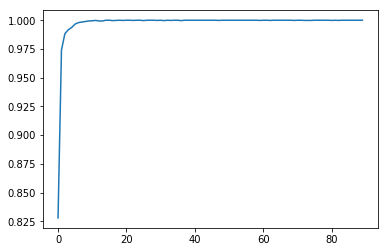

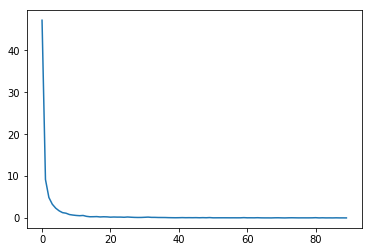

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.7135298661887646, 0.84

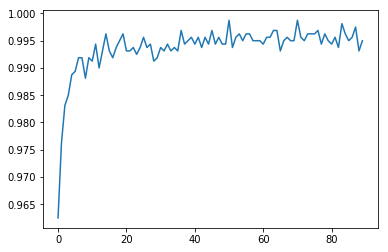

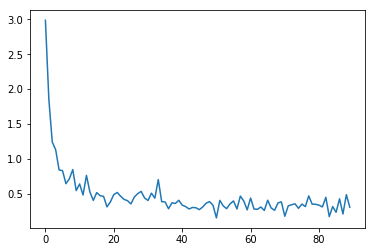


[90] accuracy: 0.995 loss: 0.307

Train
[91, 00020] loss: 0.007 acc: 1.000
[91, 00040] loss: 0.011 acc: 1.000
[91, 00060] loss: 0.017 acc: 1.000
[91, 00080] loss: 0.026 acc: 1.000
[91, 00100] loss: 0.035 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230938315, 1.

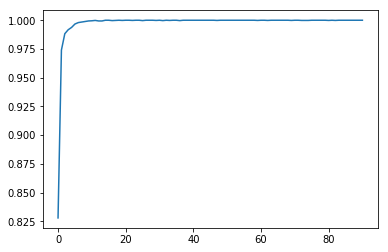

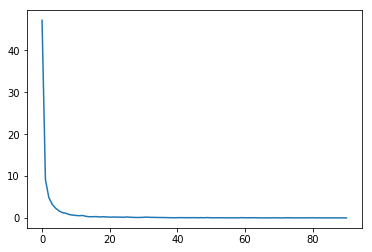

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.71352986618876

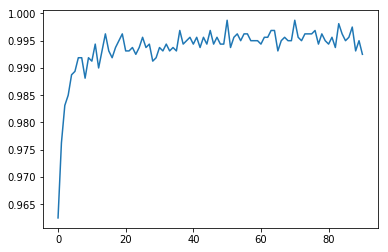

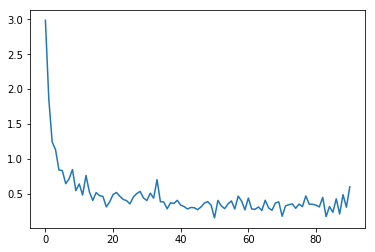


[91] accuracy: 0.993 loss: 0.600

Train
[92, 00020] loss: 0.007 acc: 1.000
[92, 00040] loss: 0.011 acc: 1.000
[92, 00060] loss: 0.023 acc: 1.000
[92, 00080] loss: 0.028 acc: 1.000
[92, 00100] loss: 0.037 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.723235323093831

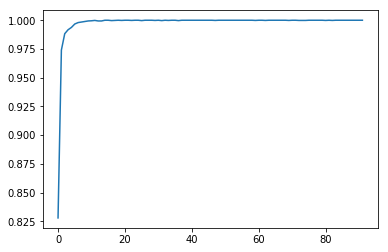

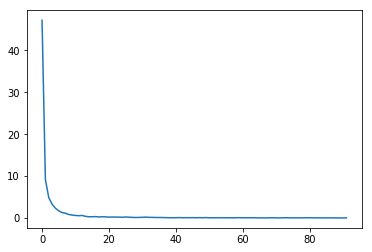

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065, 0.713529

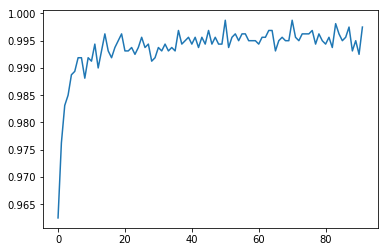

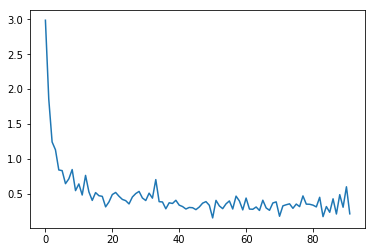


[92] accuracy: 0.998 loss: 0.212

Train
[93, 00020] loss: 0.005 acc: 1.000
[93, 00040] loss: 0.012 acc: 1.000
[93, 00060] loss: 0.018 acc: 1.000
[93, 00080] loss: 0.026 acc: 1.000
[93, 00100] loss: 0.036 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.7232353230

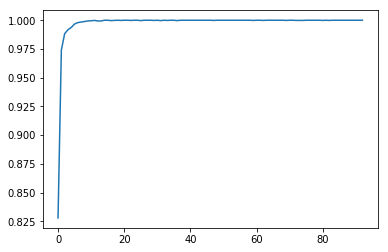

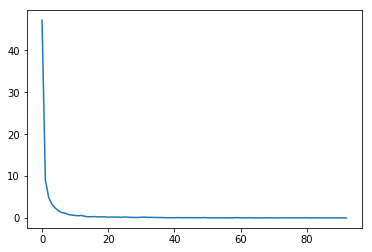

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177886635065,

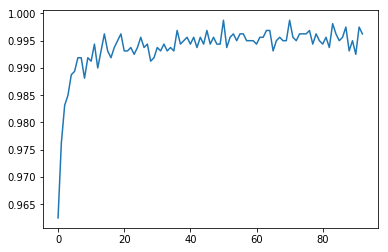

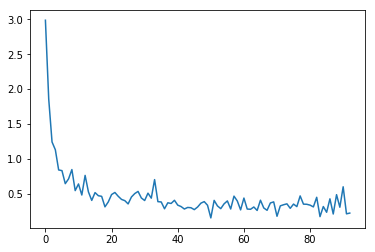


[93] accuracy: 0.996 loss: 0.223

Train
[94, 00020] loss: 0.005 acc: 1.000
[94, 00040] loss: 0.013 acc: 1.000
[94, 00060] loss: 0.020 acc: 1.000
[94, 00080] loss: 0.026 acc: 1.000
[94, 00100] loss: 0.033 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.72323

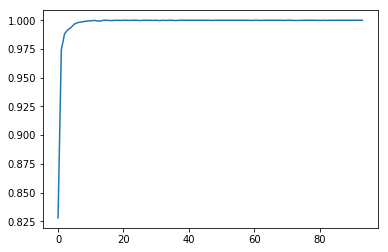

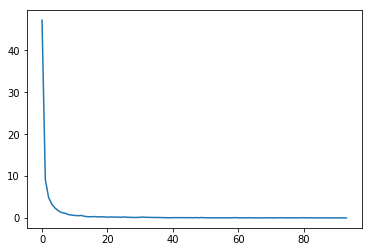

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849, 0.6445177

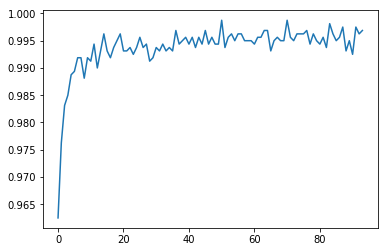

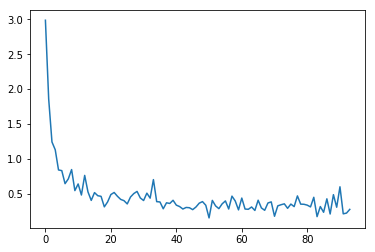


[94] accuracy: 0.997 loss: 0.276

Train
[95, 00020] loss: 0.008 acc: 1.000
[95, 00040] loss: 0.023 acc: 1.000
[95, 00060] loss: 0.033 acc: 1.000
[95, 00080] loss: 0.053 acc: 1.000
[95, 00100] loss: 0.058 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077866197, 1.

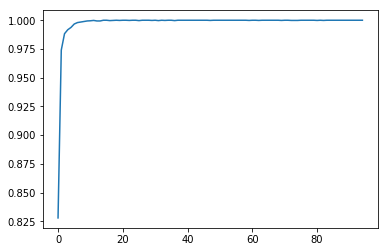

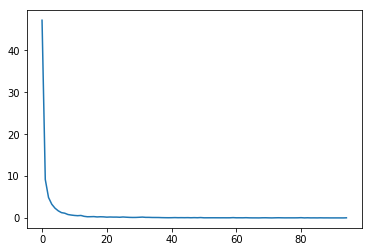

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875, 0.996875]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126191496849,

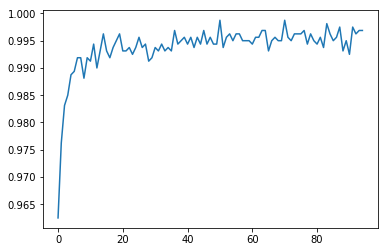

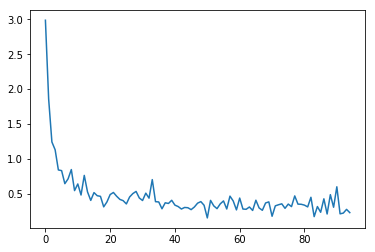


[95] accuracy: 0.997 loss: 0.229

Train
[96, 00020] loss: 0.011 acc: 1.000
[96, 00040] loss: 0.016 acc: 1.000
[96, 00060] loss: 0.027 acc: 1.000
[96, 00080] loss: 0.035 acc: 1.000
[96, 00100] loss: 0.045 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.357171707786619

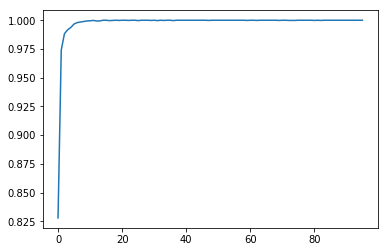

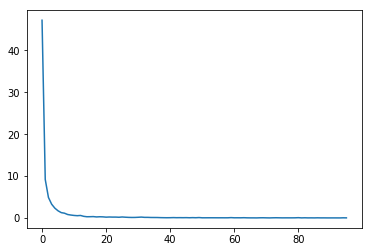

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875, 0.996875, 0.994375]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 0.8313126

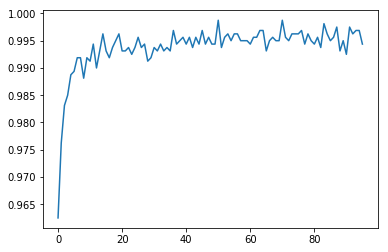

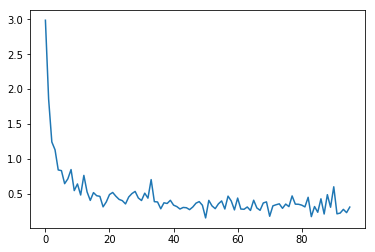


[96] accuracy: 0.994 loss: 0.309

Train
[97, 00020] loss: 0.004 acc: 1.000
[97, 00040] loss: 0.011 acc: 1.000
[97, 00060] loss: 0.021 acc: 1.000
[97, 00080] loss: 0.027 acc: 1.000
[97, 00100] loss: 0.035 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.3571717077

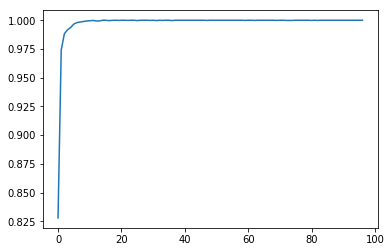

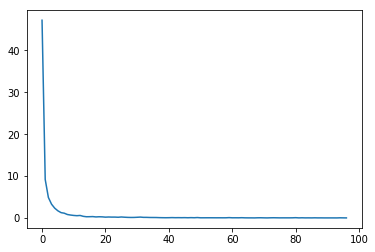

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875, 0.996875, 0.994375, 0.99125]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.8411983046680689, 

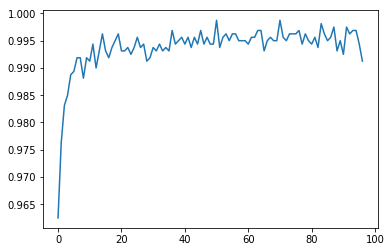

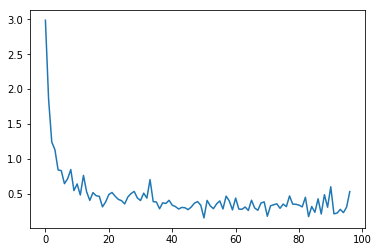


[97] accuracy: 0.991 loss: 0.531

Train
[98, 00020] loss: 0.005 acc: 1.000
[98, 00040] loss: 0.011 acc: 1.000
[98, 00060] loss: 0.016 acc: 1.000
[98, 00080] loss: 0.024 acc: 1.000
[98, 00100] loss: 0.036 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.35717

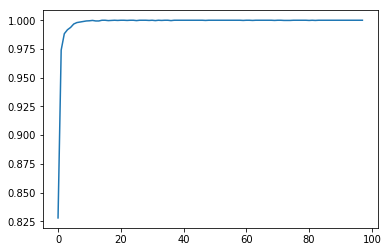

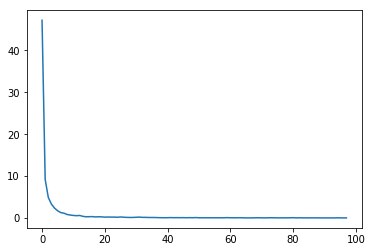

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875, 0.996875, 0.994375, 0.99125, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.841198304

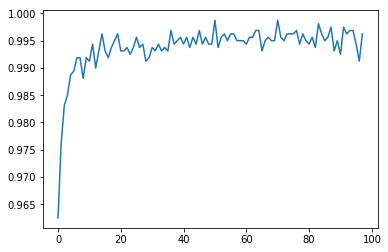

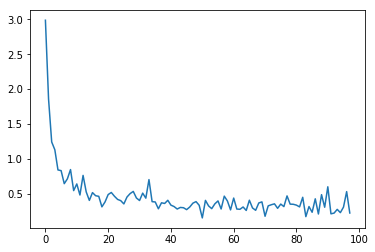


[98] accuracy: 0.996 loss: 0.224

Train
[99, 00020] loss: 0.003 acc: 1.000
[99, 00040] loss: 0.009 acc: 1.000
[99, 00060] loss: 0.015 acc: 1.000
[99, 00080] loss: 0.021 acc: 1.000
[99, 00100] loss: 0.031 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719370961, 2.

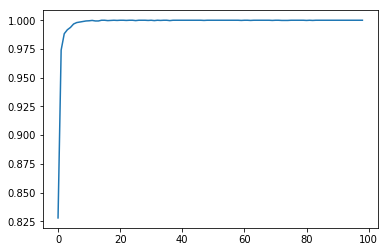

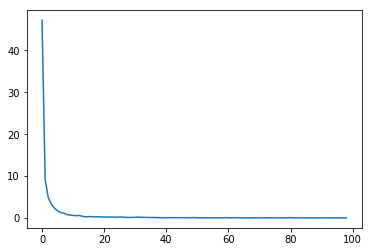

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875, 0.996875, 0.994375, 0.99125, 0.99625, 0.99625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524602175, 0.

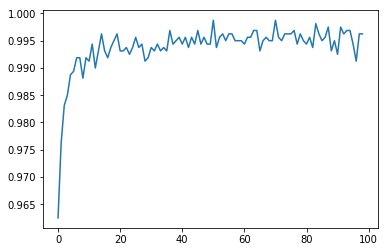

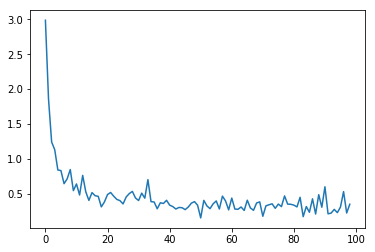


[99] accuracy: 0.996 loss: 0.349

Train
[100, 00020] loss: 0.006 acc: 1.000
[100, 00040] loss: 0.012 acc: 1.000
[100, 00060] loss: 0.019 acc: 1.000
[100, 00080] loss: 0.024 acc: 1.000
[100, 00100] loss: 0.028 acc: 1.000
[0.82796875, 0.9740625, 0.98828125, 0.99171875, 0.99375, 0.99671875, 0.99796875, 0.9984375, 0.99890625, 0.999375, 0.99953125, 0.99984375, 0.999375, 0.999375, 1.0, 1.0, 0.9996875, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.9996875, 1.0, 0.99984375, 1.0, 1.0, 0.9996875, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 1.0, 0.99984375, 0.99984375, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 0.99984375, 1.0, 0.99984375, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[47.17337954044342, 9.199239261448383, 4.907560182735324, 3.301788719

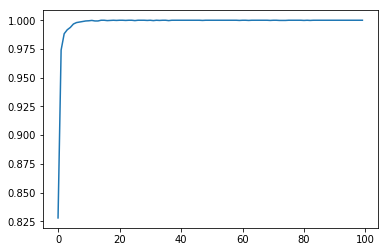

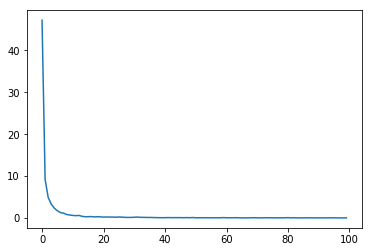

Validation
[0.9625, 0.97625, 0.983125, 0.985, 0.98875, 0.989375, 0.991875, 0.991875, 0.988125, 0.991875, 0.99125, 0.994375, 0.99, 0.993125, 0.99625, 0.993125, 0.991875, 0.99375, 0.995, 0.99625, 0.993125, 0.993125, 0.99375, 0.9925, 0.99375, 0.995625, 0.99375, 0.994375, 0.99125, 0.991875, 0.99375, 0.993125, 0.994375, 0.993125, 0.99375, 0.993125, 0.996875, 0.994375, 0.995, 0.995625, 0.994375, 0.995625, 0.99375, 0.995625, 0.994375, 0.996875, 0.994375, 0.995625, 0.994375, 0.994375, 0.99875, 0.99375, 0.995625, 0.99625, 0.995, 0.99625, 0.99625, 0.995, 0.995, 0.995, 0.994375, 0.995625, 0.995625, 0.996875, 0.996875, 0.993125, 0.995, 0.995625, 0.995, 0.995, 0.99875, 0.995625, 0.995, 0.99625, 0.99625, 0.99625, 0.996875, 0.994375, 0.99625, 0.995, 0.994375, 0.995625, 0.99375, 0.998125, 0.99625, 0.995, 0.995625, 0.9975, 0.993125, 0.995, 0.9925, 0.9975, 0.99625, 0.996875, 0.996875, 0.994375, 0.99125, 0.99625, 0.99625, 0.995625]
[2.9868215173482895, 1.8567501604557037, 1.2421786468476057, 1.1304371524

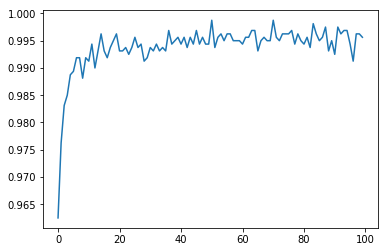

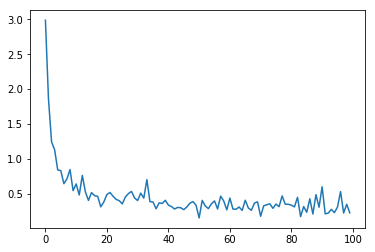


[100] accuracy: 0.996 loss: 0.226



In [16]:
train_acc = []
train_loss = []
val_acc = []
val_loss = []

for epoch in range(EPOCH):
    print("Train")
    total = 0
    correct = 0
    running_loss = 0.0
    for step, (labels, images,_) in enumerate(trainloader):
        optimizer.zero_grad()
#         print("in Train: ", images.shape, labels.shape)
#         images = images.detach()
#         labels = labels.detach()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
        outputs = model(images)
        
        # loss
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        # accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        acc = correct / total

        if step % 20 == 19:    # print every 2000 mini-batches
            print('[%d, %05d] loss: %.3f acc: %.3f' %
                  (epoch + 1, step + 1, running_loss, acc))

    train_acc.append(acc)
    train_loss.append(running_loss)
    print(train_acc)
    print(train_loss)
    plt.figure()
    plt.plot(range(0,epoch+1), train_acc)
    plt.savefig(model_directory + "train_acc_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,epoch+1), train_loss)
    plt.savefig(model_directory + "train_loss_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    
    # Evaluate validation set
    print("Validation")
    total = 0
    correct = 0
    running_loss = 0.0
    for step, (labels, images,_) in enumerate(valloader):
        optimizer.zero_grad()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
#         images = images.detach()
#         labels = labels.detach()
        outputs = model(images)
        loss = criterion(outputs, labels)
        _, predicted = torch.max(outputs.data, 1)
        running_loss += loss.item()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        acc = correct / total
    
    val_acc.append(acc)
    val_loss.append(running_loss)
    print(val_acc)
    print(val_loss)
    plt.figure()
    plt.plot(range(0,epoch+1), val_acc)
    plt.savefig(model_directory + "val_acc_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,epoch+1), val_loss)
    plt.savefig(model_directory + "val_loss_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    
    print('\n[%d] accuracy: %.3f loss: %.3f\n' % (epoch + 1, acc, running_loss))
    running_loss = 0.0
    # Saving model
    model_path = PJ(model_directory, "%03d_weights.pt" % (epoch+1))
    torch.save(model.state_dict(), model_path)

In [17]:
resultfile = open(model_directory+"train_results.txt", "a")
resultfile.write("train")
resultfile.write(str(train_acc))
resultfile.write("\n")
resultfile.write(str(train_loss))
resultfile.write("\n")
resultfile.write("validation")
resultfile.write("\n")
resultfile.write(str(val_acc))
resultfile.write("\n")
resultfile.write(str(val_loss))
resultfile.write("\n")
resultfile.close()

# TEST
### evaluate
### test every model
### saliency map

In [18]:
transform = transform_set(train=False)
testset = TermiteDataset(TestFile, transform)
testloader = Data.DataLoader(
    dataset=testset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)


[1] accuracy: 0.868 loss: 22.289

[0.86825]
[22.28901007771492]


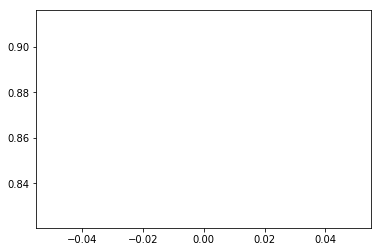

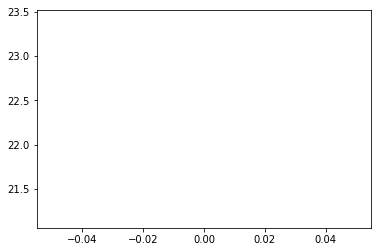

[0, 3, 1, 2, 3, 0, 2, 1, 3, 1, 2, 1, 2, 3, 1, 1, 3, 0, 3, 3, 0, 3, 0, 3, 1, 0, 3, 1, 3, 1, 3, 3, 1, 1, 0, 3, 0, 3, 3, 3, 0, 0, 3, 3, 0, 3, 3, 0, 1, 0, 0, 3, 3, 0, 0, 2, 3, 3, 0, 3, 2, 3, 2, 3, 0, 3, 1, 0, 0, 0, 1, 0, 3, 0, 3, 0, 2, 0, 0, 3, 3, 1, 3, 3, 0, 3, 0, 3, 2, 0, 2, 1, 2, 0, 3, 3, 2, 3, 3, 0, 2, 0, 0, 2, 3, 0, 1, 3, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 3, 3, 2, 3, 0, 2, 1, 1, 1, 0, 0, 3, 0, 0, 2, 1, 3, 1, 3, 0, 0, 3, 0, 1, 1, 2, 2, 2, 2, 2, 1, 3, 0, 0, 0, 0, 3, 3, 3, 3, 0, 3, 0, 0, 2, 1, 3, 1, 0, 1, 3, 0, 3, 1, 0, 1, 0, 0, 0, 2, 3, 0, 0, 0, 1, 2, 2, 0, 3, 3, 1, 1, 0, 3, 1, 0, 3, 0, 0, 0, 1, 3, 2, 2, 1, 2, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 3, 3, 1, 0, 0, 0, 2, 3, 0, 2, 3, 3, 0, 3, 2, 1, 3, 3, 2, 3, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 0, 3, 0, 3, 0, 0, 1, 0, 1, 0, 3, 1, 2, 3, 3, 3, 3, 3, 3, 3, 1, 3, 0, 0, 0, 0, 3, 0, 3, 2, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 2, 3, 3, 1, 3, 1, 0, 0, 1, 1, 1, 1, 3, 3, 0, 3, 0, 0, 3, 3, 3, 0, 3, 1, 1, 0, 1, 3, 0, 0, 0, 3, 3, 3, 0, 1, 3, 2, 1, 0, 0, 3, 3, 

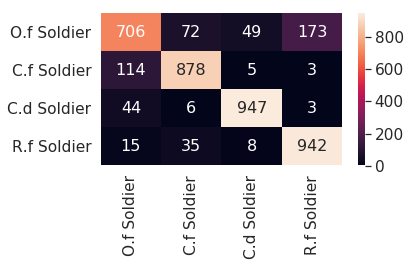


[2] accuracy: 0.912 loss: 14.593

[0.86825, 0.91225]
[22.28901007771492, 14.593185663223267]


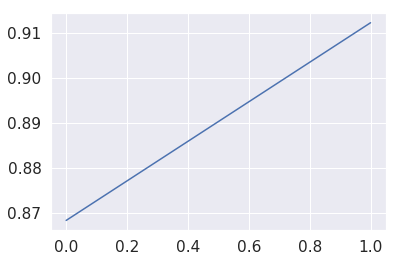

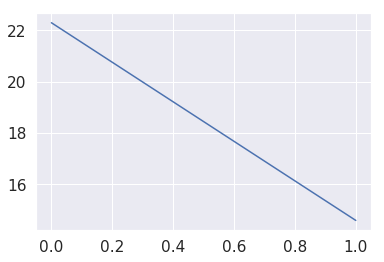

[0, 0, 3, 0, 0, 3, 0, 0, 2, 3, 1, 3, 2, 3, 3, 0, 0, 0, 1, 3, 1, 2, 0, 3, 1, 1, 3, 0, 0, 0, 0, 1, 0, 0, 1, 1, 3, 1, 1, 2, 1, 0, 2, 2, 3, 3, 0, 3, 0, 3, 3, 1, 3, 0, 3, 1, 0, 3, 1, 3, 0, 0, 0, 0, 3, 3, 0, 1, 1, 1, 3, 3, 0, 3, 0, 3, 0, 3, 1, 3, 0, 0, 2, 1, 3, 1, 2, 0, 0, 0, 0, 3, 3, 0, 3, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 1, 3, 3, 3, 0, 0, 1, 1, 1, 3, 3, 1, 0, 3, 0, 0, 1, 0, 1, 3, 0, 3, 3, 3, 0, 2, 3, 3, 3, 3, 3, 0, 0, 3, 3, 0, 2, 3, 2, 2, 3, 0, 3, 0, 3, 3, 2, 3, 3, 1, 3, 1, 3, 1, 3, 1, 0, 2, 1, 0, 1, 3, 3, 1, 0, 1, 3, 3, 3, 3, 3, 3, 0, 1, 3, 0, 0, 0, 0, 0, 0, 2, 3, 0, 1, 0, 3, 0, 1, 0, 3, 1, 3, 2, 0, 0, 2, 0, 2, 3, 3, 0, 3, 3, 3, 3, 0, 1, 3, 1, 1, 3, 3, 3, 3, 1, 3, 3, 3, 3, 1, 1, 3, 1, 1, 1, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 3, 1, 2, 0, 0, 1, 0, 0, 3, 1, 1, 0, 3, 1, 0, 0, 1, 0, 3, 3, 3, 3, 3, 0, 3, 0, 3, 0, 2, 0, 3, 1, 1, 0, 0, 1, 0, 0, 3, 1, 1, 0, 3, 3, 3, 3, 3, 3, 0, 3, 2, 0, 0, 1, 1, 0, 1, 0, 3, 3, 0, 0, 0, 0, 1, 1, 3, 0, 3, 0, 3, 1, 3, 1, 3, 3, 3, 0, 1, 3, 1, 1, 0, 3, 3, 1, 1, 1, 

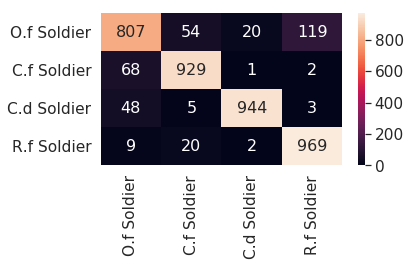


[3] accuracy: 0.932 loss: 12.077

[0.86825, 0.91225, 0.93175]
[22.28901007771492, 14.593185663223267, 12.076587446033955]


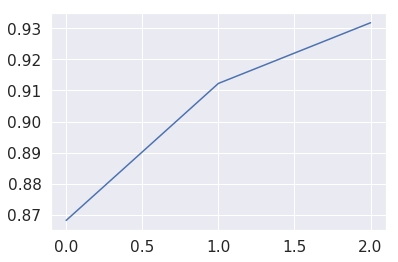

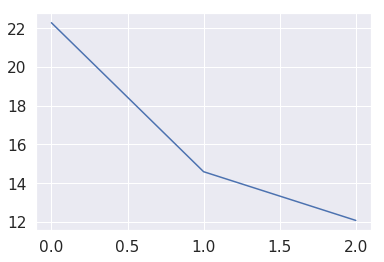

[0, 3, 0, 1, 0, 0, 3, 3, 1, 3, 0, 1, 1, 3, 0, 1, 3, 0, 3, 0, 1, 0, 1, 3, 3, 1, 3, 0, 2, 0, 2, 3, 3, 1, 0, 3, 1, 1, 0, 1, 1, 0, 3, 0, 3, 3, 0, 3, 0, 0, 0, 3, 3, 3, 0, 3, 0, 1, 0, 1, 1, 1, 3, 0, 3, 0, 1, 1, 0, 0, 3, 3, 3, 0, 2, 1, 1, 0, 1, 3, 3, 1, 3, 3, 1, 0, 3, 2, 2, 3, 0, 1, 0, 1, 1, 0, 0, 3, 0, 3, 0, 1, 1, 1, 1, 0, 1, 2, 1, 1, 0, 3, 1, 1, 0, 0, 3, 3, 0, 0, 3, 0, 1, 3, 1, 1, 2, 1, 0, 0, 0, 1, 0, 3, 0, 0, 1, 0, 1, 3, 3, 1, 1, 3, 1, 0, 0, 0, 1, 0, 2, 0, 0, 1, 3, 2, 1, 0, 0, 3, 0, 1, 3, 2, 3, 1, 0, 1, 1, 1, 0, 0, 0, 3, 3, 3, 3, 0, 0, 3, 0, 0, 1, 1, 1, 0, 3, 0, 0, 0, 3, 2, 1, 0, 3, 0, 0, 3, 3, 0, 0, 1, 3, 2, 3, 1, 3, 1, 0, 1, 3, 1, 0, 0, 3, 0, 3, 3, 1, 3, 3, 1, 3, 3, 0, 1, 2, 3, 0, 3, 0, 3, 2, 3, 0, 0, 3, 2, 1, 3, 0, 0, 3, 0, 1, 2, 3, 1, 0, 0, 0, 3, 3, 0, 3, 3, 0, 2, 0, 0, 3, 1, 3, 2, 3, 1, 3, 2, 1, 0, 0, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          851           55           14           80
C.f Soldier           51          946            2  

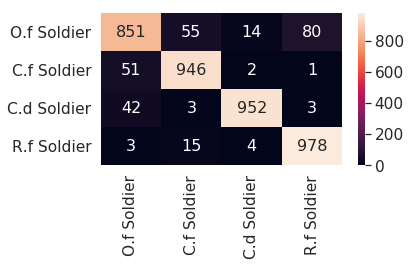


[4] accuracy: 0.936 loss: 11.575

[0.86825, 0.91225, 0.93175, 0.93625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034]


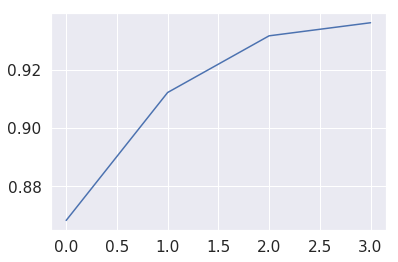

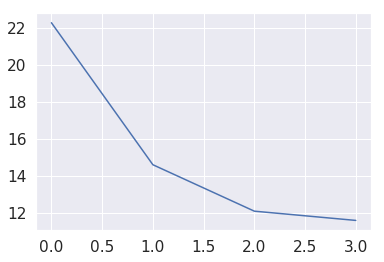

[2, 1, 3, 3, 0, 0, 3, 0, 0, 3, 3, 1, 0, 0, 2, 0, 0, 3, 1, 1, 0, 1, 1, 0, 1, 1, 3, 0, 1, 3, 0, 1, 3, 1, 3, 3, 0, 3, 3, 1, 1, 1, 2, 0, 3, 1, 0, 0, 0, 1, 1, 0, 3, 2, 1, 1, 0, 3, 1, 3, 1, 0, 1, 3, 3, 2, 2, 3, 2, 3, 3, 1, 3, 3, 0, 1, 3, 1, 3, 0, 0, 0, 0, 0, 1, 3, 1, 0, 0, 0, 0, 3, 3, 1, 3, 0, 0, 0, 3, 0, 0, 1, 3, 3, 1, 3, 3, 3, 0, 0, 1, 0, 3, 0, 3, 0, 0, 3, 1, 0, 3, 1, 0, 1, 0, 0, 1, 1, 1, 3, 3, 0, 1, 3, 0, 2, 0, 0, 1, 2, 2, 0, 2, 3, 0, 0, 1, 0, 0, 0, 1, 3, 1, 1, 1, 0, 3, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 2, 0, 1, 0, 0, 3, 2, 0, 3, 1, 1, 0, 3, 0, 0, 3, 1, 1, 2, 3, 3, 1, 3, 1, 3, 0, 0, 1, 0, 0, 0, 0, 2, 2, 0, 2, 3, 1, 3, 3, 3, 0, 2, 3, 2, 3, 3, 0, 2, 0, 0, 3, 3, 0, 0, 3, 1, 1, 0, 1, 1, 1, 0, 2, 0, 3, 1, 2, 1, 0, 0, 0, 3, 0, 0, 3, 1, 3, 0, 3, 1, 3, 0, 0, 1, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          862           55           17           66
C.f Soldier           46          951            2            1
C.d Soldier           38            5     

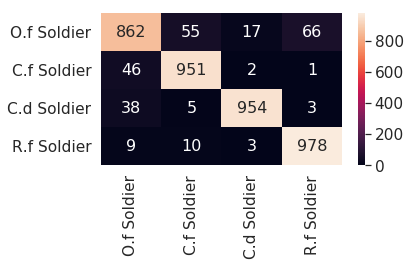


[5] accuracy: 0.939 loss: 10.717

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081]


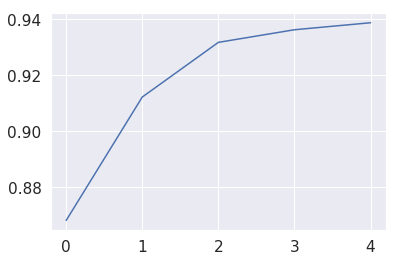

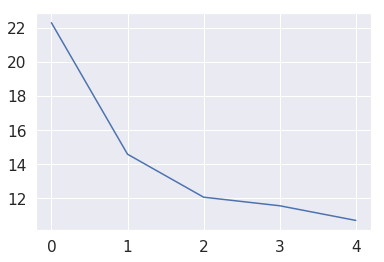

[1, 1, 2, 0, 0, 3, 3, 1, 1, 3, 3, 2, 3, 3, 1, 1, 1, 0, 3, 1, 3, 0, 0, 0, 1, 0, 1, 2, 3, 0, 2, 0, 1, 2, 0, 1, 0, 2, 0, 3, 0, 0, 0, 0, 3, 1, 0, 0, 0, 3, 3, 0, 0, 1, 1, 1, 1, 3, 0, 3, 0, 0, 2, 3, 3, 3, 3, 3, 0, 0, 3, 0, 3, 0, 0, 3, 1, 0, 3, 1, 3, 0, 1, 0, 1, 3, 1, 1, 1, 1, 0, 0, 0, 1, 3, 3, 2, 1, 1, 0, 1, 1, 1, 0, 3, 1, 0, 1, 1, 0, 1, 3, 1, 3, 0, 3, 1, 3, 3, 3, 0, 3, 3, 3, 0, 3, 3, 3, 0, 0, 0, 3, 1, 1, 0, 1, 3, 3, 0, 3, 3, 1, 0, 0, 1, 1, 0, 1, 1, 3, 3, 1, 1, 3, 3, 3, 0, 3, 3, 1, 0, 0, 3, 0, 1, 3, 3, 1, 1, 1, 0, 3, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 3, 0, 3, 2, 2, 1, 1, 1, 0, 1, 1, 0, 3, 1, 0, 0, 3, 2, 3, 2, 1, 3, 0, 3, 0, 1, 0, 3, 3, 1, 0, 0, 3, 1, 3, 1, 1, 0, 0, 0, 0, 0, 1, 3, 0, 1, 0, 1, 1, 3, 0, 3, 2, 0, 0, 1, 0, 3, 0, 1, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          865           56            9           70
C.f Soldier           38          961            1            0
C.d Soldier           38            5          953            4
R.f Sold

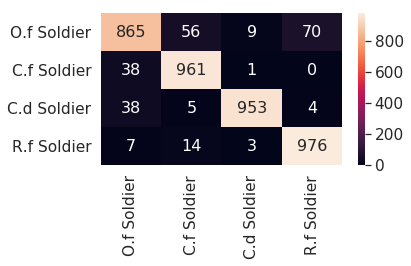


[6] accuracy: 0.941 loss: 10.290

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323]


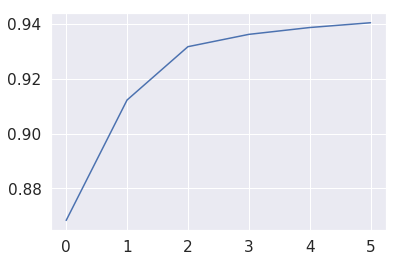

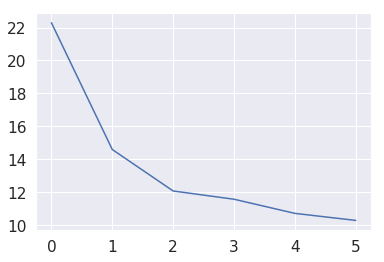

[1, 1, 0, 0, 3, 1, 0, 3, 3, 1, 0, 0, 0, 2, 3, 0, 0, 0, 2, 1, 1, 3, 1, 0, 0, 0, 0, 1, 3, 1, 3, 3, 3, 0, 1, 3, 3, 3, 0, 0, 1, 2, 3, 0, 3, 2, 1, 0, 1, 0, 3, 0, 1, 3, 0, 0, 1, 1, 0, 1, 0, 3, 0, 0, 1, 1, 3, 1, 1, 3, 0, 3, 0, 1, 3, 1, 3, 0, 1, 1, 3, 0, 0, 3, 0, 0, 1, 1, 0, 1, 0, 1, 2, 0, 3, 1, 2, 3, 1, 3, 0, 1, 3, 1, 2, 3, 2, 3, 0, 0, 1, 0, 3, 1, 0, 0, 0, 1, 3, 3, 1, 3, 3, 2, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 3, 1, 2, 3, 2, 2, 1, 0, 3, 3, 3, 3, 1, 1, 3, 3, 3, 1, 1, 0, 2, 3, 3, 1, 0, 3, 1, 0, 1, 1, 1, 0, 0, 0, 1, 3, 0, 3, 2, 0, 0, 0, 1, 0, 3, 2, 3, 3, 3, 3, 3, 3, 2, 0, 3, 3, 0, 2, 0, 3, 0, 3, 3, 1, 3, 0, 1, 0, 3, 3, 3, 3, 2, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 2, 1, 2, 1, 0, 0, 1, 0, 1, 0, 0, 3, 1, 0, 1, 1, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          866           55           14           65
C.f Soldier           30          967            2            1
C.d Soldier           46            7          946            1
R.f Soldier            2     

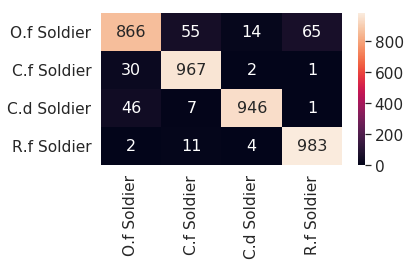


[7] accuracy: 0.948 loss: 9.344

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186]


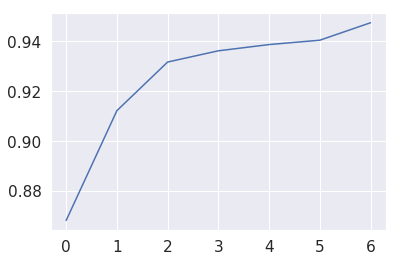

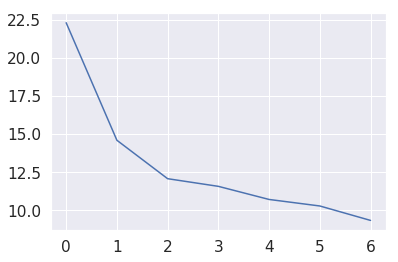

[1, 3, 3, 3, 3, 0, 3, 3, 1, 3, 1, 0, 3, 3, 1, 3, 3, 3, 0, 1, 2, 0, 1, 2, 1, 1, 1, 1, 0, 0, 1, 0, 2, 1, 0, 0, 0, 0, 0, 0, 3, 1, 3, 3, 1, 1, 1, 0, 0, 3, 1, 0, 0, 3, 3, 1, 3, 0, 3, 0, 3, 0, 3, 3, 1, 1, 3, 1, 0, 1, 3, 1, 0, 0, 3, 1, 1, 3, 1, 0, 2, 1, 0, 0, 2, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 3, 0, 3, 0, 1, 0, 3, 3, 0, 1, 3, 1, 0, 1, 1, 3, 1, 0, 0, 1, 3, 0, 3, 3, 1, 0, 0, 3, 0, 0, 3, 1, 1, 1, 0, 1, 3, 3, 0, 3, 1, 3, 2, 0, 0, 3, 3, 1, 3, 2, 3, 0, 1, 2, 3, 1, 0, 3, 3, 3, 0, 0, 1, 1, 3, 1, 1, 0, 0, 3, 0, 1, 3, 0, 0, 1, 3, 1, 3, 0, 0, 0, 3, 2, 1, 2, 0, 0, 1, 1, 3, 3, 1, 0, 3, 3, 3, 0, 3, 1, 2, 0, 0, 0, 0, 3, 3, 1, 3, 0, 1, 2, 2, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          880           51            8           61
C.f Soldier           32          965            2            1
C.d Soldier           30            2          965            3
R.f Soldier            5           12            3          980


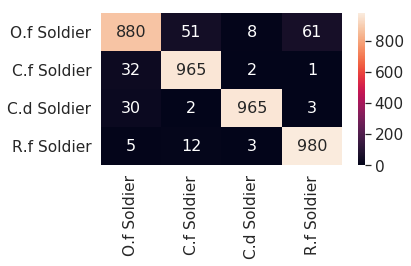


[8] accuracy: 0.954 loss: 8.908

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077]


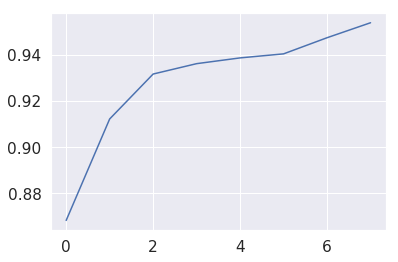

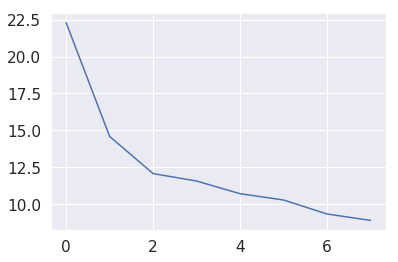

[0, 3, 3, 0, 0, 3, 0, 2, 1, 3, 1, 2, 2, 0, 1, 0, 0, 0, 1, 3, 1, 3, 1, 3, 1, 3, 3, 1, 3, 1, 3, 0, 2, 1, 0, 0, 0, 3, 0, 3, 1, 1, 1, 0, 0, 3, 0, 0, 3, 1, 3, 2, 0, 1, 0, 1, 1, 1, 2, 1, 3, 3, 2, 3, 0, 0, 1, 1, 3, 0, 1, 1, 0, 3, 2, 0, 0, 0, 0, 0, 1, 2, 0, 1, 1, 1, 1, 3, 0, 3, 2, 3, 0, 1, 0, 1, 0, 0, 2, 3, 3, 3, 3, 0, 3, 3, 0, 0, 3, 3, 3, 3, 1, 0, 1, 1, 0, 3, 1, 3, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 3, 1, 1, 1, 1, 1, 1, 3, 2, 0, 1, 1, 1, 3, 0, 1, 3, 2, 0, 0, 3, 2, 3, 1, 3, 1, 3, 1, 3, 0, 3, 2, 2, 2, 0, 3, 0, 3, 0, 0, 1, 3, 1, 0, 3, 3, 3, 3, 1, 3, 3, 0, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          899           32           13           56
C.f Soldier           29          969            2            0
C.d Soldier           25            6          969            0
R.f Soldier            4           15            2          979


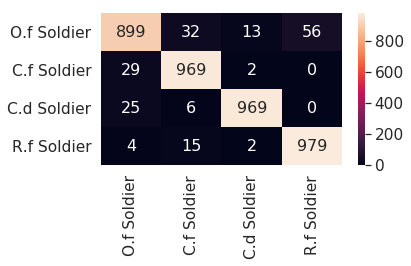


[9] accuracy: 0.950 loss: 9.424

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778]


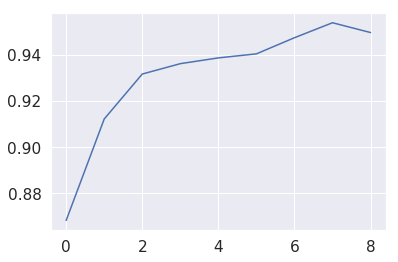

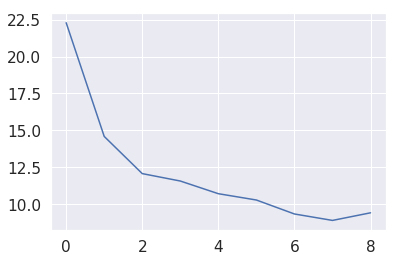

[1, 1, 0, 3, 3, 0, 3, 1, 3, 3, 0, 3, 1, 3, 0, 0, 1, 0, 1, 3, 0, 1, 1, 3, 1, 1, 1, 3, 0, 0, 3, 3, 0, 3, 0, 3, 3, 1, 1, 3, 1, 0, 1, 2, 3, 0, 3, 3, 1, 0, 1, 1, 0, 0, 0, 1, 0, 3, 1, 3, 3, 1, 0, 1, 3, 3, 1, 1, 1, 2, 0, 3, 0, 3, 1, 3, 1, 1, 0, 0, 2, 1, 1, 0, 1, 0, 0, 3, 2, 3, 2, 2, 0, 0, 0, 0, 1, 3, 1, 3, 0, 0, 3, 0, 0, 2, 3, 1, 3, 3, 3, 0, 3, 0, 1, 3, 3, 3, 0, 3, 2, 1, 0, 0, 0, 1, 0, 2, 1, 1, 1, 0, 2, 2, 0, 1, 0, 3, 0, 0, 3, 0, 1, 1, 0, 3, 3, 3, 1, 3, 1, 3, 3, 3, 0, 2, 3, 1, 3, 3, 0, 1, 0, 0, 0, 3, 1, 3, 3, 0, 3, 0, 2, 3, 3, 0, 3, 0, 0, 3, 0, 1, 3, 3, 1, 1, 0, 0, 0, 1, 0, 1, 1, 2, 0, 1, 0, 1, 3, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          888           41           11           60
C.f Soldier           34          964            1            1
C.d Soldier           28            4          964            4
R.f Soldier            4           11            2          983


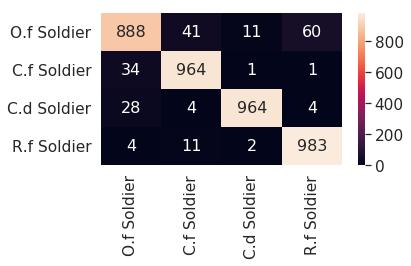


[10] accuracy: 0.950 loss: 9.078

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739]


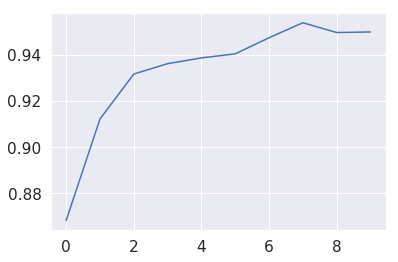

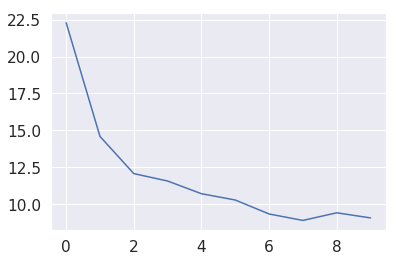

[0, 0, 0, 3, 1, 1, 0, 1, 0, 2, 1, 3, 1, 0, 1, 0, 0, 2, 0, 1, 3, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 3, 0, 1, 3, 0, 3, 0, 1, 1, 1, 0, 3, 3, 2, 3, 3, 0, 0, 1, 1, 1, 2, 3, 3, 3, 0, 0, 0, 1, 0, 0, 2, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 3, 0, 0, 3, 3, 1, 3, 3, 2, 0, 3, 0, 3, 3, 1, 1, 3, 1, 1, 1, 1, 2, 2, 1, 2, 3, 1, 1, 3, 1, 1, 0, 2, 0, 3, 3, 0, 3, 1, 3, 1, 0, 3, 0, 0, 3, 0, 3, 3, 3, 1, 0, 0, 0, 0, 1, 1, 1, 1, 3, 1, 3, 3, 0, 1, 1, 0, 0, 3, 3, 1, 1, 2, 3, 0, 0, 1, 3, 0, 3, 0, 3, 3, 3, 1, 1, 0, 3, 3, 0, 0, 3, 0, 0, 1, 3, 3, 1, 3, 1, 0, 1, 0, 3, 1, 3, 1, 0, 3, 1, 3, 1, 0, 3, 1, 1, 1, 3, 3, 2, 0, 1, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          881           56            8           55
C.f Soldier           31          966            2            1
C.d Soldier           26            4          969            1
R.f Soldier            3           10            3          984


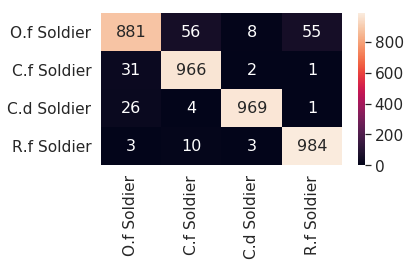


[11] accuracy: 0.949 loss: 9.130

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824]


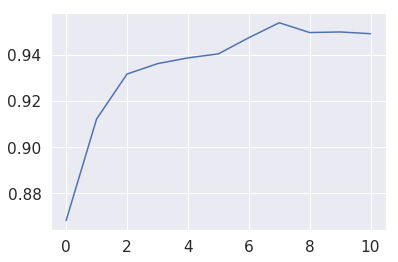

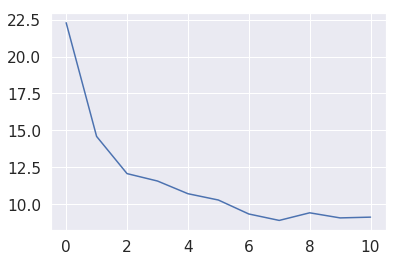

[1, 1, 1, 2, 3, 0, 3, 1, 3, 1, 0, 3, 1, 0, 1, 0, 0, 2, 0, 2, 0, 1, 3, 3, 1, 2, 0, 0, 0, 1, 0, 0, 1, 0, 3, 3, 3, 3, 1, 0, 1, 0, 0, 3, 0, 3, 3, 1, 2, 0, 1, 1, 2, 3, 1, 1, 1, 3, 0, 3, 3, 1, 1, 0, 1, 3, 0, 1, 1, 3, 1, 1, 0, 3, 0, 0, 2, 0, 0, 3, 1, 3, 2, 3, 1, 0, 1, 3, 0, 0, 0, 1, 0, 3, 3, 3, 0, 3, 3, 1, 1, 0, 1, 3, 3, 3, 1, 0, 3, 1, 0, 0, 0, 0, 0, 3, 0, 0, 1, 0, 1, 3, 3, 2, 0, 0, 0, 1, 0, 0, 0, 0, 3, 0, 2, 3, 0, 0, 3, 2, 3, 1, 2, 3, 3, 2, 3, 1, 3, 2, 3, 3, 1, 0, 0, 2, 3, 1, 0, 1, 3, 2, 1, 3, 3, 1, 0, 3, 3, 1, 3, 0, 3, 1, 2, 3, 3, 0, 0, 3, 1, 0, 1, 0, 1, 2, 2, 1, 0, 0, 3, 0, 0, 1, 1, 3, 1, 1, 3, 3, 3, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          881           43           16           60
C.f Soldier           30          969            1            0
C.d Soldier           27            4          966            3
R.f Soldier            8            9            2          981


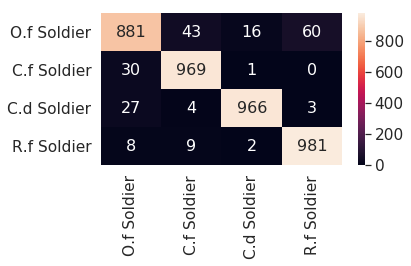


[12] accuracy: 0.953 loss: 8.834

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587]


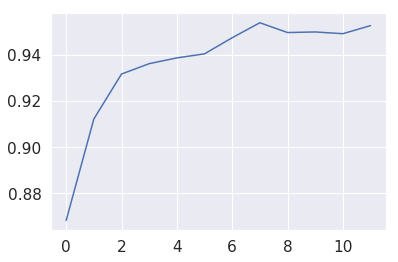

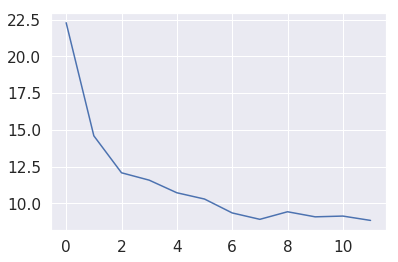

[0, 3, 0, 3, 0, 3, 1, 0, 1, 3, 1, 1, 3, 1, 0, 2, 0, 0, 0, 3, 0, 0, 1, 0, 0, 0, 0, 0, 3, 1, 3, 0, 3, 3, 3, 1, 0, 0, 3, 3, 0, 3, 1, 3, 3, 3, 1, 3, 3, 1, 3, 3, 0, 3, 1, 1, 2, 1, 3, 0, 3, 3, 0, 0, 3, 2, 1, 1, 3, 1, 1, 0, 3, 3, 1, 3, 2, 3, 0, 3, 0, 1, 3, 3, 0, 1, 3, 1, 1, 0, 0, 3, 0, 3, 1, 2, 0, 0, 3, 3, 3, 1, 0, 0, 3, 3, 3, 3, 3, 1, 1, 3, 0, 3, 3, 1, 1, 3, 0, 3, 3, 1, 1, 3, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 3, 1, 0, 1, 1, 3, 1, 0, 3, 0, 3, 1, 1, 0, 1, 0, 3, 3, 3, 1, 0, 3, 3, 1, 0, 0, 3, 1, 3, 1, 1, 3, 1, 0, 0, 0, 0, 2, 1, 0, 3, 1, 1, 2, 0, 0, 3, 3, 3, 3, 1, 1, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          889           45            4           62
C.f Soldier           34          961            2            3
C.d Soldier           21            4          971            4
R.f Soldier            2            6            2          990


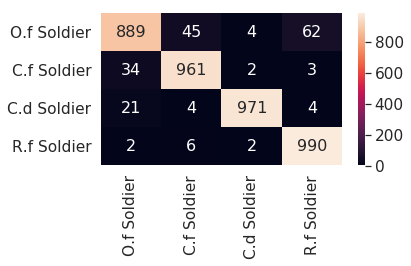


[13] accuracy: 0.949 loss: 9.169

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625]


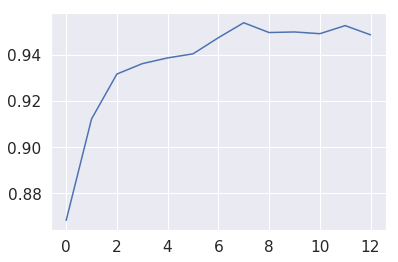

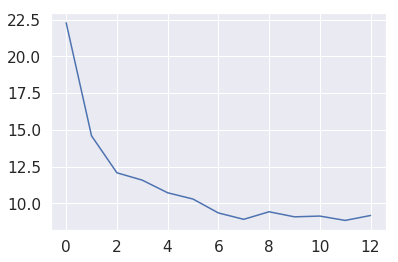

[1, 2, 2, 1, 2, 0, 1, 1, 1, 3, 0, 3, 3, 1, 2, 1, 1, 2, 0, 3, 2, 1, 0, 0, 0, 0, 0, 0, 2, 0, 2, 3, 3, 3, 0, 2, 3, 3, 1, 0, 0, 3, 1, 1, 1, 3, 3, 3, 1, 3, 0, 1, 0, 0, 0, 1, 1, 3, 1, 1, 3, 0, 1, 1, 1, 1, 0, 3, 3, 3, 0, 3, 0, 1, 1, 1, 2, 3, 0, 3, 3, 1, 0, 0, 0, 3, 0, 0, 0, 1, 1, 3, 2, 0, 3, 0, 1, 3, 0, 1, 1, 0, 3, 0, 2, 1, 1, 3, 1, 3, 1, 1, 1, 1, 1, 3, 3, 3, 1, 3, 0, 0, 3, 2, 1, 2, 0, 1, 0, 0, 3, 3, 3, 3, 0, 1, 1, 0, 1, 3, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 3, 0, 2, 0, 0, 1, 0, 1, 1, 1, 3, 0, 3, 3, 1, 1, 3, 1, 0, 1, 2, 3, 0, 3, 3, 0, 3, 0, 3, 0, 0, 0, 1, 1, 2, 1, 1, 1, 1, 3, 3, 3, 1, 0, 0, 3, 3, 3, 3, 0, 3, 0, 3, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          879           48           13           60
C.f Soldier           30          968            2            0
C.d Soldier           33            2          963            2
R.f Soldier            2           11            2          985


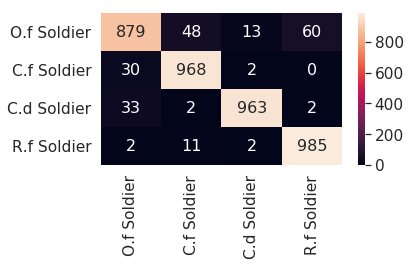


[14] accuracy: 0.958 loss: 8.253

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983]


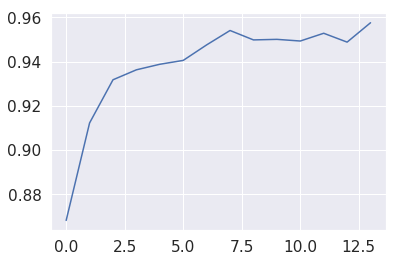

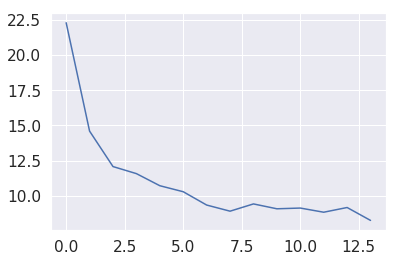

[3, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 3, 3, 3, 0, 0, 2, 1, 0, 0, 3, 0, 1, 0, 0, 0, 3, 0, 3, 1, 3, 2, 3, 2, 1, 1, 0, 1, 1, 1, 3, 0, 1, 3, 1, 0, 0, 3, 0, 1, 3, 0, 3, 1, 1, 3, 1, 0, 1, 0, 1, 3, 3, 1, 1, 3, 2, 0, 0, 0, 1, 1, 0, 0, 3, 0, 0, 0, 0, 0, 1, 3, 2, 3, 3, 0, 1, 3, 3, 0, 0, 0, 1, 1, 0, 3, 1, 0, 1, 1, 3, 3, 1, 3, 3, 0, 1, 0, 0, 1, 0, 0, 0, 2, 0, 1, 3, 0, 1, 3, 1, 1, 3, 0, 1, 3, 3, 3, 3, 0, 3, 3, 1, 3, 3, 1, 3, 3, 3, 0, 1, 0, 3, 1, 3, 0, 1, 1, 3, 3, 3, 0, 1, 0, 0, 1, 0, 3, 1, 1, 1, 1, 0, 3, 2, 1, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          908           41            4           47
C.f Soldier           32          966            1            1
C.d Soldier           24            4          970            2
R.f Soldier            3            9            2          986


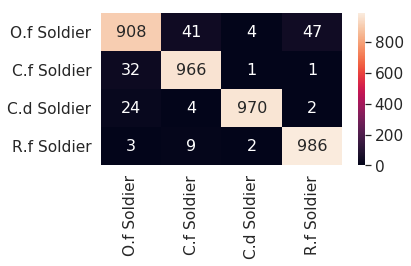


[15] accuracy: 0.958 loss: 8.330

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787]


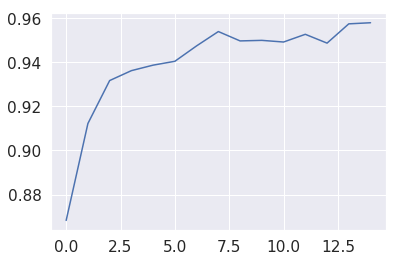

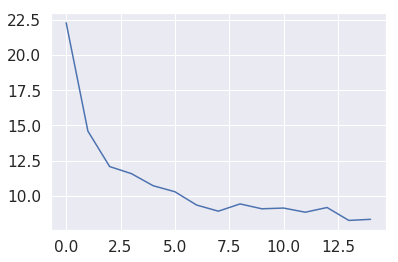

[1, 3, 3, 0, 1, 0, 0, 0, 1, 3, 0, 1, 3, 3, 2, 0, 1, 1, 1, 0, 1, 3, 0, 0, 2, 0, 3, 0, 2, 3, 3, 2, 2, 0, 0, 0, 0, 0, 2, 1, 1, 0, 2, 3, 0, 3, 0, 0, 0, 1, 1, 1, 2, 1, 0, 2, 0, 1, 2, 3, 3, 3, 2, 1, 3, 1, 1, 3, 1, 1, 3, 3, 1, 0, 0, 1, 0, 1, 3, 3, 3, 0, 1, 0, 0, 1, 3, 3, 3, 3, 3, 1, 0, 3, 0, 1, 3, 2, 2, 1, 1, 3, 1, 0, 3, 3, 3, 1, 3, 1, 3, 2, 1, 0, 1, 0, 1, 3, 3, 3, 3, 0, 0, 0, 3, 0, 0, 3, 3, 1, 3, 3, 1, 0, 1, 3, 3, 1, 0, 1, 3, 0, 2, 0, 1, 1, 0, 1, 3, 0, 0, 1, 1, 0, 3, 0, 1, 1, 3, 3, 2, 0, 0, 0, 0, 0, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          900           39           12           49
C.f Soldier           23          974            2            1
C.d Soldier           25            3          972            0
R.f Soldier            5            7            2          986


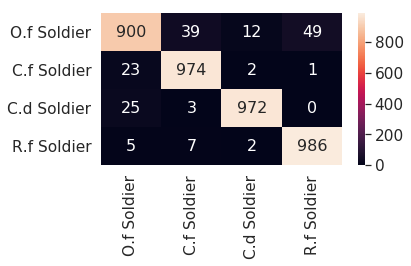


[16] accuracy: 0.955 loss: 8.677

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975]


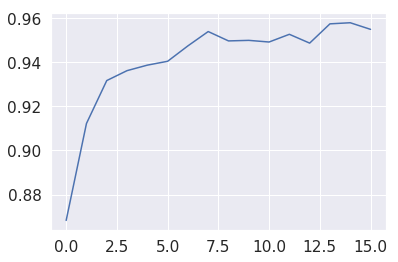

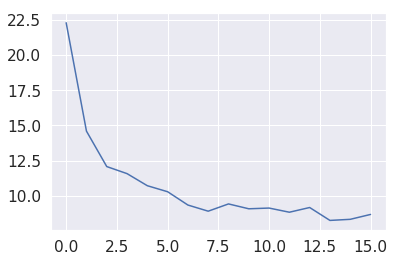

[3, 1, 3, 0, 0, 1, 0, 0, 2, 0, 3, 3, 0, 1, 1, 3, 0, 2, 2, 1, 1, 1, 1, 0, 1, 0, 2, 1, 3, 0, 3, 0, 3, 1, 3, 1, 0, 0, 1, 3, 0, 0, 3, 3, 3, 3, 1, 2, 0, 0, 0, 1, 3, 1, 0, 0, 3, 2, 1, 3, 3, 0, 1, 1, 0, 3, 0, 3, 3, 1, 1, 2, 3, 1, 1, 0, 1, 2, 0, 0, 0, 1, 0, 2, 0, 1, 0, 1, 1, 3, 3, 0, 0, 3, 1, 1, 3, 3, 3, 1, 3, 1, 3, 0, 0, 1, 2, 3, 1, 3, 2, 0, 0, 3, 1, 1, 0, 1, 3, 0, 0, 0, 0, 3, 1, 1, 1, 0, 1, 1, 3, 3, 0, 0, 2, 0, 0, 1, 0, 1, 0, 1, 3, 1, 0, 0, 0, 3, 2, 0, 0, 0, 3, 3, 3, 3, 0, 0, 3, 1, 1, 2, 3, 0, 1, 3, 1, 3, 0, 1, 0, 1, 1, 1, 1, 3, 3, 3, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          898           43           11           48
C.f Soldier           35          962            1            2
C.d Soldier           21            5          973            1
R.f Soldier            4            7            2          987


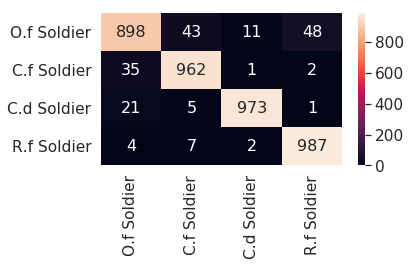


[17] accuracy: 0.959 loss: 8.112

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627]


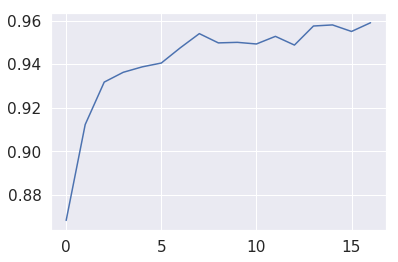

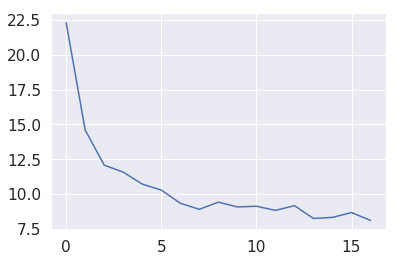

[1, 0, 3, 3, 0, 3, 1, 3, 3, 0, 1, 1, 1, 0, 0, 1, 0, 0, 3, 0, 1, 3, 0, 3, 3, 0, 1, 1, 0, 2, 1, 1, 1, 1, 3, 0, 0, 0, 2, 3, 1, 3, 3, 0, 3, 0, 1, 0, 0, 1, 3, 1, 1, 1, 1, 1, 3, 3, 3, 3, 0, 3, 0, 2, 1, 1, 3, 1, 3, 0, 3, 3, 0, 3, 0, 1, 1, 3, 1, 1, 0, 0, 2, 1, 1, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 3, 3, 3, 3, 3, 2, 3, 0, 1, 1, 0, 0, 0, 1, 2, 3, 2, 0, 0, 2, 1, 3, 3, 1, 0, 3, 0, 0, 3, 3, 3, 1, 1, 2, 0, 0, 3, 3, 1, 3, 0, 0, 1, 2, 0, 1, 2, 1, 0, 1, 0, 1, 1, 3, 3, 0, 0, 0, 1, 1, 2, 1, 0, 0, 3, 1, 0, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          903           43            9           45
C.f Soldier           26          973            1            0
C.d Soldier           24            3          970            3
R.f Soldier            1            6            3          990


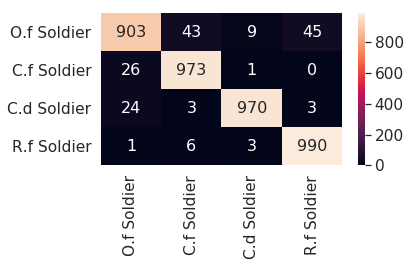


[18] accuracy: 0.960 loss: 7.716

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574]


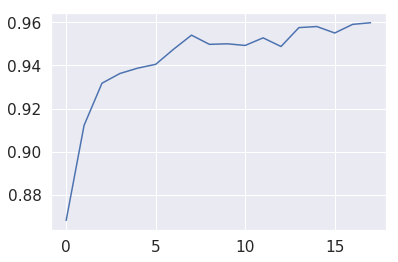

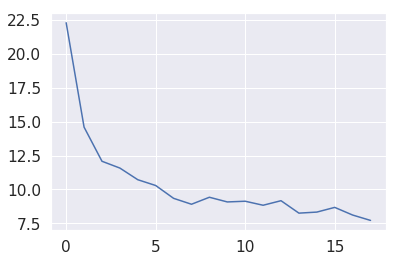

[3, 1, 0, 0, 0, 0, 1, 0, 3, 1, 3, 0, 0, 0, 0, 3, 3, 3, 1, 0, 0, 1, 3, 1, 0, 3, 0, 1, 1, 1, 1, 3, 3, 0, 3, 0, 3, 3, 1, 0, 0, 1, 1, 0, 2, 0, 1, 0, 3, 1, 3, 3, 2, 0, 2, 0, 1, 1, 0, 3, 0, 3, 0, 3, 3, 0, 1, 1, 0, 3, 3, 3, 1, 0, 0, 0, 0, 3, 1, 3, 0, 0, 3, 0, 3, 0, 3, 0, 1, 1, 3, 1, 0, 3, 3, 1, 3, 0, 1, 1, 1, 0, 2, 3, 0, 0, 0, 0, 0, 0, 2, 0, 1, 3, 0, 1, 1, 0, 0, 3, 1, 3, 1, 3, 0, 1, 1, 1, 0, 2, 1, 0, 0, 1, 1, 3, 2, 1, 0, 1, 1, 2, 1, 3, 1, 0, 1, 1, 3, 0, 3, 3, 3, 1, 0, 1, 0, 1, 3, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          914           38            5           43
C.f Soldier           25          973            1            1
C.d Soldier           28            4          966            2
R.f Soldier            5            7            2          986


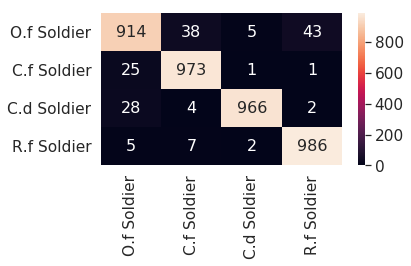


[19] accuracy: 0.958 loss: 8.305

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323]


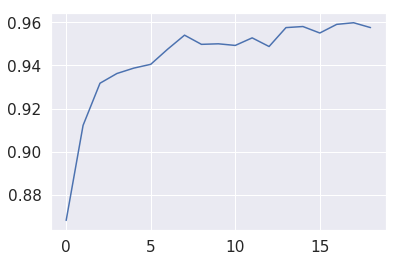

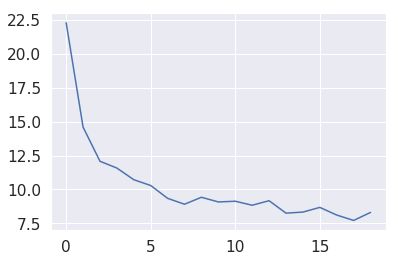

[3, 3, 1, 0, 1, 1, 3, 3, 1, 3, 0, 0, 2, 3, 3, 3, 0, 0, 1, 1, 2, 3, 3, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1, 0, 0, 1, 0, 3, 0, 3, 1, 0, 1, 0, 0, 0, 0, 0, 3, 1, 1, 2, 3, 3, 3, 1, 0, 0, 3, 3, 1, 1, 1, 1, 0, 3, 2, 3, 3, 3, 1, 2, 1, 0, 1, 1, 0, 3, 0, 1, 1, 2, 0, 1, 2, 1, 3, 3, 1, 1, 3, 2, 1, 1, 3, 1, 1, 3, 0, 1, 0, 3, 2, 1, 1, 3, 1, 1, 0, 3, 1, 3, 2, 3, 0, 3, 3, 0, 3, 0, 3, 0, 1, 3, 0, 0, 2, 3, 3, 2, 1, 0, 2, 0, 3, 0, 2, 1, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 3, 0, 1, 0, 3, 0, 1, 1, 3, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          900           44           11           45
C.f Soldier           26          973            1            0
C.d Soldier           19            5          974            2
R.f Soldier            4           10            3          983


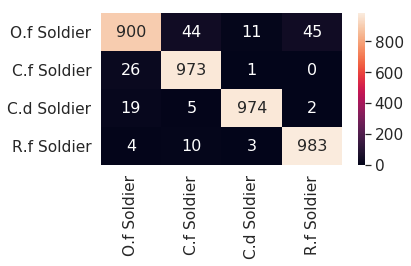


[20] accuracy: 0.958 loss: 7.548

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246]


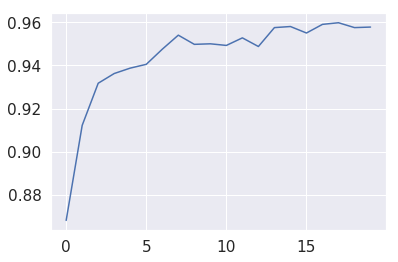

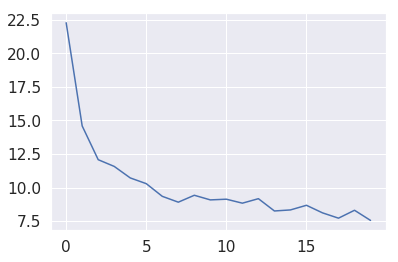

[3, 0, 1, 3, 1, 1, 0, 1, 1, 1, 0, 2, 0, 0, 3, 3, 1, 0, 0, 0, 1, 3, 0, 3, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 3, 3, 1, 2, 3, 3, 3, 3, 0, 3, 2, 3, 0, 1, 1, 1, 0, 0, 0, 0, 3, 3, 0, 0, 3, 3, 2, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 3, 3, 3, 3, 1, 1, 0, 1, 2, 1, 1, 1, 0, 0, 3, 3, 1, 0, 2, 0, 0, 0, 3, 0, 1, 1, 0, 1, 1, 1, 1, 3, 3, 3, 1, 3, 1, 3, 2, 3, 2, 2, 0, 3, 1, 1, 3, 1, 3, 0, 2, 3, 3, 1, 3, 3, 0, 1, 1, 0, 1, 3, 1, 2, 0, 0, 3, 1, 1, 3, 0, 1, 3, 0, 1, 1, 1, 0, 0, 0, 1, 3, 1, 0, 2, 1, 0, 3, 0, 1, 3, 3, 1, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          903           47            7           43
C.f Soldier           26          971            2            1
C.d Soldier           21            4          972            3
R.f Soldier            4            8            3          985


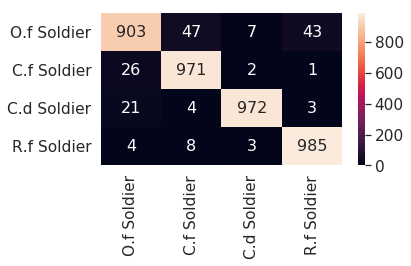


[21] accuracy: 0.958 loss: 7.666

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985]


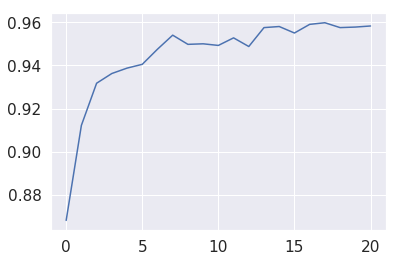

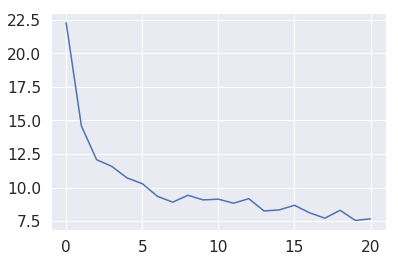

[0, 0, 1, 1, 2, 1, 0, 0, 1, 1, 0, 1, 3, 3, 3, 3, 0, 3, 0, 1, 1, 0, 3, 3, 0, 3, 0, 2, 3, 3, 3, 3, 0, 1, 3, 1, 1, 0, 0, 1, 2, 3, 0, 0, 1, 0, 1, 0, 0, 3, 3, 0, 0, 3, 3, 0, 3, 2, 3, 2, 2, 1, 3, 3, 0, 3, 3, 1, 0, 1, 0, 0, 1, 3, 3, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 3, 3, 3, 3, 3, 3, 0, 3, 1, 3, 1, 1, 1, 1, 1, 3, 0, 1, 1, 0, 3, 3, 1, 3, 1, 1, 3, 1, 3, 1, 0, 1, 0, 1, 2, 3, 2, 3, 1, 3, 0, 1, 0, 0, 1, 0, 3, 1, 0, 1, 1, 1, 3, 2, 2, 1, 0, 0, 3, 1, 0, 0, 0, 0, 1, 2, 3, 0, 3, 0, 0, 3, 3, 0, 1, 1, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          902           42            7           49
C.f Soldier           25          974            1            0
C.d Soldier           27            2          970            1
R.f Soldier            2            8            3          987


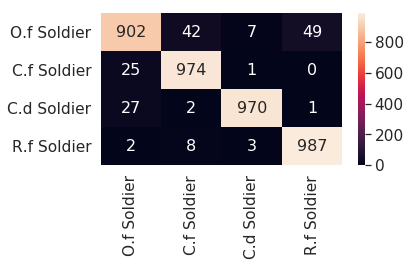


[22] accuracy: 0.964 loss: 7.474

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693]


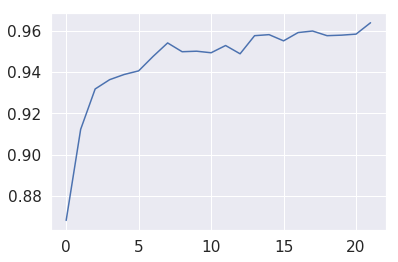

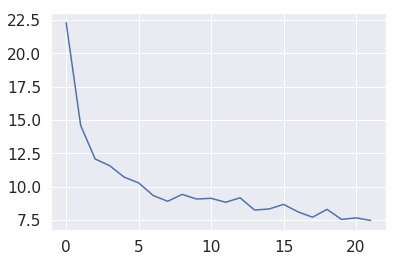

[1, 3, 1, 3, 3, 0, 0, 1, 3, 3, 0, 0, 1, 1, 0, 0, 3, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 3, 3, 0, 3, 0, 3, 3, 0, 1, 0, 0, 0, 1, 0, 3, 0, 3, 0, 1, 3, 1, 0, 1, 3, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 3, 2, 3, 1, 1, 1, 2, 0, 3, 0, 3, 3, 0, 2, 0, 0, 3, 2, 0, 1, 0, 3, 3, 3, 2, 0, 2, 3, 0, 1, 1, 0, 1, 3, 0, 1, 2, 3, 3, 1, 3, 3, 1, 1, 0, 0, 0, 2, 2, 3, 3, 0, 1, 1, 2, 1, 2, 0, 3, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 3, 1, 2, 2, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          921           37            9           33
C.f Soldier           29          970            1            0
C.d Soldier           18            3          978            1
R.f Soldier            5            6            3          986


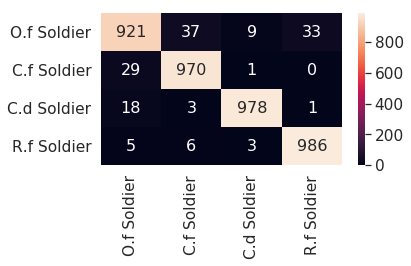


[23] accuracy: 0.963 loss: 7.220

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279]


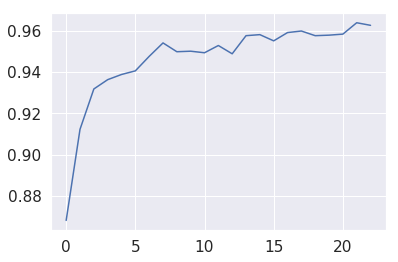

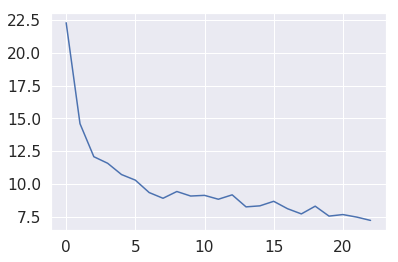

[3, 3, 3, 2, 0, 3, 3, 0, 1, 3, 3, 1, 0, 3, 0, 1, 1, 1, 3, 1, 1, 0, 2, 3, 0, 0, 0, 0, 0, 2, 0, 1, 3, 3, 1, 2, 2, 3, 0, 2, 0, 3, 1, 3, 0, 0, 2, 0, 0, 3, 2, 0, 0, 1, 1, 3, 1, 1, 1, 1, 1, 1, 2, 0, 0, 1, 3, 0, 3, 1, 0, 3, 3, 0, 3, 1, 1, 1, 0, 0, 3, 1, 3, 3, 0, 1, 1, 1, 0, 0, 1, 2, 2, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 0, 1, 0, 0, 0, 1, 1, 3, 3, 0, 3, 1, 3, 1, 2, 1, 1, 2, 3, 3, 0, 0, 3, 1, 1, 3, 1, 3, 0, 1, 1, 0, 0, 0, 3, 3, 2, 0, 0, 1, 3, 1, 0, 3, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           36            9           39
C.f Soldier           30          968            2            0
C.d Soldier           19            1          978            2
R.f Soldier            2            6            4          988


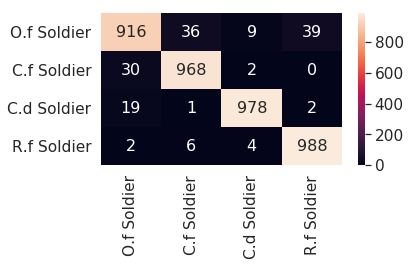


[24] accuracy: 0.961 loss: 7.484

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172]


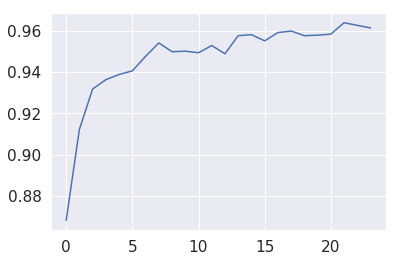

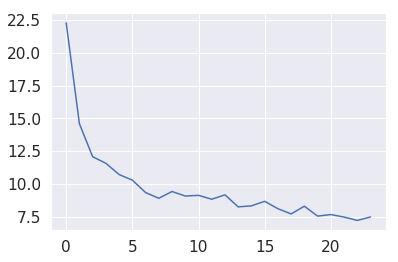

[3, 1, 1, 3, 2, 1, 0, 1, 0, 0, 1, 3, 1, 3, 0, 1, 1, 1, 0, 0, 3, 2, 0, 1, 2, 1, 1, 2, 1, 3, 2, 1, 1, 0, 1, 0, 3, 0, 0, 1, 0, 2, 3, 1, 3, 3, 1, 1, 1, 1, 3, 0, 3, 3, 2, 1, 0, 0, 1, 0, 3, 1, 2, 0, 3, 1, 1, 3, 3, 0, 0, 1, 3, 0, 3, 3, 1, 0, 3, 3, 0, 3, 1, 2, 3, 0, 3, 3, 1, 0, 1, 3, 1, 3, 3, 3, 1, 0, 0, 0, 3, 1, 2, 0, 0, 3, 2, 1, 0, 1, 0, 1, 2, 1, 1, 1, 3, 0, 0, 0, 1, 0, 3, 0, 3, 1, 3, 3, 3, 1, 2, 1, 1, 1, 0, 1, 0, 3, 0, 0, 0, 0, 1, 3, 0, 3, 0, 0, 1, 0, 0, 3, 0, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           43            9           41
C.f Soldier           21          977            2            0
C.d Soldier           26            2          969            3
R.f Soldier            1            5            2          992


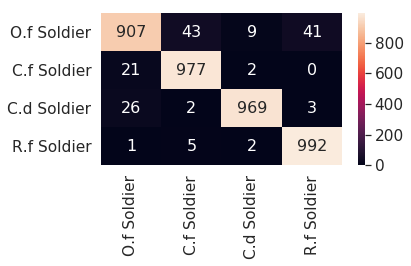


[25] accuracy: 0.961 loss: 7.986

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132]


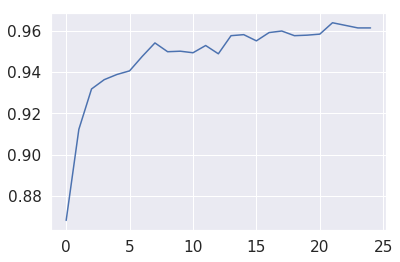

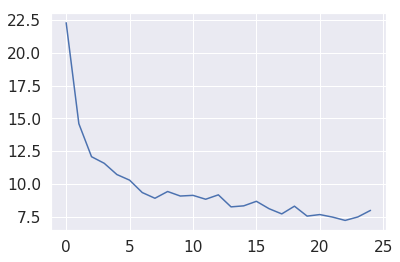

[0, 3, 3, 3, 1, 3, 3, 3, 0, 3, 1, 3, 3, 1, 3, 0, 1, 0, 0, 2, 3, 0, 3, 1, 3, 1, 1, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 1, 3, 0, 3, 3, 3, 0, 1, 1, 3, 0, 1, 1, 1, 0, 1, 1, 3, 0, 1, 0, 3, 2, 3, 0, 1, 0, 3, 0, 1, 0, 1, 3, 1, 3, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 3, 1, 3, 3, 3, 1, 0, 0, 0, 0, 1, 0, 3, 3, 1, 1, 3, 1, 1, 1, 1, 2, 3, 1, 0, 3, 1, 3, 1, 0, 3, 0, 3, 0, 0, 3, 0, 0, 0, 2, 2, 0, 0, 3, 3, 3, 2, 1, 2, 0, 0, 1, 0, 0, 0, 3, 3, 0, 0, 3, 3, 3, 3, 2, 3, 1, 3, 3, 1, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          909           38            5           48
C.f Soldier           28          971            1            0
C.d Soldier           15            2          981            2
R.f Soldier            7            6            3          984


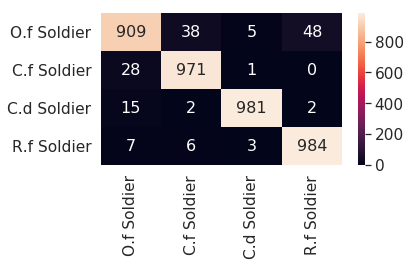


[26] accuracy: 0.961 loss: 7.269

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381]


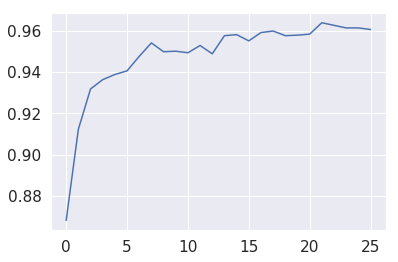

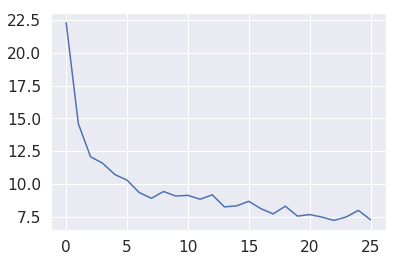

[3, 1, 3, 0, 0, 3, 3, 3, 0, 3, 0, 3, 0, 2, 0, 0, 1, 3, 0, 1, 0, 1, 1, 0, 3, 0, 3, 3, 1, 0, 3, 3, 3, 0, 0, 1, 1, 2, 1, 0, 1, 3, 1, 0, 3, 0, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 3, 3, 1, 1, 2, 1, 3, 1, 0, 3, 0, 3, 0, 3, 1, 2, 0, 0, 0, 1, 0, 0, 1, 3, 1, 1, 1, 3, 0, 3, 0, 0, 3, 2, 0, 0, 1, 3, 3, 2, 3, 3, 1, 3, 3, 0, 0, 1, 0, 1, 1, 0, 0, 3, 3, 1, 0, 1, 1, 3, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 0, 1, 0, 3, 1, 3, 1, 1, 3, 3, 3, 3, 1, 1, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           45            6           42
C.f Soldier           29          970            0            1
C.d Soldier           18            1          979            2
R.f Soldier            6            6            2          986


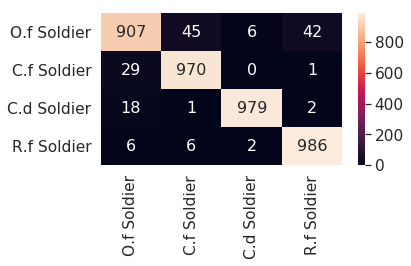


[27] accuracy: 0.956 loss: 8.474

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604]


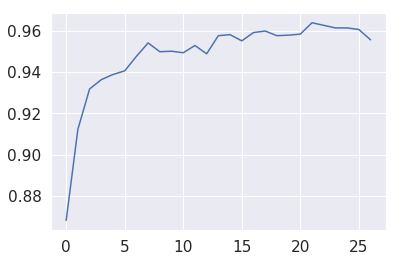

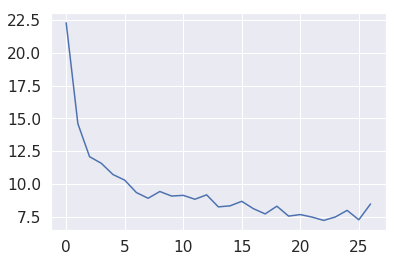

[0, 3, 1, 0, 1, 3, 0, 0, 3, 1, 0, 1, 3, 3, 1, 3, 1, 0, 3, 3, 0, 0, 3, 1, 1, 0, 3, 1, 0, 0, 3, 1, 1, 0, 3, 3, 3, 3, 3, 2, 1, 2, 0, 1, 1, 0, 1, 1, 0, 1, 3, 1, 0, 0, 2, 0, 1, 1, 3, 0, 3, 3, 3, 1, 2, 1, 0, 0, 1, 1, 3, 2, 1, 3, 1, 1, 1, 3, 3, 0, 1, 0, 1, 0, 1, 1, 3, 3, 3, 1, 3, 0, 0, 2, 1, 1, 3, 1, 3, 3, 3, 0, 1, 0, 1, 1, 0, 0, 0, 0, 2, 3, 0, 3, 1, 1, 1, 1, 1, 3, 1, 1, 0, 0, 2, 1, 1, 1, 1, 0, 1, 0, 1, 3, 3, 2, 0, 3, 1, 0, 0, 0, 3, 0, 3, 1, 1, 1, 3, 0, 0, 1, 1, 1, 1, 3, 3, 3, 0, 1, 1, 0, 3, 3, 1, 0, 0, 0, 3, 3, 3, 1, 1, 0, 0, 1, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          896           51            6           47
C.f Soldier           25          974            1            0
C.d Soldier           24            6          967            3
R.f Soldier            4            9            2          985


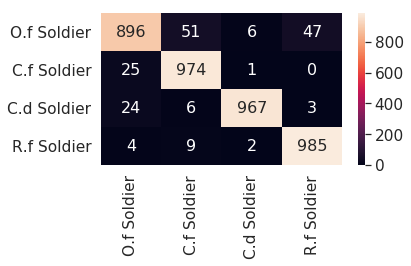


[28] accuracy: 0.962 loss: 8.082

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526]


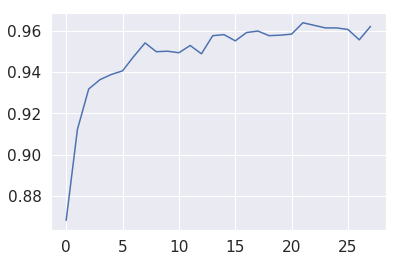

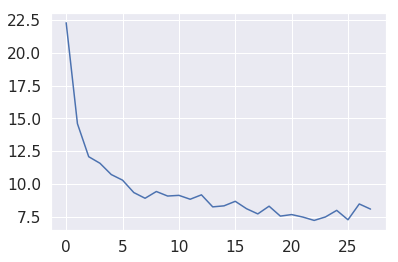

[1, 1, 1, 0, 1, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 3, 3, 1, 3, 3, 3, 1, 1, 1, 3, 1, 0, 1, 3, 0, 0, 1, 0, 0, 0, 1, 1, 2, 0, 0, 0, 3, 0, 1, 3, 1, 3, 1, 1, 0, 3, 3, 3, 1, 2, 0, 0, 0, 1, 0, 1, 1, 2, 3, 0, 0, 1, 1, 1, 3, 2, 0, 0, 3, 3, 1, 1, 1, 0, 3, 2, 2, 0, 2, 1, 1, 3, 2, 1, 0, 3, 0, 1, 3, 0, 3, 0, 1, 0, 3, 2, 0, 1, 0, 3, 3, 1, 3, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 3, 3, 0, 0, 0, 0, 0, 0, 1, 3, 3, 3, 2, 2, 1, 0, 0, 0, 1, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           44            8           32
C.f Soldier           27          972            1            0
C.d Soldier           22            1          975            2
R.f Soldier            4            9            2          985


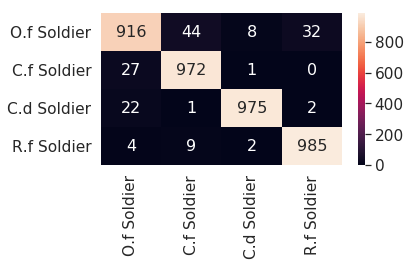


[29] accuracy: 0.957 loss: 8.515

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259]


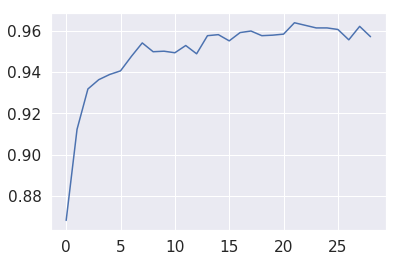

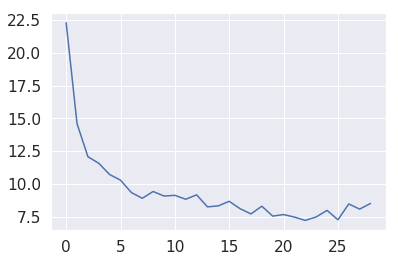

[1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 3, 1, 1, 1, 1, 0, 1, 0, 1, 3, 1, 1, 0, 3, 0, 1, 0, 3, 1, 1, 3, 3, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 3, 1, 0, 2, 3, 3, 0, 3, 0, 0, 0, 0, 3, 0, 3, 0, 3, 0, 3, 1, 3, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 2, 1, 0, 3, 3, 1, 1, 0, 3, 3, 3, 3, 2, 1, 1, 0, 1, 2, 0, 1, 1, 3, 1, 0, 1, 0, 3, 0, 1, 1, 3, 2, 3, 0, 1, 1, 1, 2, 0, 3, 0, 2, 0, 3, 3, 1, 3, 1, 1, 0, 3, 0, 2, 0, 1, 3, 0, 3, 0, 0, 1, 1, 1, 1, 0, 1, 1, 3, 1, 0, 1, 3, 1, 1, 0, 2, 0, 0, 3, 3, 3, 3, 3, 3, 3, 0, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          902           51            6           41
C.f Soldier           29          970            1            0
C.d Soldier           22            5          972            1
R.f Soldier            4           10            2          984


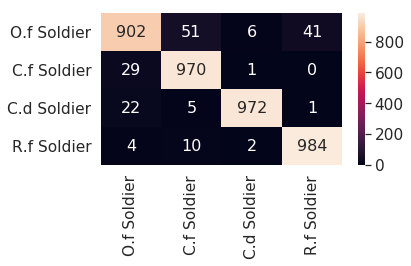


[30] accuracy: 0.962 loss: 7.851

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172]


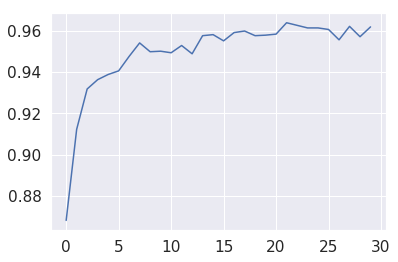

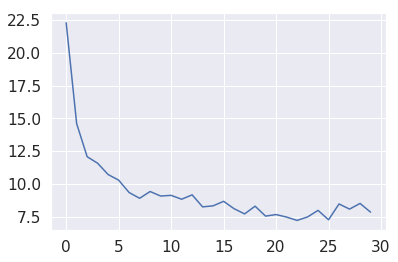

[3, 0, 2, 0, 0, 1, 0, 1, 1, 3, 1, 1, 1, 1, 0, 3, 1, 0, 2, 3, 3, 3, 3, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 2, 1, 1, 1, 1, 3, 3, 0, 1, 1, 0, 0, 1, 0, 3, 1, 3, 0, 3, 3, 0, 1, 3, 3, 3, 3, 1, 1, 3, 0, 1, 0, 3, 3, 0, 1, 0, 0, 3, 0, 0, 3, 0, 3, 0, 1, 0, 3, 3, 3, 3, 2, 3, 1, 1, 0, 3, 0, 2, 3, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 3, 3, 3, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 0, 1, 3, 2, 3, 3, 1, 2, 0, 0, 3, 3, 2, 0, 2, 1, 3, 0, 1, 1, 0, 3, 0, 3, 0, 0, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          911           42            7           40
C.f Soldier           30          969            1            0
C.d Soldier           17            2          979            2
R.f Soldier            3            6            3          988


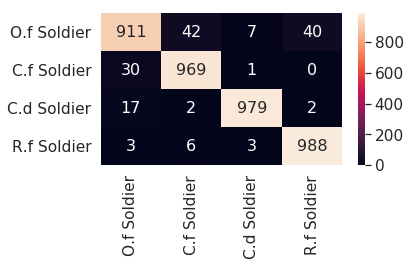


[31] accuracy: 0.960 loss: 8.204

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738]


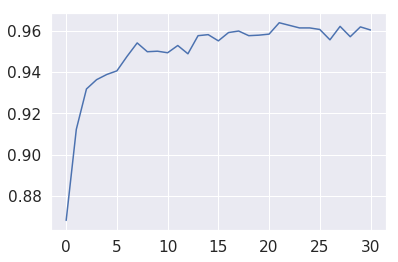

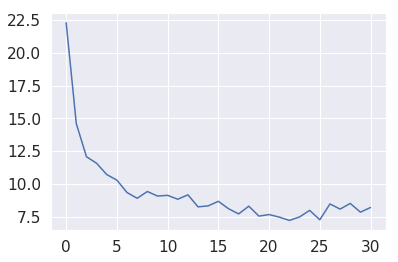

[1, 3, 0, 2, 3, 0, 3, 3, 0, 1, 3, 3, 0, 1, 3, 0, 3, 1, 0, 3, 0, 1, 1, 0, 3, 3, 1, 0, 3, 3, 0, 3, 1, 0, 3, 3, 1, 3, 2, 0, 1, 0, 3, 1, 3, 3, 0, 0, 2, 3, 3, 1, 1, 1, 2, 3, 3, 0, 1, 1, 0, 1, 0, 0, 0, 3, 1, 1, 1, 3, 3, 1, 1, 3, 1, 0, 1, 2, 0, 1, 1, 0, 0, 0, 0, 1, 2, 1, 0, 1, 3, 2, 1, 1, 0, 0, 0, 3, 1, 1, 1, 3, 3, 1, 0, 1, 1, 0, 3, 0, 3, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 3, 3, 0, 1, 1, 1, 1, 0, 3, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 3, 3, 3, 3, 0, 0, 2, 1, 0, 2, 2, 3, 1, 3, 0, 0, 3, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          912           41            7           40
C.f Soldier           35          963            1            1
C.d Soldier           16            3          978            3
R.f Soldier            2            8            2          988


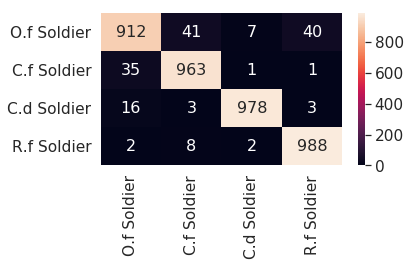


[32] accuracy: 0.958 loss: 8.992

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532]


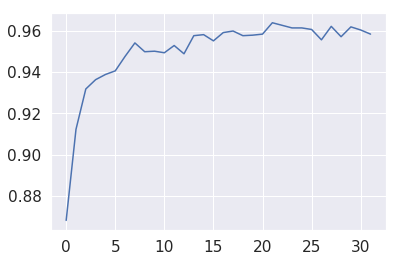

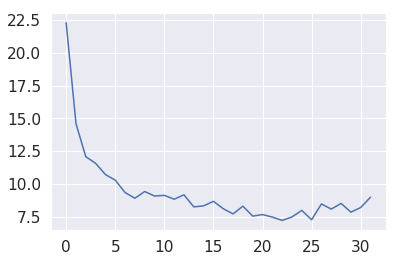

[0, 3, 1, 2, 3, 3, 1, 1, 3, 1, 0, 0, 1, 2, 1, 3, 0, 0, 1, 0, 0, 0, 3, 0, 0, 0, 3, 1, 1, 3, 3, 3, 1, 0, 1, 0, 1, 1, 1, 1, 3, 3, 2, 1, 0, 0, 1, 2, 0, 3, 1, 1, 1, 3, 2, 1, 3, 3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 1, 1, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 2, 3, 0, 3, 3, 2, 3, 1, 0, 3, 3, 0, 0, 3, 0, 3, 0, 1, 1, 3, 0, 1, 1, 1, 0, 3, 2, 0, 0, 1, 3, 1, 3, 3, 1, 3, 1, 3, 2, 0, 1, 3, 0, 0, 0, 0, 3, 1, 0, 1, 1, 3, 0, 3, 1, 1, 0, 2, 2, 1, 3, 3, 0, 1, 1, 2, 1, 3, 1, 0, 1, 3, 0, 3, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          904           47            8           41
C.f Soldier           32          967            1            0
C.d Soldier           20            1          976            3
R.f Soldier            2            9            3          986


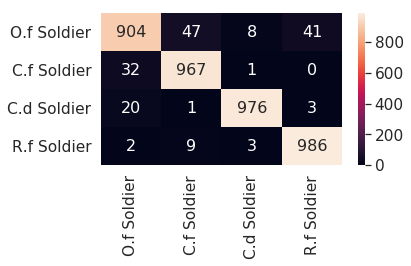


[33] accuracy: 0.960 loss: 8.499

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594]


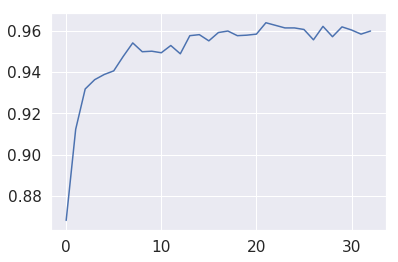

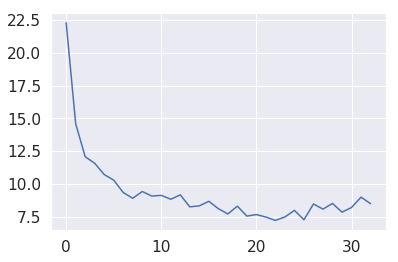

[0, 0, 0, 3, 0, 1, 3, 1, 0, 0, 0, 0, 3, 0, 3, 0, 3, 0, 3, 3, 3, 1, 3, 1, 0, 1, 1, 0, 3, 3, 3, 3, 3, 0, 3, 0, 3, 3, 3, 0, 1, 3, 1, 0, 1, 1, 1, 1, 1, 3, 3, 1, 3, 0, 1, 0, 3, 0, 1, 0, 0, 2, 3, 3, 3, 3, 3, 1, 3, 3, 1, 0, 1, 0, 3, 1, 3, 3, 0, 0, 3, 3, 2, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 2, 3, 3, 3, 0, 1, 3, 2, 1, 3, 1, 1, 1, 3, 1, 3, 0, 0, 1, 0, 0, 2, 0, 0, 1, 1, 0, 1, 2, 1, 1, 0, 0, 0, 0, 3, 3, 3, 1, 0, 1, 1, 3, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           47            2           44
C.f Soldier           28          970            2            0
C.d Soldier           23            2          973            2
R.f Soldier            2            7            2          989


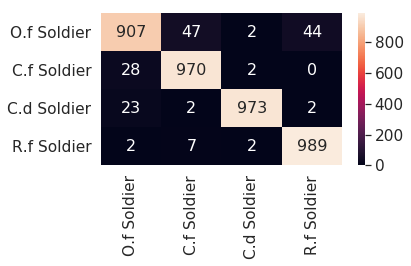


[34] accuracy: 0.961 loss: 7.755

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 7.755252653732896]


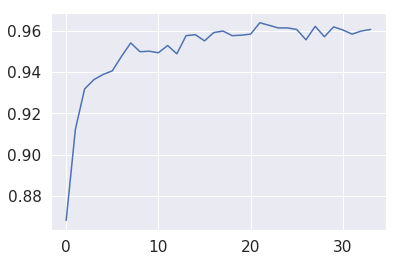

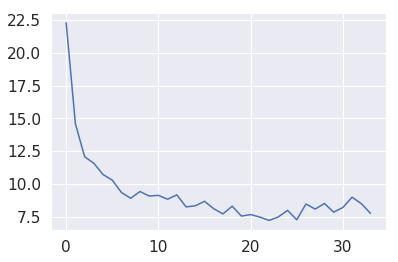

[1, 0, 1, 1, 3, 3, 0, 0, 1, 0, 1, 1, 0, 2, 3, 2, 1, 3, 1, 1, 3, 1, 1, 0, 1, 1, 0, 3, 1, 3, 0, 0, 1, 3, 1, 1, 1, 3, 3, 2, 1, 3, 1, 1, 1, 3, 0, 1, 1, 0, 3, 0, 3, 2, 0, 3, 0, 3, 2, 0, 0, 3, 2, 0, 2, 0, 1, 0, 0, 3, 1, 1, 3, 0, 2, 3, 1, 0, 3, 0, 0, 0, 3, 3, 2, 1, 0, 0, 3, 0, 0, 1, 3, 3, 3, 1, 0, 2, 0, 0, 3, 1, 0, 3, 3, 2, 0, 1, 3, 0, 0, 1, 0, 1, 1, 0, 1, 3, 1, 1, 0, 3, 1, 1, 1, 3, 3, 0, 0, 1, 0, 3, 3, 2, 1, 1, 3, 1, 2, 3, 3, 1, 3, 0, 3, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          904           46            9           41
C.f Soldier           24          974            2            0
C.d Soldier           18            4          976            2
R.f Soldier            5            5            2          988


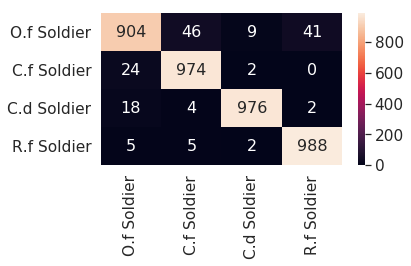


[35] accuracy: 0.965 loss: 6.795

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 7.755252653732896, 6.795429678633809]


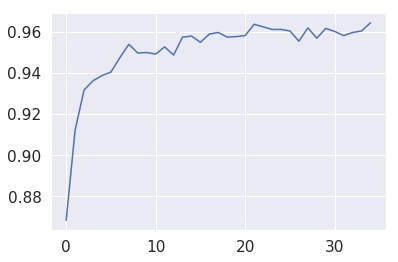

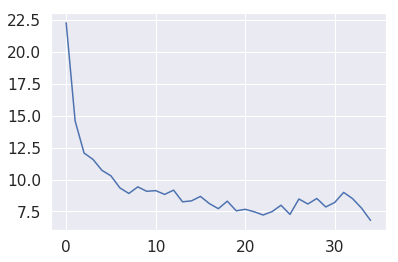

[1, 1, 0, 0, 3, 0, 0, 0, 0, 3, 3, 0, 3, 3, 1, 0, 1, 2, 1, 3, 0, 3, 3, 3, 3, 1, 3, 2, 1, 3, 0, 3, 3, 1, 1, 3, 1, 3, 3, 2, 3, 3, 1, 1, 0, 1, 1, 1, 0, 1, 1, 3, 1, 1, 3, 2, 1, 3, 1, 0, 1, 0, 3, 1, 0, 1, 0, 3, 3, 1, 0, 2, 0, 2, 0, 1, 0, 3, 3, 0, 1, 0, 1, 3, 3, 0, 0, 3, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 3, 3, 1, 1, 0, 0, 1, 0, 3, 2, 3, 0, 0, 0, 1, 0, 0, 1, 0, 2, 0, 3, 0, 1, 1, 0, 1, 3, 1, 0, 2, 2, 2, 0, 3, 3, 1, 3, 3, 1, 0, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          918           40            6           36
C.f Soldier           19          979            2            0
C.d Soldier           22            1          973            4
R.f Soldier            2            7            3          988


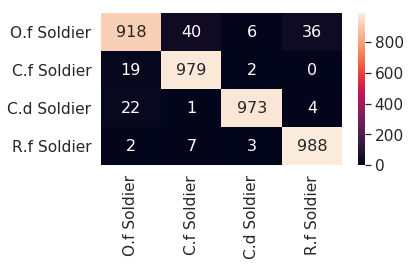


[36] accuracy: 0.961 loss: 7.608

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 7.755252653732896, 6.79542967863380

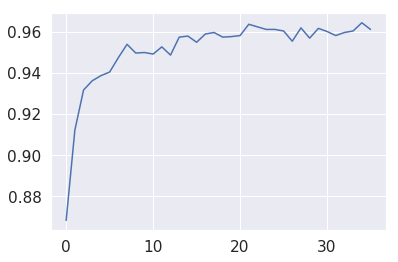

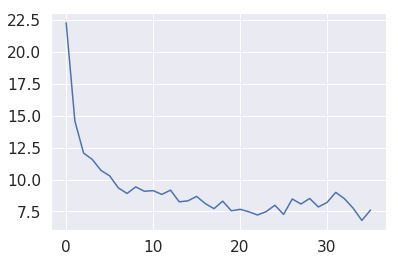

[1, 0, 2, 0, 1, 2, 0, 0, 0, 0, 0, 3, 3, 1, 0, 0, 1, 1, 3, 0, 0, 1, 0, 3, 0, 1, 3, 0, 1, 1, 3, 3, 2, 3, 1, 3, 3, 0, 0, 1, 3, 0, 1, 2, 0, 3, 3, 3, 3, 1, 3, 3, 3, 0, 1, 1, 0, 0, 3, 3, 1, 3, 1, 0, 3, 1, 1, 0, 1, 0, 0, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 0, 1, 2, 3, 0, 0, 0, 3, 1, 2, 0, 1, 2, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 3, 3, 0, 1, 2, 3, 2, 3, 0, 0, 0, 2, 0, 1, 3, 1, 1, 1, 1, 0, 0, 1, 1, 3, 1, 0, 0, 0, 2, 1, 0, 0, 0, 3, 3, 1, 1, 0, 3, 1, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          917           40            6           37
C.f Soldier           28          970            2            0
C.d Soldier           23            2          971            4
R.f Soldier            5            5            3          987


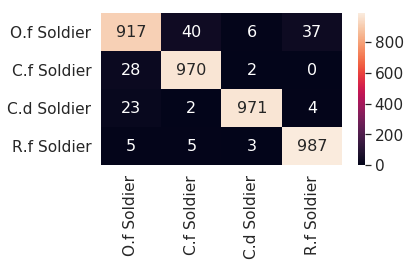


[37] accuracy: 0.961 loss: 7.863

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 7.755252653732896, 6.79542

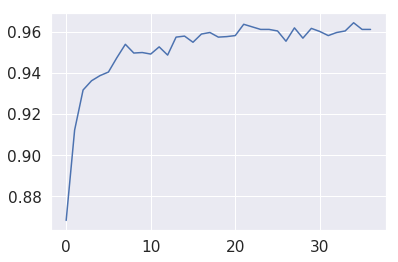

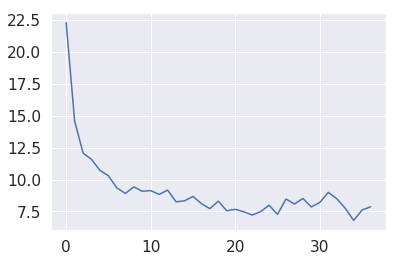

[0, 1, 1, 0, 1, 3, 2, 1, 1, 1, 1, 3, 2, 0, 0, 0, 3, 1, 0, 0, 2, 0, 0, 1, 0, 0, 3, 1, 1, 1, 1, 3, 0, 3, 1, 0, 3, 0, 0, 1, 0, 1, 0, 0, 0, 3, 3, 3, 0, 3, 0, 3, 1, 1, 3, 1, 0, 3, 0, 3, 3, 1, 1, 1, 3, 1, 3, 1, 0, 1, 1, 3, 2, 1, 1, 3, 1, 1, 1, 1, 1, 2, 3, 1, 0, 1, 0, 2, 0, 1, 3, 0, 0, 2, 3, 0, 1, 3, 2, 1, 3, 3, 1, 1, 0, 2, 0, 3, 3, 1, 1, 1, 0, 3, 3, 2, 3, 0, 1, 0, 1, 1, 3, 3, 1, 3, 3, 0, 0, 1, 3, 0, 3, 1, 0, 1, 0, 0, 0, 0, 0, 3, 1, 1, 1, 1, 1, 2, 0, 3, 0, 1, 0, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          903           50           10           37
C.f Soldier           25          975            0            0
C.d Soldier           18            1          979            2
R.f Soldier            4            6            2          988


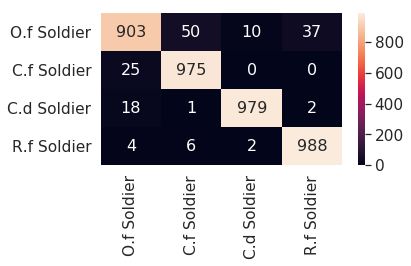


[38] accuracy: 0.964 loss: 7.360

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 7.755252653732896

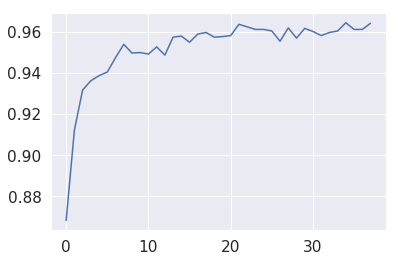

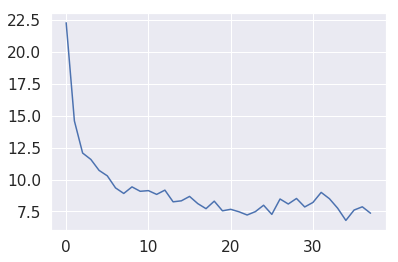

[0, 1, 0, 3, 1, 0, 0, 3, 0, 0, 3, 1, 3, 1, 3, 3, 3, 0, 0, 1, 3, 0, 2, 3, 1, 0, 1, 0, 0, 3, 0, 0, 0, 1, 1, 1, 3, 1, 3, 1, 3, 0, 0, 3, 0, 0, 0, 1, 1, 1, 0, 1, 1, 2, 3, 3, 0, 1, 3, 3, 3, 1, 0, 0, 3, 1, 1, 0, 3, 3, 1, 1, 0, 1, 0, 3, 3, 2, 1, 1, 2, 0, 0, 3, 1, 0, 1, 1, 0, 0, 0, 2, 1, 1, 1, 1, 0, 0, 1, 3, 1, 3, 1, 1, 1, 3, 3, 1, 3, 2, 2, 1, 0, 3, 3, 1, 1, 1, 0, 2, 0, 1, 0, 2, 3, 0, 0, 3, 0, 1, 0, 3, 1, 0, 0, 0, 1, 1, 2, 0, 0, 2, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          917           41            8           34
C.f Soldier           26          973            1            0
C.d Soldier           20            2          977            1
R.f Soldier            2            6            2          990


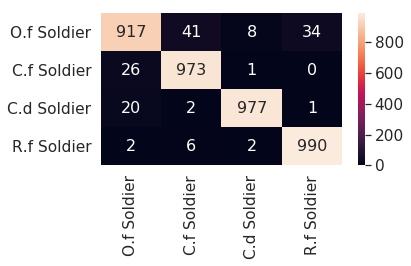


[39] accuracy: 0.962 loss: 7.483

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 7.755252

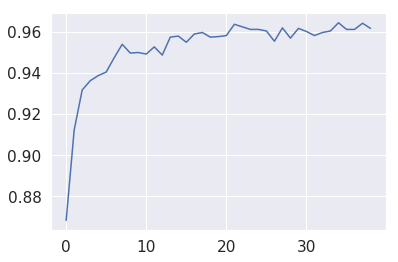

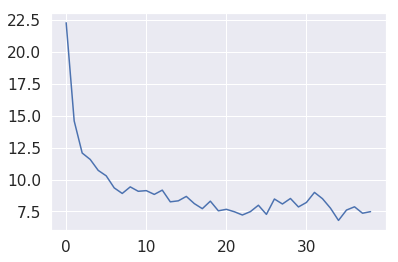

[1, 3, 3, 2, 3, 0, 3, 3, 1, 3, 2, 0, 1, 0, 0, 1, 0, 0, 0, 3, 3, 1, 1, 1, 3, 0, 0, 0, 2, 1, 3, 0, 3, 1, 3, 0, 0, 0, 0, 0, 3, 1, 1, 1, 3, 3, 1, 3, 1, 1, 1, 0, 1, 3, 1, 0, 3, 1, 3, 1, 1, 1, 2, 3, 1, 0, 3, 2, 0, 0, 3, 3, 3, 2, 2, 1, 0, 0, 0, 3, 2, 3, 1, 1, 0, 1, 2, 0, 0, 2, 0, 3, 1, 3, 0, 3, 0, 3, 0, 1, 0, 1, 3, 1, 1, 3, 0, 0, 1, 3, 3, 3, 0, 3, 1, 3, 0, 3, 3, 1, 1, 3, 0, 2, 2, 3, 1, 1, 3, 1, 0, 1, 1, 1, 3, 0, 3, 1, 1, 3, 3, 3, 0, 3, 1, 3, 0, 0, 0, 0, 3, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          910           38            9           43
C.f Soldier           25          974            1            0
C.d Soldier           17            1          975            7
R.f Soldier            3            7            2          988


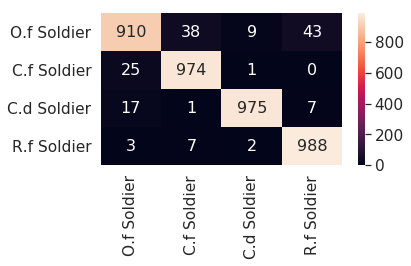


[40] accuracy: 0.963 loss: 7.109

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.498518167063594, 

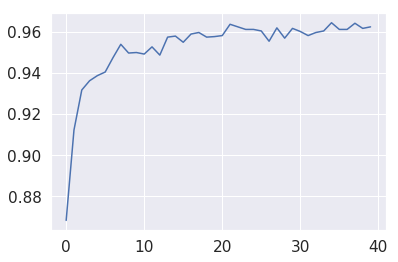

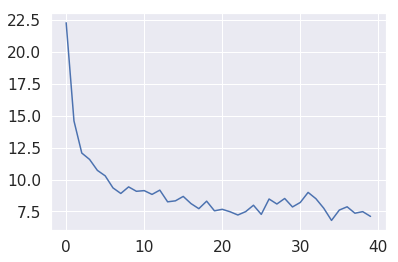

[2, 2, 0, 3, 1, 1, 1, 0, 2, 1, 3, 0, 3, 0, 3, 3, 0, 0, 3, 1, 0, 0, 1, 0, 3, 3, 3, 1, 1, 3, 1, 1, 0, 0, 3, 2, 3, 1, 3, 0, 0, 0, 0, 1, 0, 3, 3, 3, 0, 1, 1, 3, 0, 3, 3, 1, 1, 1, 2, 0, 3, 3, 0, 3, 3, 2, 3, 0, 3, 3, 0, 1, 0, 2, 1, 1, 2, 1, 3, 3, 0, 3, 1, 0, 0, 2, 1, 3, 1, 0, 0, 1, 1, 0, 1, 0, 2, 1, 0, 3, 1, 3, 1, 3, 1, 3, 3, 3, 1, 3, 0, 3, 1, 0, 1, 0, 3, 1, 3, 1, 1, 1, 2, 1, 1, 1, 1, 0, 2, 1, 3, 1, 1, 0, 1, 0, 2, 1, 0, 1, 3, 0, 1, 0, 2, 2, 0, 1, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          909           42           11           38
C.f Soldier           19          978            2            1
C.d Soldier           18            4          975            3
R.f Soldier            4            6            2          988


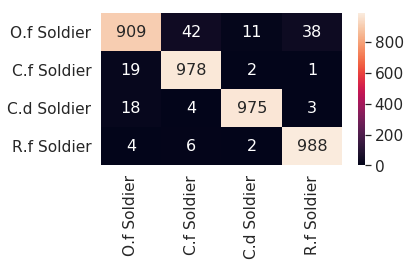


[41] accuracy: 0.964 loss: 7.499

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.4985181670

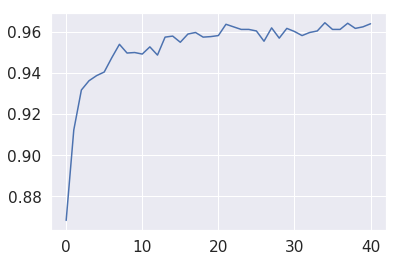

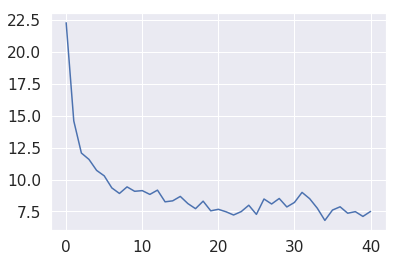

[3, 0, 1, 3, 3, 0, 2, 2, 1, 2, 1, 2, 1, 3, 3, 3, 0, 1, 3, 3, 3, 3, 3, 3, 0, 3, 0, 3, 0, 3, 2, 3, 3, 0, 1, 3, 0, 0, 0, 0, 1, 3, 1, 1, 3, 1, 1, 1, 3, 2, 1, 3, 1, 2, 0, 0, 3, 3, 1, 3, 0, 0, 1, 1, 0, 1, 0, 1, 1, 3, 1, 1, 1, 3, 3, 0, 1, 1, 1, 3, 3, 3, 2, 0, 0, 2, 1, 0, 1, 0, 3, 0, 0, 1, 3, 0, 1, 1, 3, 1, 0, 1, 3, 1, 2, 0, 0, 3, 1, 3, 1, 0, 0, 2, 0, 1, 2, 3, 1, 3, 0, 0, 0, 1, 0, 0, 3, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 0, 3, 3, 1, 2, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          911           41           12           36
C.f Soldier           22          978            0            0
C.d Soldier           15            1          978            6
R.f Soldier            3            6            2          989


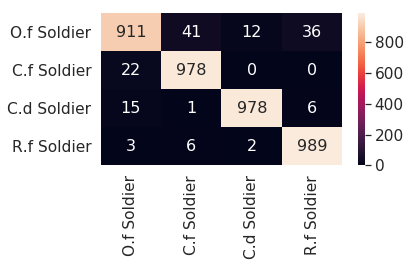


[42] accuracy: 0.963 loss: 7.566

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.991612117737532, 8.4

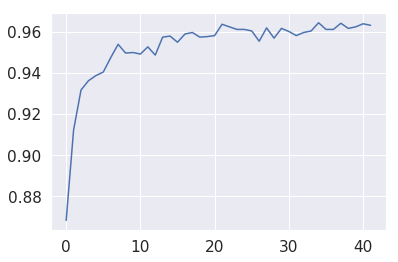

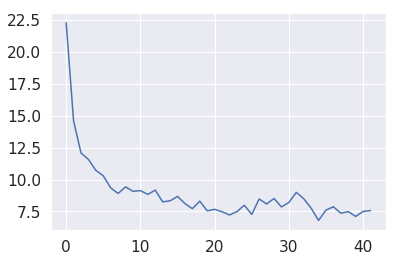

[1, 1, 3, 1, 3, 0, 0, 1, 0, 0, 3, 1, 2, 1, 0, 0, 1, 3, 0, 0, 1, 1, 2, 0, 0, 0, 1, 1, 1, 2, 0, 1, 0, 0, 1, 2, 2, 3, 1, 0, 3, 3, 3, 3, 3, 1, 3, 1, 0, 0, 1, 3, 1, 1, 0, 3, 3, 0, 1, 1, 3, 3, 0, 1, 0, 1, 1, 1, 3, 3, 3, 0, 0, 1, 3, 1, 2, 3, 2, 1, 0, 0, 0, 0, 0, 0, 3, 3, 3, 0, 1, 3, 1, 1, 1, 1, 0, 1, 3, 3, 1, 1, 0, 1, 3, 1, 0, 3, 1, 3, 0, 3, 3, 0, 1, 2, 3, 0, 0, 1, 0, 2, 0, 0, 0, 1, 3, 0, 1, 0, 1, 3, 2, 2, 0, 3, 1, 0, 1, 2, 1, 3, 1, 1, 3, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          914           42            8           36
C.f Soldier           25          975            0            0
C.d Soldier           17            1          980            2
R.f Soldier            5            7            4          984


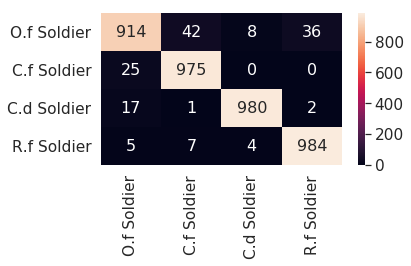


[43] accuracy: 0.961 loss: 7.561

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.99161211773

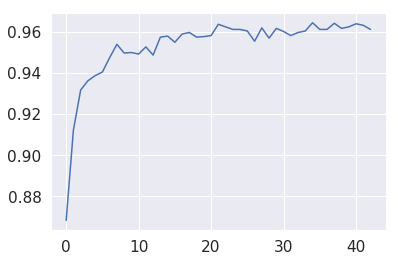

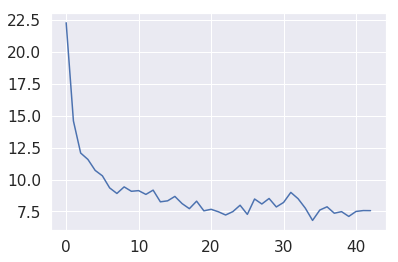

[1, 3, 3, 3, 3, 1, 1, 0, 0, 0, 3, 3, 1, 3, 1, 0, 1, 3, 3, 1, 3, 1, 3, 1, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 3, 0, 1, 0, 3, 1, 3, 0, 3, 0, 1, 0, 0, 2, 3, 1, 0, 0, 3, 1, 2, 3, 3, 3, 3, 3, 1, 2, 1, 3, 3, 1, 3, 0, 3, 0, 0, 1, 1, 1, 2, 1, 2, 1, 0, 0, 3, 0, 1, 3, 0, 1, 3, 3, 3, 1, 2, 3, 2, 1, 3, 0, 1, 0, 1, 1, 1, 0, 0, 3, 0, 3, 1, 3, 2, 0, 0, 3, 0, 1, 1, 1, 3, 3, 3, 1, 3, 0, 1, 1, 0, 0, 1, 0, 0, 1, 3, 3, 1, 1, 3, 3, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          902           49            5           44
C.f Soldier           24          974            1            1
C.d Soldier           16            2          980            2
R.f Soldier            3            6            2          989


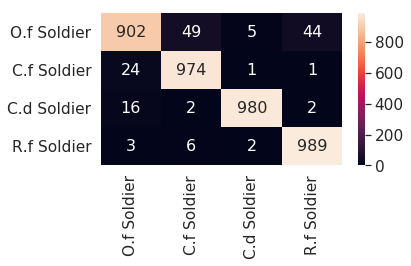


[44] accuracy: 0.963 loss: 7.096

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597738, 8.99

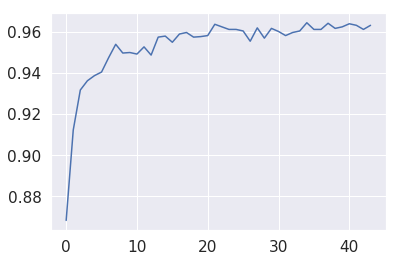

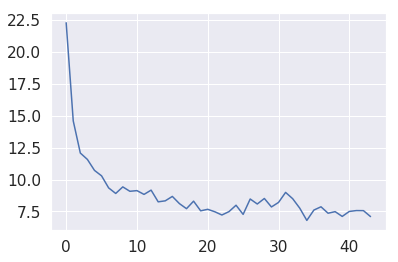

[1, 2, 0, 3, 3, 1, 3, 1, 1, 1, 0, 3, 3, 3, 0, 1, 0, 1, 0, 1, 3, 2, 1, 3, 0, 2, 1, 3, 1, 3, 1, 3, 0, 0, 0, 0, 1, 3, 0, 0, 1, 1, 3, 2, 0, 3, 3, 3, 0, 1, 3, 3, 1, 1, 1, 0, 1, 0, 1, 3, 0, 0, 1, 0, 1, 3, 1, 0, 1, 3, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 3, 1, 1, 3, 1, 3, 3, 3, 3, 0, 3, 3, 3, 1, 3, 1, 0, 2, 3, 1, 1, 3, 1, 0, 3, 1, 0, 1, 0, 3, 3, 0, 3, 0, 1, 1, 0, 3, 1, 0, 3, 3, 1, 0, 3, 3, 1, 0, 3, 3, 1, 0, 2, 3, 3, 1, 2, 3, 0, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          909           43            4           44
C.f Soldier           19          979            1            1
C.d Soldier           14            2          982            2
R.f Soldier            6            9            2          983


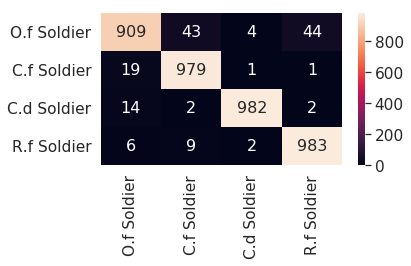


[45] accuracy: 0.963 loss: 7.699

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204450901597

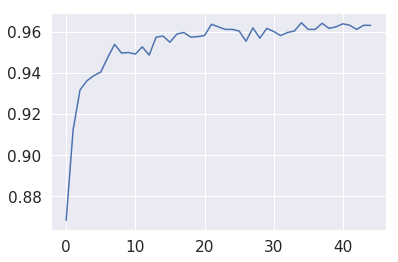

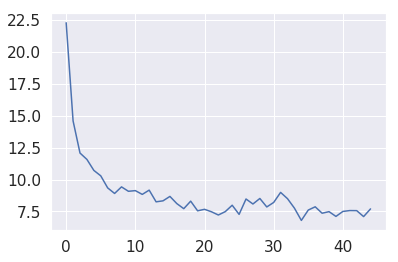

[1, 0, 3, 0, 1, 1, 3, 3, 2, 1, 0, 3, 3, 0, 0, 1, 0, 3, 0, 0, 3, 0, 1, 1, 0, 3, 0, 0, 3, 2, 1, 3, 0, 3, 3, 0, 1, 0, 1, 3, 1, 3, 1, 3, 0, 0, 1, 3, 3, 0, 3, 1, 3, 1, 1, 2, 3, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 3, 0, 1, 0, 3, 3, 3, 0, 0, 3, 3, 0, 0, 2, 1, 0, 0, 1, 0, 3, 1, 2, 0, 2, 1, 1, 3, 3, 1, 0, 0, 1, 2, 3, 0, 3, 2, 1, 1, 1, 3, 0, 3, 3, 0, 2, 0, 1, 3, 0, 3, 3, 1, 3, 1, 1, 1, 3, 1, 1, 0, 3, 0, 3, 1, 1, 1, 1, 3, 0, 1, 1, 1, 0, 1, 0, 1, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          915           41            4           40
C.f Soldier           20          978            2            0
C.d Soldier           22            2          973            3
R.f Soldier            2            8            3          987


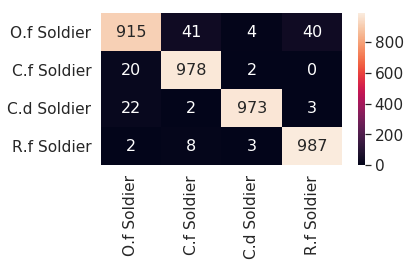


[46] accuracy: 0.966 loss: 7.109

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.85102778673172, 8.204

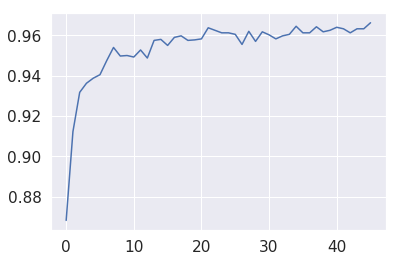

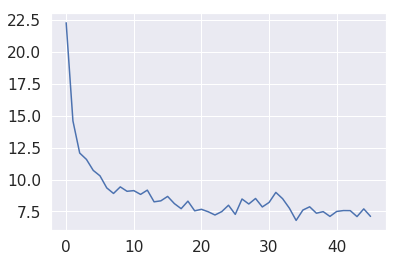

[3, 3, 1, 3, 3, 1, 1, 1, 0, 0, 0, 1, 1, 3, 0, 3, 1, 0, 1, 0, 3, 1, 0, 0, 1, 3, 0, 1, 1, 2, 1, 2, 0, 2, 1, 1, 0, 0, 3, 3, 1, 3, 0, 1, 1, 0, 3, 3, 3, 3, 0, 0, 0, 3, 1, 1, 1, 1, 0, 1, 1, 1, 3, 1, 1, 1, 1, 3, 0, 1, 3, 0, 2, 3, 0, 3, 0, 1, 0, 0, 1, 3, 3, 3, 3, 0, 3, 2, 0, 2, 1, 3, 0, 1, 3, 1, 2, 0, 1, 1, 1, 1, 0, 3, 1, 3, 0, 3, 1, 3, 3, 3, 1, 3, 3, 3, 1, 3, 1, 1, 3, 0, 0, 0, 3, 1, 3, 1, 1, 1, 1, 0, 1, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           43            5           36
C.f Soldier           20          979            0            1
C.d Soldier           13            4          979            4
R.f Soldier            1            6            2          991


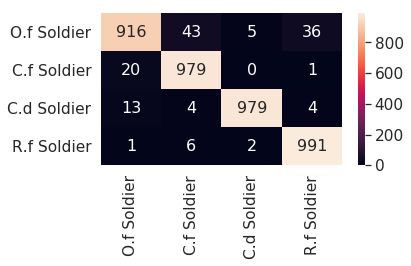


[47] accuracy: 0.965 loss: 7.330

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.851027786731

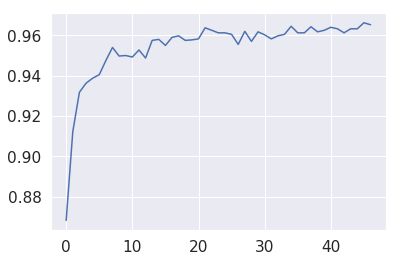

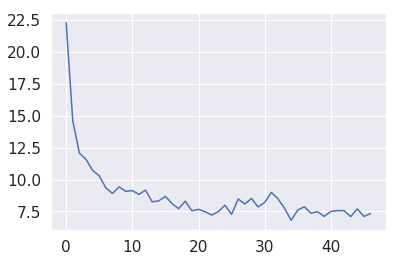

[2, 0, 1, 3, 1, 1, 2, 0, 3, 3, 3, 0, 3, 0, 2, 3, 1, 0, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 3, 3, 0, 3, 1, 3, 2, 1, 3, 1, 1, 2, 1, 1, 3, 3, 3, 2, 0, 3, 0, 3, 1, 0, 0, 3, 3, 3, 0, 3, 0, 0, 0, 1, 1, 1, 1, 0, 3, 3, 2, 0, 3, 1, 1, 3, 3, 3, 3, 3, 3, 0, 3, 1, 0, 3, 1, 0, 3, 0, 0, 0, 0, 0, 1, 1, 1, 3, 0, 0, 3, 3, 0, 1, 0, 1, 1, 3, 1, 0, 1, 1, 0, 0, 0, 2, 0, 2, 1, 1, 0, 3, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 2, 0, 0, 0, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          918           39            6           37
C.f Soldier           24          975            1            0
C.d Soldier           20            3          975            2
R.f Soldier            1            3            3          993


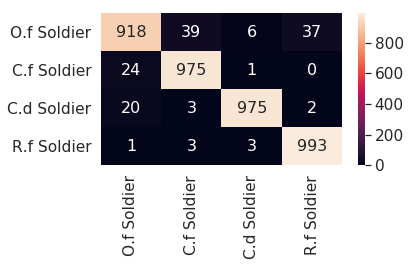


[48] accuracy: 0.965 loss: 7.406

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902424067259, 7.851

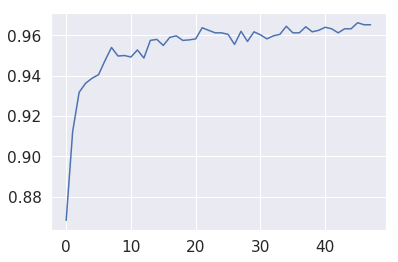

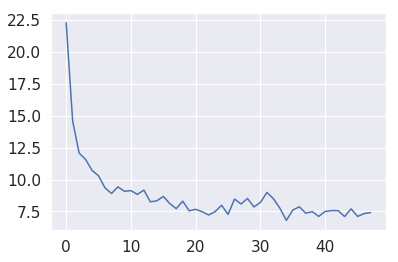

[2, 3, 3, 3, 3, 0, 1, 1, 0, 0, 0, 3, 1, 3, 0, 0, 0, 3, 3, 1, 0, 1, 0, 0, 3, 2, 3, 1, 3, 1, 0, 0, 1, 3, 3, 1, 3, 0, 1, 0, 3, 2, 3, 3, 0, 3, 3, 3, 2, 2, 0, 3, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 3, 0, 0, 1, 0, 3, 1, 1, 1, 3, 0, 1, 1, 1, 1, 1, 3, 2, 3, 1, 0, 1, 3, 3, 2, 0, 1, 1, 1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 0, 3, 3, 0, 1, 1, 0, 1, 2, 3, 2, 1, 0, 3, 3, 1, 1, 3, 3, 1, 3, 1, 3, 3, 1, 0, 0, 0, 0, 3, 2, 0, 1, 0, 1, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          911           42            7           40
C.f Soldier           18          981            1            0
C.d Soldier           18            1          979            2
R.f Soldier            2            6            2          990


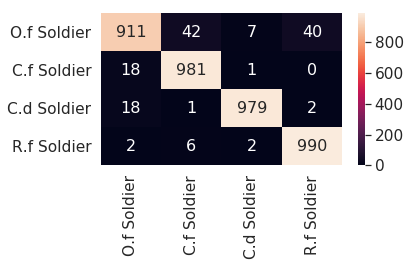


[49] accuracy: 0.963 loss: 7.728

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.5149024240672

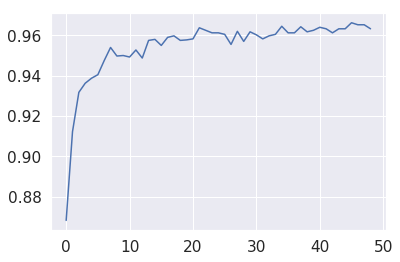

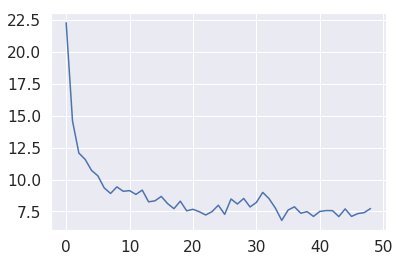

[0, 3, 0, 0, 3, 3, 3, 0, 1, 1, 0, 0, 3, 0, 2, 0, 1, 1, 0, 3, 1, 0, 1, 3, 3, 1, 1, 1, 3, 1, 3, 3, 0, 1, 3, 1, 3, 2, 1, 1, 2, 0, 1, 0, 0, 1, 2, 1, 0, 0, 3, 1, 3, 3, 1, 1, 1, 1, 0, 3, 0, 3, 0, 0, 0, 2, 3, 3, 3, 1, 3, 0, 3, 0, 0, 3, 0, 2, 0, 0, 3, 0, 3, 2, 3, 1, 1, 3, 2, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 3, 1, 2, 1, 0, 3, 1, 2, 3, 1, 3, 0, 3, 3, 1, 1, 0, 3, 0, 1, 2, 1, 0, 0, 3, 1, 0, 3, 1, 1, 0, 3, 0, 0, 3, 3, 1, 3, 1, 3, 1, 1, 2, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          915           36            9           40
C.f Soldier           24          974            1            1
C.d Soldier           18            2          979            1
R.f Soldier            3            9            3          985


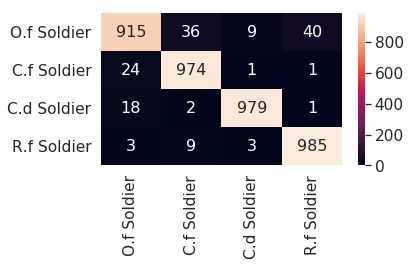


[50] accuracy: 0.964 loss: 7.277

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526, 8.514902

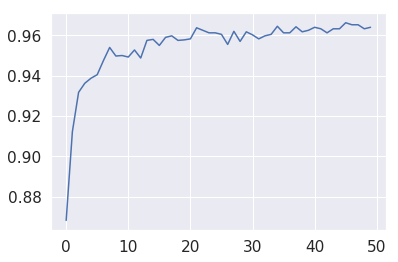

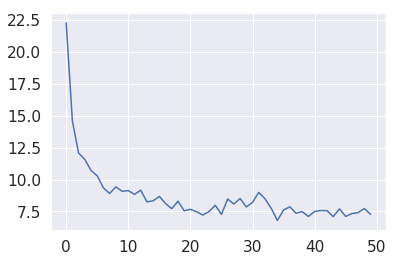

[3, 3, 3, 0, 0, 1, 3, 1, 0, 2, 3, 3, 3, 0, 1, 0, 0, 2, 0, 3, 0, 1, 1, 3, 0, 3, 0, 1, 1, 1, 0, 1, 3, 2, 3, 3, 1, 0, 1, 0, 3, 1, 3, 3, 0, 3, 3, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 2, 3, 3, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 2, 3, 1, 2, 3, 0, 0, 1, 1, 2, 2, 1, 0, 1, 0, 3, 1, 1, 0, 3, 1, 3, 0, 0, 1, 1, 1, 0, 3, 0, 0, 0, 0, 3, 1, 1, 0, 1, 1, 3, 0, 3, 0, 3, 3, 3, 0, 3, 1, 1, 0, 1, 0, 3, 3, 1, 1, 2, 0, 2, 2, 2, 3, 1, 1, 3, 1, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           43            8           36
C.f Soldier           21          977            2            0
C.d Soldier           19            2          977            2
R.f Soldier            3            6            2          989


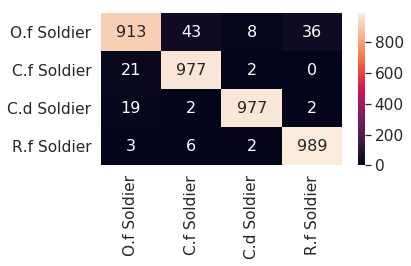


[51] accuracy: 0.965 loss: 7.380

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452415526,

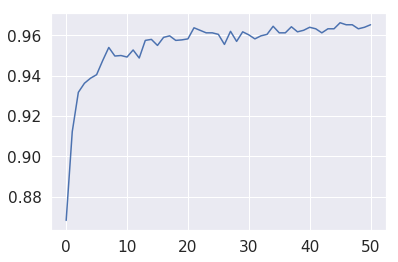

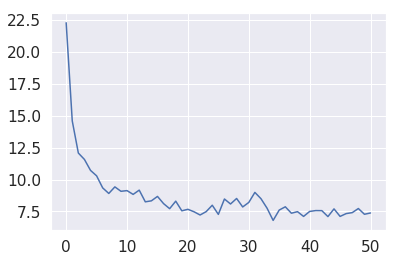

[0, 1, 3, 1, 0, 1, 3, 3, 3, 0, 1, 1, 1, 0, 0, 0, 3, 0, 3, 1, 1, 3, 1, 0, 1, 3, 1, 1, 3, 2, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 3, 0, 0, 0, 1, 2, 0, 3, 3, 1, 3, 3, 1, 1, 0, 1, 1, 0, 3, 3, 0, 1, 1, 0, 3, 0, 2, 1, 3, 0, 1, 1, 0, 3, 1, 3, 3, 3, 3, 0, 1, 1, 1, 3, 0, 1, 0, 0, 1, 0, 0, 0, 3, 0, 1, 1, 0, 1, 3, 0, 1, 0, 0, 1, 1, 3, 2, 1, 1, 0, 3, 1, 2, 1, 0, 0, 3, 3, 1, 1, 1, 1, 1, 1, 1, 3, 0, 2, 3, 2, 2, 3, 0, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          920           44            4           32
C.f Soldier           23          976            1            0
C.d Soldier           20            2          977            1
R.f Soldier            4            5            3          988


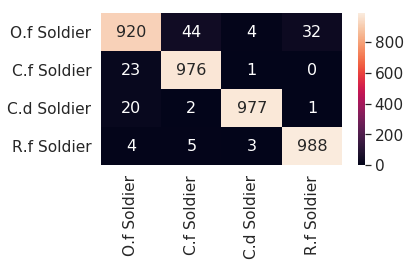


[52] accuracy: 0.963 loss: 7.858

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8.08247452

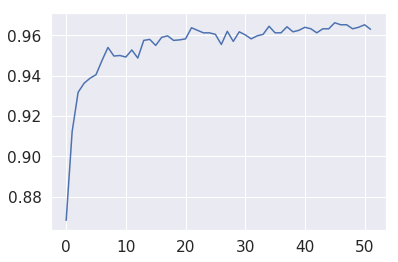

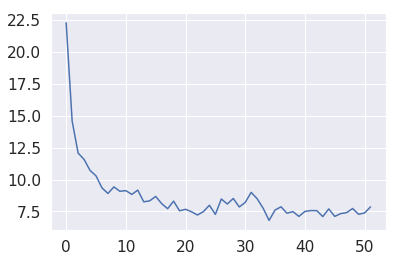

[0, 1, 2, 0, 1, 3, 0, 2, 1, 1, 0, 1, 1, 1, 3, 0, 1, 1, 1, 3, 3, 1, 3, 3, 3, 0, 0, 0, 3, 3, 0, 0, 3, 3, 3, 1, 0, 1, 2, 0, 0, 0, 1, 0, 0, 1, 1, 2, 2, 0, 1, 3, 1, 3, 1, 1, 0, 0, 0, 2, 1, 1, 0, 0, 3, 3, 1, 2, 0, 1, 0, 2, 0, 0, 1, 0, 0, 3, 3, 1, 0, 1, 0, 0, 3, 1, 0, 3, 3, 0, 3, 1, 1, 3, 1, 1, 1, 3, 3, 1, 3, 3, 1, 2, 0, 0, 3, 3, 3, 3, 0, 3, 0, 3, 2, 0, 0, 1, 3, 1, 0, 1, 3, 1, 2, 1, 1, 0, 0, 1, 0, 1, 1, 0, 3, 0, 0, 0, 3, 1, 3, 3, 1, 1, 0, 3, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          918           40            7           35
C.f Soldier           29          970            1            0
C.d Soldier           16            2          977            5
R.f Soldier            5            5            3          987


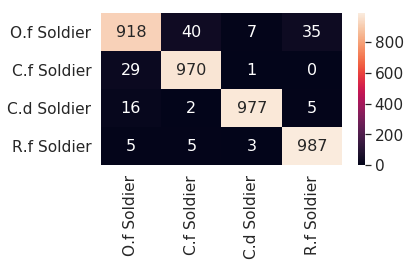


[53] accuracy: 0.966 loss: 7.330

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.474162332713604, 8

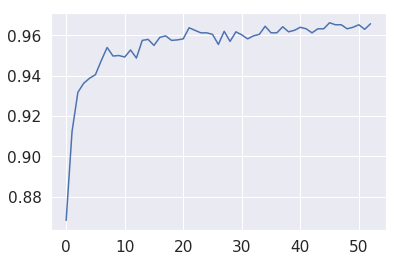

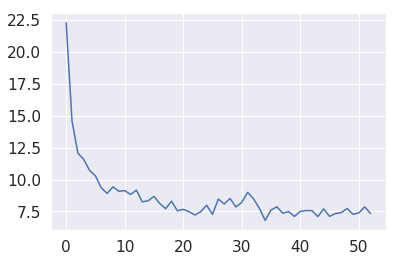

[1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 3, 3, 0, 1, 3, 1, 0, 1, 2, 3, 1, 2, 0, 1, 1, 3, 0, 1, 0, 3, 3, 0, 3, 1, 0, 1, 2, 0, 3, 0, 3, 1, 3, 1, 0, 1, 3, 1, 1, 3, 0, 1, 1, 1, 3, 2, 1, 1, 0, 2, 3, 0, 3, 1, 0, 1, 3, 0, 3, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 3, 2, 0, 2, 2, 1, 1, 3, 3, 0, 1, 1, 0, 1, 3, 0, 0, 1, 1, 1, 0, 3, 0, 2, 0, 0, 3, 0, 1, 1, 1, 1, 0, 0, 1, 3, 0, 3, 1, 0, 2, 3, 0, 0, 1, 3, 3, 1, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          917           48            8           27
C.f Soldier           23          976            1            0
C.d Soldier           15            1          982            2
R.f Soldier            3            7            2          988


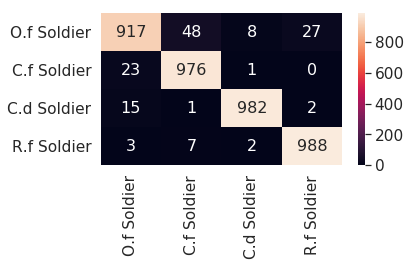


[54] accuracy: 0.963 loss: 7.748

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.47416233271

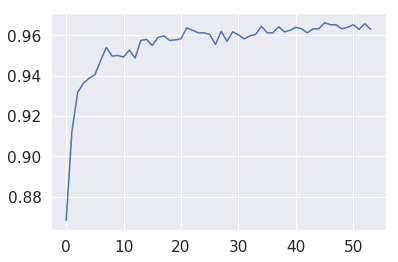

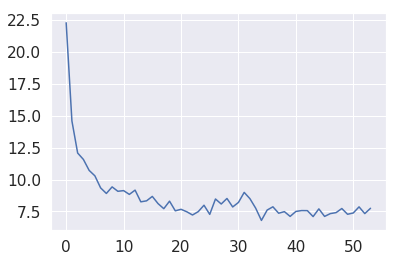

[1, 3, 0, 0, 1, 1, 3, 1, 0, 2, 3, 1, 1, 3, 3, 3, 3, 3, 1, 0, 0, 1, 0, 3, 0, 1, 0, 1, 0, 1, 1, 3, 3, 1, 1, 0, 0, 3, 3, 1, 0, 0, 1, 1, 3, 1, 3, 0, 0, 1, 1, 2, 0, 0, 0, 3, 3, 3, 3, 0, 3, 0, 0, 1, 1, 3, 3, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 3, 3, 1, 3, 1, 0, 2, 0, 0, 1, 3, 0, 3, 3, 1, 1, 0, 2, 0, 1, 3, 0, 0, 3, 3, 3, 1, 1, 0, 1, 1, 3, 0, 1, 1, 1, 1, 0, 2, 1, 2, 3, 0, 0, 0, 1, 1, 3, 0, 0, 3, 3, 1, 2, 2, 1, 1, 3, 0, 1, 1, 1, 1, 2, 3, 2, 3, 0, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          912           42            8           38
C.f Soldier           21          978            1            0
C.d Soldier           20            3          975            2
R.f Soldier            4            7            2          987


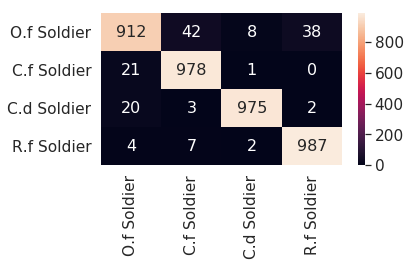


[55] accuracy: 0.964 loss: 7.859

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134381, 8.47

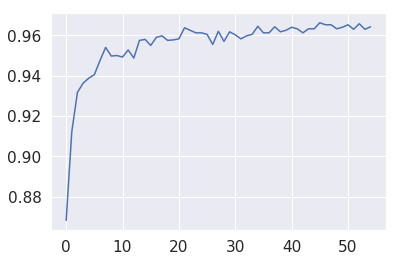

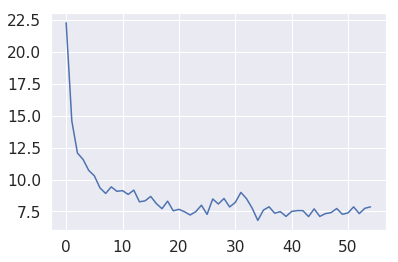

[0, 1, 3, 0, 0, 1, 3, 1, 1, 1, 0, 0, 3, 2, 0, 2, 0, 3, 1, 1, 1, 0, 3, 0, 3, 0, 0, 1, 3, 0, 3, 1, 3, 0, 1, 3, 3, 3, 3, 0, 3, 1, 2, 0, 0, 1, 3, 3, 3, 0, 1, 3, 0, 1, 2, 3, 1, 1, 1, 1, 0, 1, 1, 0, 1, 3, 3, 3, 0, 0, 0, 1, 1, 3, 0, 3, 3, 0, 3, 0, 1, 1, 0, 0, 3, 1, 3, 1, 0, 1, 2, 1, 1, 1, 3, 2, 0, 0, 1, 3, 0, 1, 0, 2, 2, 1, 1, 1, 1, 3, 0, 0, 2, 1, 1, 0, 1, 1, 3, 2, 3, 1, 0, 3, 3, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 2, 1, 0, 0, 3, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          920           40            8           32
C.f Soldier           24          974            1            1
C.d Soldier           17            3          977            3
R.f Soldier            4            8            2          986


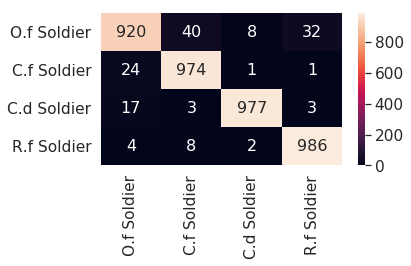


[56] accuracy: 0.964 loss: 7.862

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.268894391134

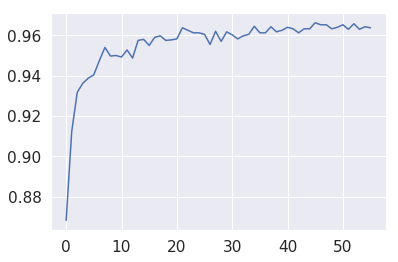

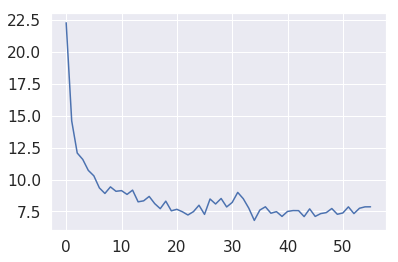

[1, 3, 3, 2, 0, 0, 0, 3, 3, 1, 1, 1, 0, 1, 0, 1, 1, 1, 3, 3, 0, 3, 3, 3, 1, 1, 1, 1, 3, 0, 3, 3, 0, 0, 1, 2, 0, 3, 3, 0, 1, 0, 0, 3, 1, 0, 1, 1, 1, 3, 3, 0, 1, 1, 0, 2, 3, 1, 3, 0, 3, 3, 0, 3, 0, 1, 1, 1, 1, 1, 2, 1, 3, 2, 0, 3, 3, 1, 3, 3, 3, 2, 0, 3, 1, 3, 0, 0, 2, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 2, 0, 1, 2, 3, 0, 3, 3, 3, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 3, 1, 0, 0, 1, 3, 2, 3, 3, 0, 1, 3, 0, 3, 3, 1, 0, 0, 1, 3, 1, 0, 1, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          909           44            7           40
C.f Soldier           25          973            1            1
C.d Soldier           10            3          985            2
R.f Soldier            3            7            2          988


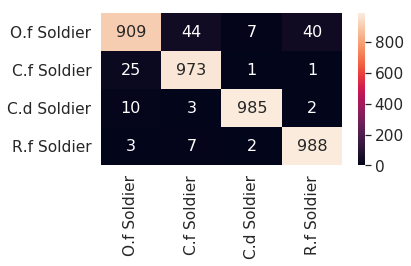


[57] accuracy: 0.965 loss: 7.075

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132, 7.26889

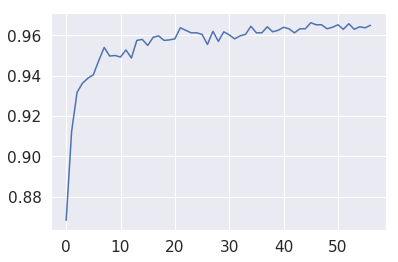

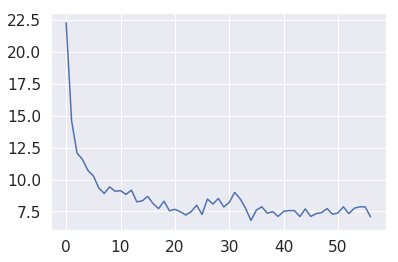

[1, 1, 1, 3, 1, 0, 0, 2, 3, 3, 3, 0, 1, 1, 3, 3, 3, 3, 3, 3, 1, 3, 3, 1, 0, 3, 1, 0, 0, 2, 0, 0, 0, 0, 0, 2, 1, 2, 2, 2, 3, 1, 1, 1, 0, 0, 0, 1, 0, 0, 2, 3, 3, 3, 3, 3, 1, 0, 0, 0, 1, 0, 3, 1, 3, 0, 0, 1, 0, 3, 3, 2, 1, 3, 0, 0, 1, 2, 3, 1, 3, 3, 1, 1, 1, 1, 3, 3, 3, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 3, 2, 2, 0, 0, 3, 3, 1, 3, 1, 3, 1, 0, 0, 0, 0, 1, 1, 1, 1, 3, 0, 0, 3, 3, 0, 3, 0, 1, 1, 3, 1, 1, 0, 1, 2, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          919           33            9           39
C.f Soldier           22          977            1            0
C.d Soldier           18            4          976            2
R.f Soldier            5            5            2          988


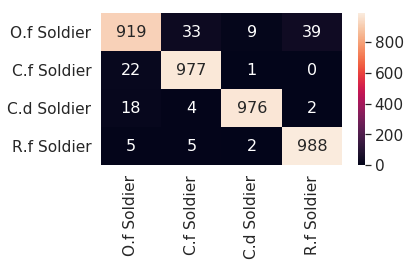


[58] accuracy: 0.963 loss: 7.626

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.98566585034132,

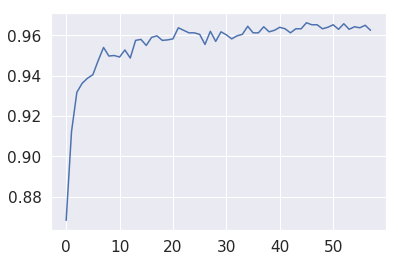

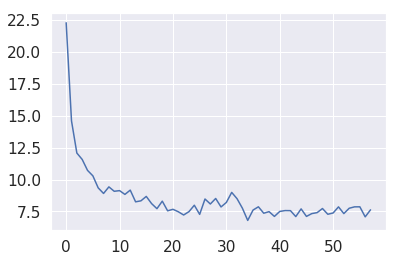

[3, 1, 2, 0, 1, 0, 1, 0, 0, 0, 3, 3, 0, 1, 0, 3, 1, 0, 1, 3, 3, 0, 0, 1, 0, 3, 3, 3, 3, 0, 3, 0, 3, 3, 1, 0, 1, 1, 1, 0, 0, 3, 1, 1, 1, 1, 1, 1, 0, 1, 3, 3, 3, 0, 0, 1, 3, 0, 1, 3, 2, 0, 0, 3, 3, 3, 0, 1, 3, 1, 0, 3, 3, 1, 3, 1, 1, 1, 3, 3, 1, 0, 1, 0, 0, 3, 0, 0, 1, 1, 3, 0, 0, 0, 1, 3, 0, 1, 3, 1, 3, 3, 1, 3, 0, 0, 3, 3, 1, 1, 0, 0, 3, 1, 2, 1, 0, 1, 1, 0, 1, 0, 2, 0, 3, 3, 3, 2, 3, 1, 1, 0, 1, 1, 3, 1, 0, 1, 1, 1, 3, 1, 3, 1, 1, 3, 0, 0, 1, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           43            2           42
C.f Soldier           22          975            1            2
C.d Soldier           22            1          974            3
R.f Soldier            1            9            2          988


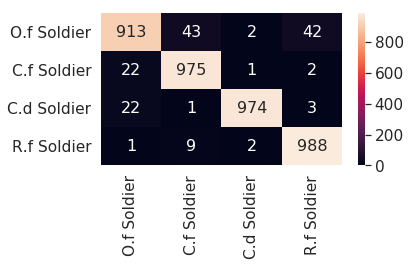


[59] accuracy: 0.965 loss: 6.770

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.9856658

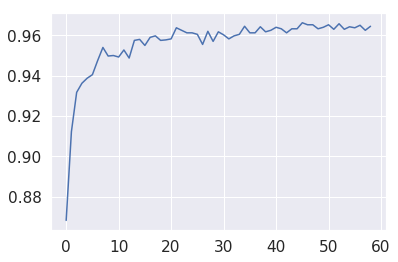

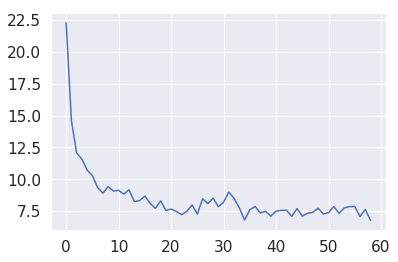

[1, 3, 1, 3, 1, 0, 1, 2, 3, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 3, 1, 3, 3, 0, 1, 3, 0, 1, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 3, 0, 3, 0, 3, 0, 3, 3, 1, 1, 3, 1, 0, 0, 0, 3, 2, 1, 3, 3, 1, 3, 3, 1, 0, 0, 3, 0, 3, 3, 1, 1, 3, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 3, 1, 0, 0, 1, 3, 3, 0, 0, 1, 0, 0, 1, 3, 3, 3, 0, 2, 1, 1, 0, 3, 1, 0, 0, 2, 1, 0, 0, 0, 3, 1, 3, 1, 1, 3, 1, 1, 3, 1, 0, 1, 0, 1, 0, 3, 0, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           43            2           39
C.f Soldier           26          973            1            0
C.d Soldier           16            2          979            3
R.f Soldier            3            5            2          990


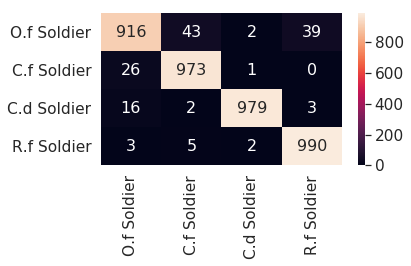


[60] accuracy: 0.964 loss: 7.514

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.484263692051172, 7.

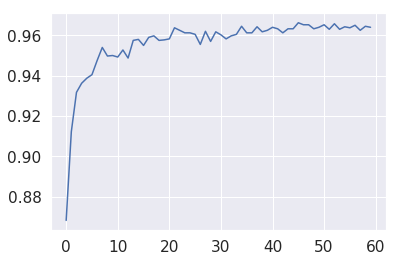

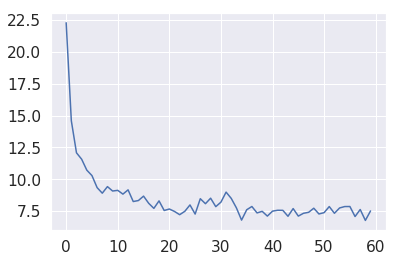

[2, 1, 0, 1, 0, 0, 0, 3, 1, 1, 1, 0, 1, 1, 0, 3, 0, 0, 1, 0, 0, 3, 1, 0, 3, 1, 1, 0, 1, 0, 1, 1, 2, 3, 1, 1, 3, 0, 1, 1, 0, 1, 1, 3, 3, 3, 1, 0, 3, 2, 1, 1, 2, 3, 1, 0, 0, 2, 3, 0, 1, 0, 2, 1, 0, 0, 0, 2, 0, 0, 1, 3, 0, 3, 0, 3, 0, 0, 1, 3, 3, 1, 1, 0, 0, 3, 1, 2, 2, 3, 1, 1, 1, 3, 1, 0, 0, 0, 2, 2, 3, 3, 0, 0, 1, 2, 0, 0, 2, 3, 0, 0, 3, 0, 3, 0, 0, 2, 0, 3, 1, 2, 0, 0, 1, 2, 1, 1, 0, 1, 3, 3, 3, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          922           38           13           27
C.f Soldier           30          969            1            0
C.d Soldier           15            2          981            2
R.f Soldier            9            5            2          984


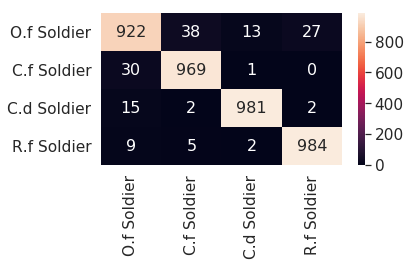


[61] accuracy: 0.958 loss: 8.249

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.4842636920

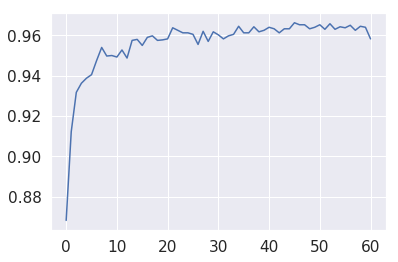

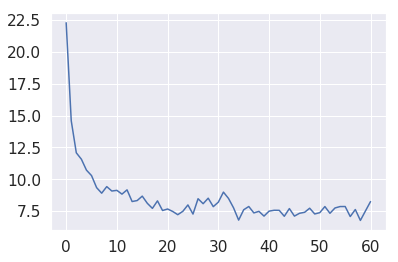

[0, 0, 0, 1, 1, 0, 1, 2, 0, 1, 2, 1, 3, 0, 1, 0, 1, 3, 3, 1, 1, 0, 0, 3, 3, 1, 2, 0, 3, 1, 1, 0, 0, 0, 3, 0, 3, 1, 0, 0, 3, 0, 3, 1, 3, 3, 1, 1, 0, 0, 1, 0, 2, 1, 0, 2, 1, 0, 3, 3, 0, 1, 3, 0, 1, 0, 0, 0, 2, 1, 1, 3, 3, 3, 3, 3, 3, 2, 0, 0, 1, 1, 0, 0, 1, 3, 0, 3, 0, 3, 1, 0, 3, 1, 1, 1, 3, 1, 1, 3, 1, 3, 3, 3, 3, 1, 0, 0, 1, 1, 0, 3, 3, 0, 1, 3, 2, 1, 2, 0, 3, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 3, 1, 0, 0, 0, 0, 1, 2, 3, 3, 1, 1, 3, 3, 3, 0, 0, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          910           44            8           38
C.f Soldier           34          964            1            1
C.d Soldier           24            4          969            3
R.f Soldier            2            6            2          990


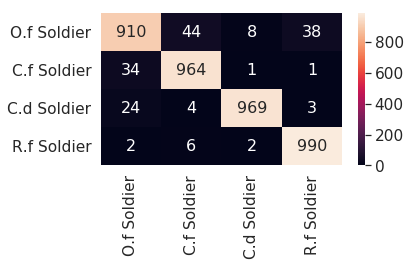


[62] accuracy: 0.964 loss: 7.313

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.219852807000279, 7.4

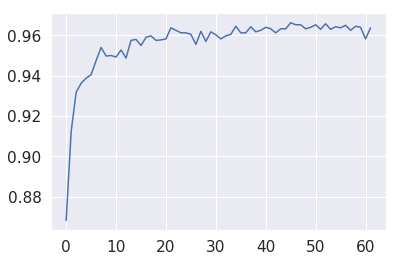

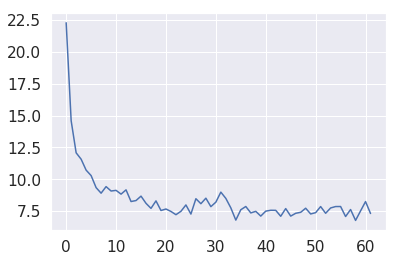

[0, 2, 3, 3, 1, 1, 3, 0, 1, 3, 0, 3, 1, 0, 0, 2, 3, 3, 0, 0, 1, 0, 1, 0, 1, 0, 1, 3, 1, 3, 1, 3, 0, 0, 1, 0, 3, 1, 1, 0, 3, 0, 1, 3, 3, 1, 2, 0, 3, 1, 1, 3, 1, 3, 3, 0, 0, 3, 1, 3, 1, 1, 1, 1, 2, 3, 3, 3, 3, 2, 0, 0, 2, 0, 3, 2, 0, 3, 3, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 3, 3, 3, 0, 1, 0, 1, 0, 0, 3, 3, 3, 3, 0, 0, 3, 1, 0, 1, 3, 0, 1, 0, 1, 0, 0, 0, 3, 1, 0, 0, 1, 1, 0, 0, 3, 0, 0, 1, 1, 3, 0, 0, 1, 2, 3, 2, 3, 3, 2, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           36            7           41
C.f Soldier           24          975            1            0
C.d Soldier           19            3          977            1
R.f Soldier            6            5            2          987


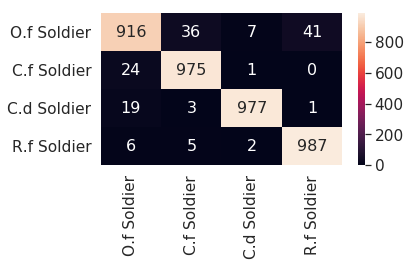


[63] accuracy: 0.963 loss: 7.549

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.21985280700

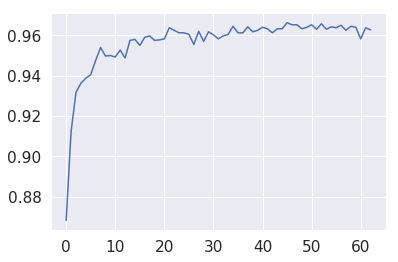

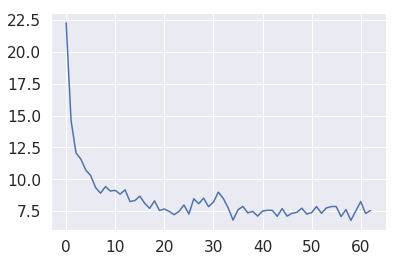

[1, 1, 1, 1, 1, 2, 0, 0, 3, 2, 3, 0, 1, 0, 2, 1, 0, 0, 0, 1, 0, 1, 3, 3, 3, 1, 1, 0, 0, 0, 3, 1, 1, 0, 1, 1, 1, 0, 1, 3, 0, 1, 1, 0, 1, 0, 2, 1, 1, 3, 1, 1, 3, 3, 3, 1, 1, 0, 1, 1, 3, 3, 1, 3, 0, 3, 0, 2, 1, 1, 1, 1, 3, 1, 0, 3, 3, 0, 2, 1, 1, 3, 0, 0, 3, 3, 0, 3, 0, 0, 1, 3, 3, 1, 0, 3, 1, 2, 3, 3, 3, 1, 0, 2, 3, 1, 0, 1, 1, 1, 3, 1, 1, 3, 3, 0, 1, 0, 3, 0, 0, 0, 1, 2, 3, 3, 1, 0, 1, 0, 0, 1, 1, 2, 0, 3, 0, 2, 0, 3, 1, 1, 1, 0, 1, 0, 2, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           49            7           37
C.f Soldier           21          978            1            0
C.d Soldier           17            2          979            2
R.f Soldier            4            5            4          987


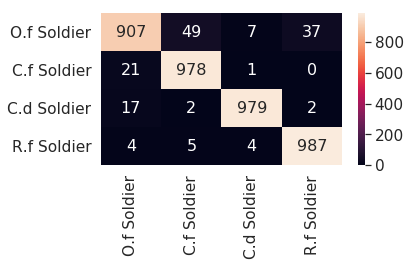


[64] accuracy: 0.963 loss: 7.747

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712693, 7.21

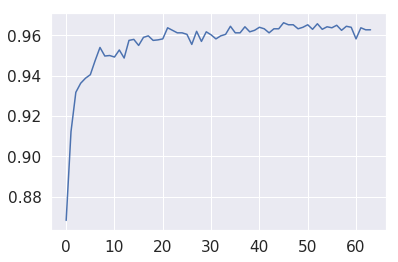

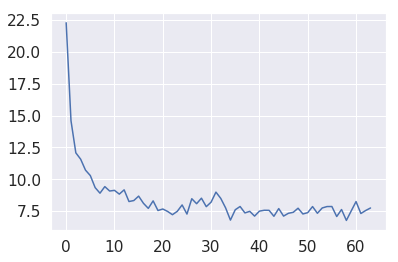

[3, 3, 1, 1, 3, 1, 3, 0, 0, 1, 1, 3, 0, 2, 3, 0, 0, 1, 3, 3, 0, 0, 2, 0, 1, 3, 0, 3, 0, 1, 1, 1, 1, 3, 1, 0, 3, 0, 3, 2, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 2, 3, 0, 1, 0, 1, 1, 3, 2, 0, 3, 1, 1, 1, 0, 0, 3, 0, 1, 1, 1, 3, 2, 3, 3, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 3, 1, 1, 3, 1, 1, 3, 0, 3, 3, 3, 3, 1, 1, 3, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 3, 1, 0, 1, 1, 2, 3, 0, 0, 0, 3, 1, 3, 1, 1, 1, 3, 3, 1, 2, 0, 1, 3, 0, 1, 3, 3, 3, 0, 1, 1, 0, 0, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          912           46            4           38
C.f Soldier           20          979            1            0
C.d Soldier           22            4          973            1
R.f Soldier            4            6            3          987


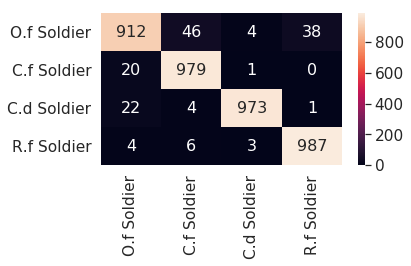


[65] accuracy: 0.964 loss: 7.470

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.473974162712

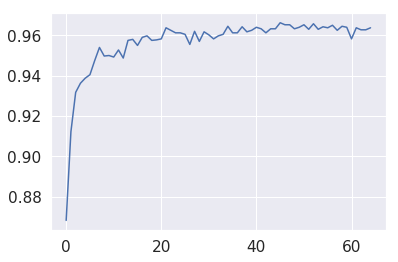

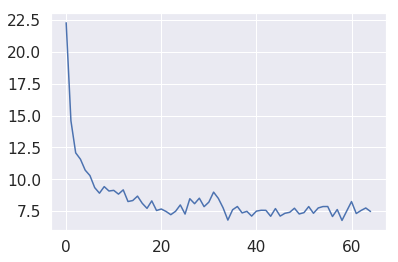

[0, 3, 1, 1, 1, 0, 0, 1, 3, 0, 2, 1, 2, 0, 1, 0, 2, 3, 1, 0, 2, 3, 1, 3, 1, 3, 1, 0, 3, 0, 3, 3, 0, 1, 0, 1, 3, 0, 1, 2, 3, 1, 3, 1, 3, 0, 0, 1, 3, 2, 0, 0, 1, 3, 3, 2, 2, 0, 1, 2, 0, 3, 3, 0, 1, 1, 3, 3, 1, 1, 0, 2, 0, 1, 3, 0, 3, 2, 3, 0, 1, 2, 0, 3, 1, 1, 1, 0, 3, 1, 1, 3, 1, 1, 2, 0, 1, 3, 0, 1, 0, 0, 0, 3, 2, 1, 1, 3, 3, 0, 3, 0, 3, 3, 3, 1, 1, 2, 0, 2, 3, 1, 3, 1, 2, 1, 3, 0, 0, 0, 1, 3, 0, 0, 1, 0, 1, 1, 0, 0, 2, 0, 1, 1, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          906           42           15           37
C.f Soldier           23          976            1            0
C.d Soldier           19            1          978            2
R.f Soldier            0            3            2          995


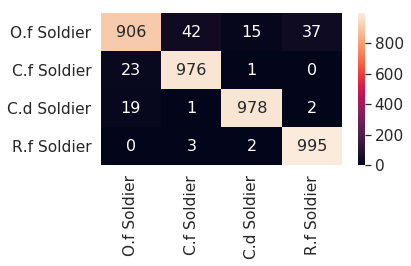


[66] accuracy: 0.967 loss: 7.796

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.665843622758985, 7.4739

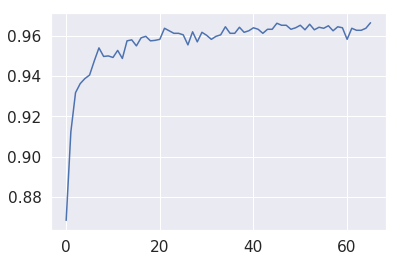

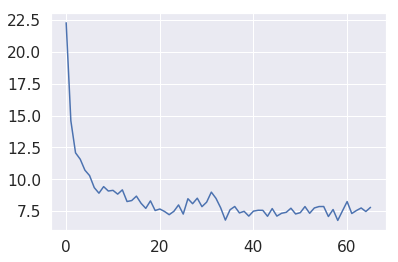

[0, 1, 0, 0, 1, 3, 3, 3, 0, 1, 1, 3, 1, 2, 0, 0, 0, 3, 0, 3, 0, 3, 0, 3, 3, 0, 0, 3, 0, 3, 0, 3, 3, 3, 1, 3, 1, 0, 0, 0, 0, 1, 1, 3, 3, 1, 1, 0, 0, 3, 3, 3, 2, 1, 2, 2, 1, 0, 0, 3, 3, 1, 0, 3, 1, 1, 1, 1, 3, 3, 3, 1, 2, 1, 0, 1, 1, 3, 0, 0, 1, 1, 1, 3, 0, 1, 3, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 3, 3, 3, 3, 3, 0, 1, 3, 1, 2, 1, 3, 0, 1, 1, 1, 3, 3, 0, 1, 0, 0, 2, 0, 3, 1, 3, 3, 3, 0, 0, 0, 0, 0, 1, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          922           33            5           40
C.f Soldier           22          977            1            0
C.d Soldier           19            2          977            2
R.f Soldier            3            5            2          990


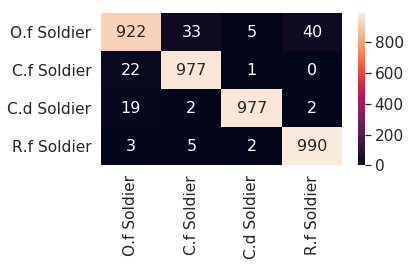


[67] accuracy: 0.965 loss: 7.505

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.66584362275898

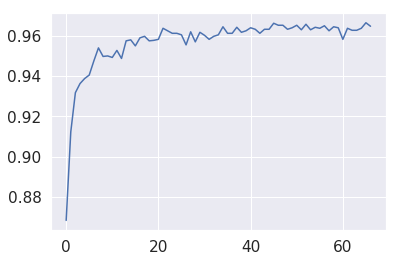

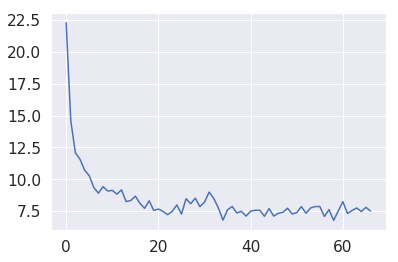

[0, 2, 1, 3, 0, 0, 1, 1, 0, 3, 1, 0, 1, 3, 2, 1, 3, 3, 1, 3, 0, 0, 3, 1, 0, 1, 0, 0, 3, 0, 3, 1, 1, 0, 0, 0, 3, 0, 1, 3, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 3, 3, 1, 3, 1, 1, 1, 0, 1, 1, 3, 0, 1, 0, 1, 1, 1, 1, 0, 0, 3, 2, 1, 3, 1, 1, 0, 0, 3, 1, 1, 1, 0, 2, 1, 1, 1, 3, 0, 1, 1, 3, 0, 1, 1, 2, 1, 3, 1, 2, 3, 2, 1, 0, 3, 3, 0, 0, 0, 0, 1, 2, 1, 0, 0, 2, 3, 1, 1, 1, 0, 3, 0, 3, 3, 1, 0, 1, 1, 0, 1, 2, 0, 2, 3, 2, 0, 3, 0, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          919           43           10           28
C.f Soldier           22          978            0            0
C.d Soldier           21            2          975            2
R.f Soldier            4            6            3          987


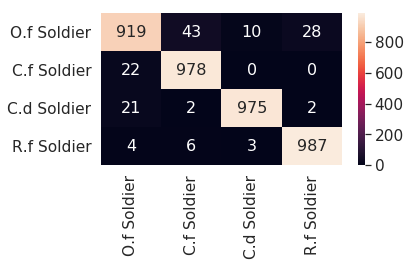


[68] accuracy: 0.964 loss: 7.304

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246, 7.66584

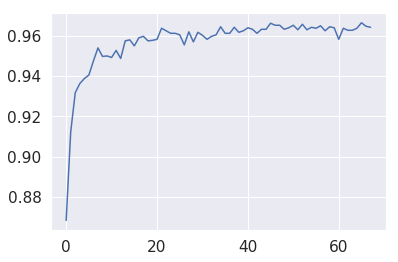

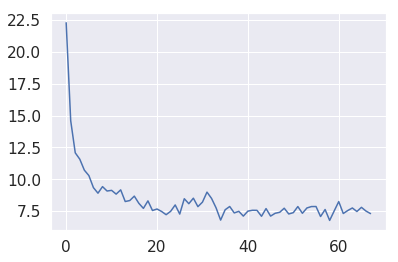

[1, 1, 1, 0, 1, 0, 0, 1, 3, 3, 3, 1, 2, 3, 1, 3, 0, 3, 3, 0, 3, 0, 3, 1, 3, 0, 1, 2, 2, 3, 1, 1, 0, 1, 3, 3, 3, 0, 3, 0, 0, 1, 3, 0, 3, 1, 3, 3, 2, 1, 0, 3, 3, 0, 0, 0, 3, 0, 3, 0, 1, 1, 2, 1, 3, 1, 0, 1, 1, 3, 0, 1, 1, 2, 1, 1, 3, 0, 2, 0, 3, 2, 3, 1, 3, 1, 3, 0, 3, 2, 1, 0, 0, 3, 3, 1, 3, 1, 0, 2, 0, 3, 0, 1, 1, 0, 1, 1, 3, 0, 3, 1, 0, 0, 3, 0, 3, 2, 1, 0, 1, 0, 3, 0, 3, 0, 0, 1, 1, 3, 0, 1, 1, 3, 2, 0, 2, 1, 1, 1, 1, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           37            8           42
C.f Soldier           25          974            1            0
C.d Soldier           14            2          982            2
R.f Soldier            2            6            4          988


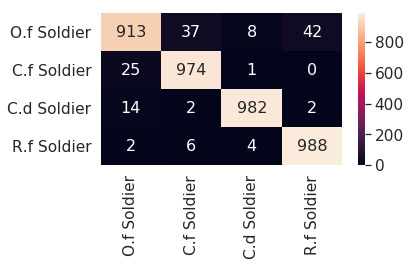


[69] accuracy: 0.967 loss: 7.488

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.548217102885246

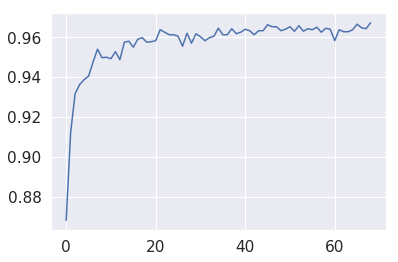

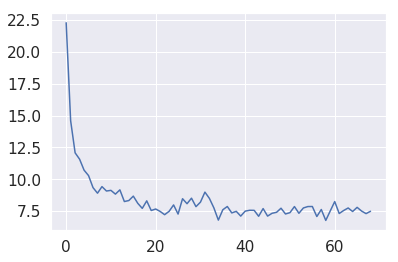

[1, 1, 0, 1, 1, 3, 3, 2, 3, 3, 1, 0, 3, 3, 1, 1, 0, 0, 3, 0, 1, 2, 3, 1, 1, 0, 3, 2, 3, 1, 1, 1, 0, 1, 0, 3, 1, 0, 1, 0, 1, 0, 0, 3, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 3, 3, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 3, 0, 0, 3, 0, 3, 1, 0, 1, 0, 1, 3, 3, 1, 0, 3, 0, 3, 3, 0, 1, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 3, 1, 3, 0, 1, 1, 1, 1, 3, 0, 3, 3, 2, 0, 2, 0, 3, 1, 3, 1, 1, 3, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          922           44            3           31
C.f Soldier           24          975            1            0
C.d Soldier           15            1          982            2
R.f Soldier            2            6            2          990


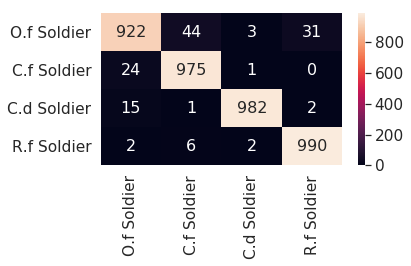


[70] accuracy: 0.966 loss: 7.627

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7.5482171

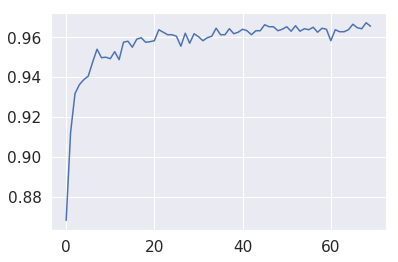

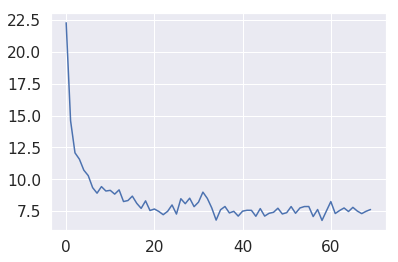

[3, 3, 0, 2, 1, 2, 1, 0, 3, 1, 1, 1, 0, 0, 2, 0, 3, 0, 3, 1, 1, 3, 0, 1, 0, 0, 0, 3, 3, 3, 2, 3, 1, 1, 1, 3, 0, 3, 0, 3, 1, 1, 0, 1, 3, 1, 1, 0, 2, 3, 3, 1, 3, 1, 1, 1, 2, 0, 3, 0, 2, 1, 1, 0, 3, 1, 2, 1, 1, 1, 2, 1, 1, 2, 3, 3, 0, 1, 3, 0, 3, 0, 1, 0, 1, 0, 3, 0, 2, 0, 3, 0, 3, 0, 3, 1, 3, 3, 0, 1, 0, 1, 0, 1, 3, 2, 0, 1, 3, 1, 1, 1, 1, 0, 0, 3, 2, 0, 0, 3, 1, 0, 3, 0, 3, 3, 3, 1, 1, 2, 1, 0, 1, 1, 1, 0, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          918           38            8           36
C.f Soldier           21          976            3            0
C.d Soldier           16            2          980            2
R.f Soldier            2            7            3          988


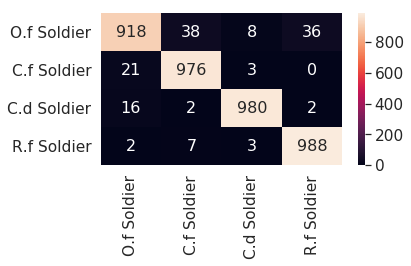


[71] accuracy: 0.964 loss: 7.494

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.304692463949323, 7

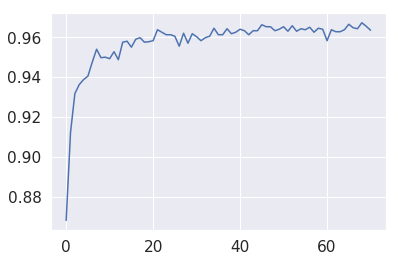

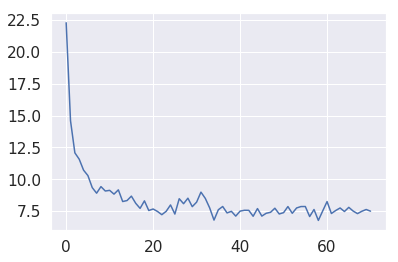

[0, 0, 0, 1, 1, 3, 3, 1, 1, 2, 3, 2, 0, 1, 1, 0, 3, 1, 3, 3, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 3, 3, 0, 1, 1, 0, 3, 0, 3, 0, 3, 0, 0, 0, 2, 0, 1, 1, 0, 0, 0, 1, 1, 1, 3, 3, 1, 0, 2, 0, 1, 2, 0, 3, 1, 1, 3, 3, 1, 1, 0, 1, 0, 1, 1, 3, 1, 1, 0, 1, 1, 2, 1, 3, 0, 3, 3, 0, 0, 0, 3, 3, 3, 3, 0, 0, 3, 0, 3, 0, 0, 1, 0, 1, 3, 1, 0, 1, 1, 1, 3, 1, 0, 3, 1, 3, 2, 0, 2, 2, 1, 3, 2, 3, 3, 3, 3, 0, 1, 1, 0, 3, 3, 1, 1, 1, 0, 3, 0, 0, 3, 1, 3, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           41            6           40
C.f Soldier           26          972            2            0
C.d Soldier           17            2          979            2
R.f Soldier            1            7            2          990


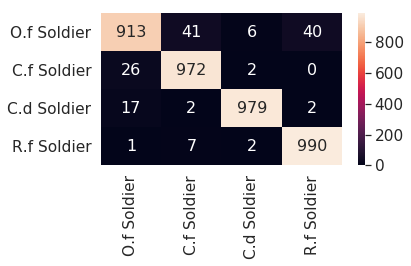


[72] accuracy: 0.962 loss: 8.054

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.30469246394

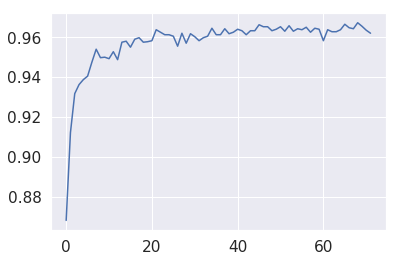

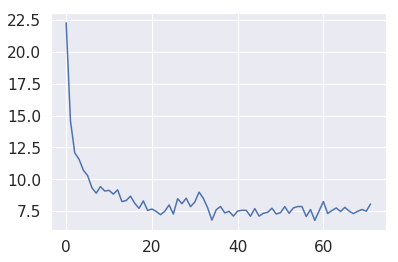

[0, 2, 3, 3, 0, 1, 0, 1, 1, 0, 0, 0, 1, 3, 1, 2, 1, 0, 0, 1, 1, 1, 1, 1, 3, 0, 0, 1, 1, 0, 1, 0, 2, 1, 1, 1, 1, 3, 1, 3, 3, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 3, 1, 3, 1, 3, 3, 0, 2, 0, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 2, 1, 3, 3, 3, 3, 0, 0, 2, 0, 0, 3, 1, 1, 2, 3, 3, 3, 0, 1, 0, 0, 3, 0, 3, 3, 0, 1, 3, 1, 1, 1, 0, 3, 0, 1, 1, 3, 0, 0, 0, 2, 1, 1, 3, 2, 3, 3, 3, 3, 0, 3, 0, 3, 0, 1, 1, 0, 1, 3, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 1, 1, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          910           50            6           34
C.f Soldier           29          970            1            0
C.d Soldier           22            1          975            2
R.f Soldier            2            2            3          993


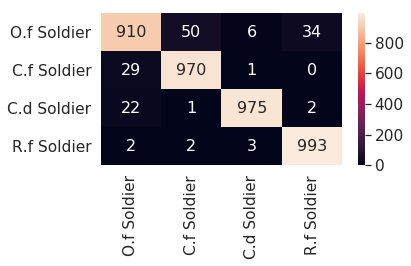


[73] accuracy: 0.965 loss: 7.523

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671574, 8.30

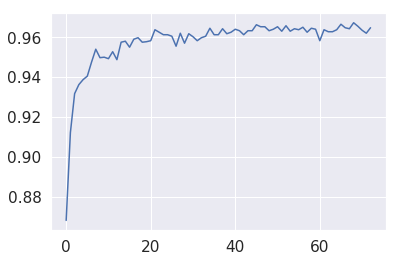

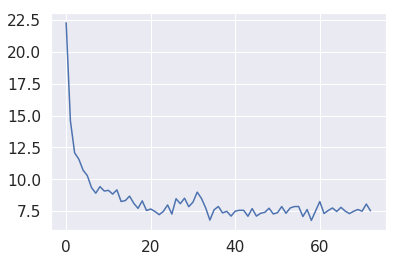

[3, 0, 0, 0, 0, 0, 3, 3, 1, 1, 1, 1, 1, 1, 0, 0, 3, 1, 0, 3, 0, 1, 1, 3, 3, 0, 3, 0, 0, 1, 1, 1, 0, 1, 1, 0, 2, 3, 2, 1, 1, 3, 1, 1, 1, 3, 1, 1, 3, 3, 3, 0, 3, 1, 1, 3, 3, 0, 3, 1, 0, 3, 1, 1, 1, 2, 2, 1, 3, 3, 0, 1, 0, 1, 0, 1, 0, 0, 1, 3, 0, 0, 3, 3, 0, 1, 2, 0, 3, 3, 3, 1, 0, 3, 1, 0, 3, 0, 0, 2, 3, 1, 3, 2, 3, 3, 3, 3, 3, 1, 0, 1, 0, 2, 1, 1, 0, 3, 0, 0, 1, 3, 3, 1, 1, 3, 0, 1, 0, 1, 0, 0, 2, 1, 3, 3, 1, 1, 3, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          909           43            7           41
C.f Soldier           21          979            0            0
C.d Soldier           16            2          980            2
R.f Soldier            2            4            3          991


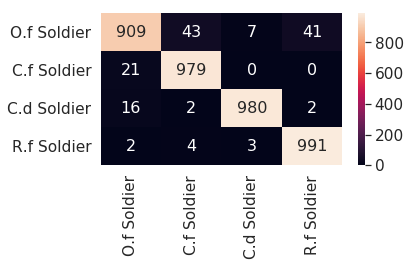


[74] accuracy: 0.963 loss: 7.842

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716145254671

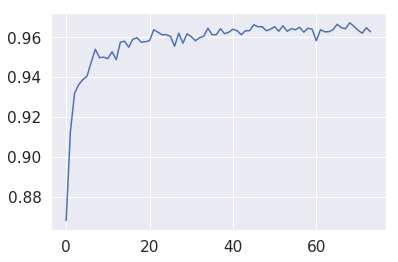

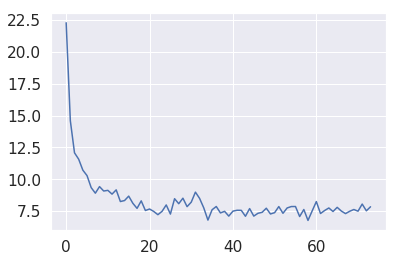

[2, 1, 1, 0, 1, 1, 1, 1, 0, 3, 0, 1, 3, 2, 1, 1, 0, 3, 3, 3, 0, 0, 2, 1, 0, 3, 0, 0, 2, 1, 1, 0, 3, 0, 3, 1, 1, 3, 3, 2, 1, 0, 3, 1, 0, 3, 3, 1, 3, 3, 3, 0, 0, 3, 1, 1, 1, 0, 3, 0, 0, 0, 0, 3, 1, 1, 3, 3, 1, 1, 0, 1, 3, 1, 2, 0, 3, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 3, 0, 0, 0, 0, 3, 1, 2, 3, 1, 0, 3, 1, 0, 3, 1, 3, 1, 1, 0, 2, 0, 3, 0, 1, 0, 1, 3, 1, 3, 3, 1, 1, 3, 1, 0, 1, 1, 0, 1, 1, 1, 3, 1, 2, 3, 2, 1, 0, 3, 1, 0, 3, 2, 1, 3, 0, 3, 0, 3, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           45            8           40
C.f Soldier           24          975            1            0
C.d Soldier           20            1          978            1
R.f Soldier            2            5            2          991


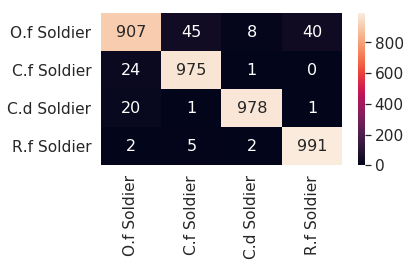


[75] accuracy: 0.966 loss: 7.097

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.112466970458627, 7.716

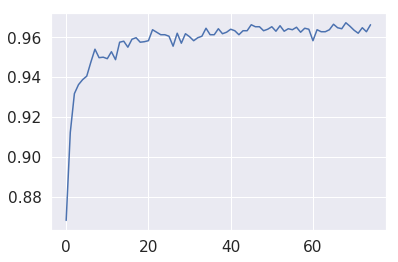

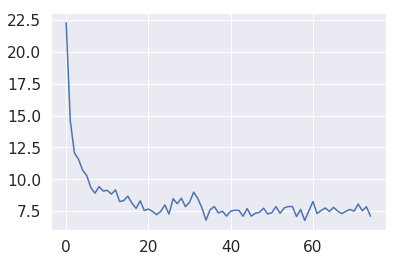

[2, 0, 1, 0, 3, 0, 0, 2, 1, 1, 1, 1, 2, 0, 0, 3, 3, 3, 2, 0, 0, 0, 1, 1, 3, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 3, 0, 1, 3, 3, 1, 1, 3, 0, 3, 0, 2, 1, 1, 1, 1, 3, 1, 1, 1, 3, 3, 1, 0, 0, 0, 2, 1, 3, 1, 2, 3, 1, 2, 1, 0, 2, 0, 0, 3, 0, 3, 0, 3, 0, 3, 1, 1, 3, 0, 1, 0, 0, 3, 0, 3, 1, 0, 1, 0, 3, 0, 1, 3, 3, 2, 3, 3, 0, 1, 1, 2, 3, 3, 1, 3, 3, 0, 1, 3, 3, 0, 0, 1, 1, 0, 1, 1, 1, 3, 0, 3, 1, 1, 3, 1, 1, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          919           39            8           34
C.f Soldier           22          977            1            0
C.d Soldier           15            2          981            2
R.f Soldier            4            6            2          988


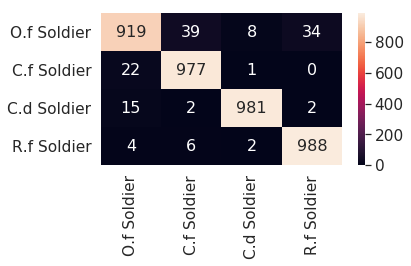


[76] accuracy: 0.966 loss: 6.937

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.1124669704586

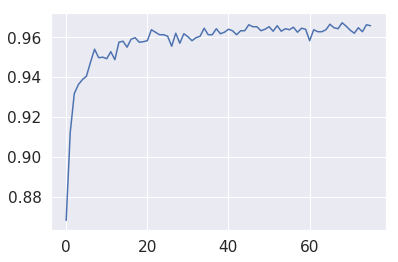

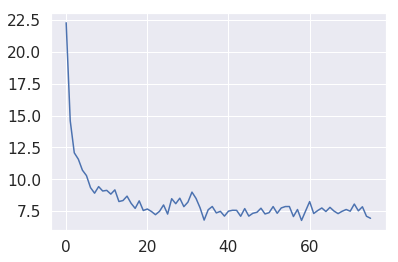

[3, 0, 2, 0, 3, 1, 0, 0, 0, 1, 3, 0, 3, 3, 0, 0, 0, 3, 0, 0, 3, 1, 3, 1, 1, 1, 3, 0, 3, 0, 0, 1, 2, 0, 2, 0, 2, 0, 3, 1, 1, 1, 1, 3, 1, 0, 3, 0, 3, 1, 1, 0, 3, 2, 1, 1, 1, 3, 2, 1, 0, 1, 1, 1, 0, 1, 3, 0, 0, 0, 0, 0, 3, 3, 0, 3, 0, 1, 2, 3, 1, 3, 0, 1, 2, 2, 0, 3, 1, 1, 3, 1, 1, 0, 3, 0, 3, 1, 2, 1, 3, 1, 3, 0, 0, 1, 2, 1, 2, 1, 1, 3, 0, 1, 3, 3, 3, 1, 1, 3, 1, 1, 1, 1, 1, 0, 3, 3, 1, 1, 2, 3, 3, 3, 0, 1, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          914           39           10           37
C.f Soldier           21          978            1            0
C.d Soldier           16            2          980            2
R.f Soldier            1            6            2          991


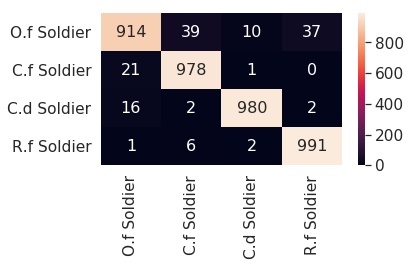


[77] accuracy: 0.966 loss: 7.011

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975, 8.1124

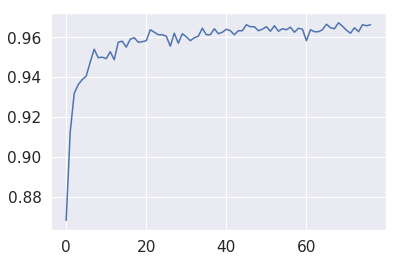

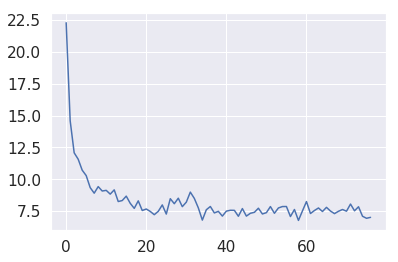

[1, 0, 1, 0, 1, 0, 2, 2, 1, 3, 0, 3, 1, 3, 2, 0, 1, 0, 0, 1, 3, 3, 3, 3, 0, 0, 1, 1, 1, 0, 0, 0, 0, 3, 3, 0, 1, 3, 0, 1, 3, 3, 1, 0, 3, 0, 3, 0, 3, 0, 2, 3, 1, 0, 1, 1, 1, 0, 0, 1, 3, 3, 1, 3, 1, 3, 3, 3, 0, 1, 1, 2, 1, 1, 3, 3, 1, 1, 3, 0, 0, 3, 0, 0, 3, 1, 3, 3, 3, 2, 2, 3, 0, 1, 0, 1, 1, 1, 0, 3, 0, 0, 3, 2, 3, 3, 1, 1, 0, 3, 1, 1, 1, 2, 0, 1, 1, 3, 3, 2, 1, 0, 0, 1, 1, 1, 2, 0, 3, 3, 3, 1, 3, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          917           36            6           41
C.f Soldier           23          975            2            0
C.d Soldier           13            2          984            1
R.f Soldier            2            6            3          989


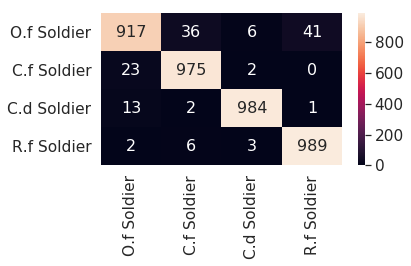


[78] accuracy: 0.968 loss: 6.979

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.676686918362975

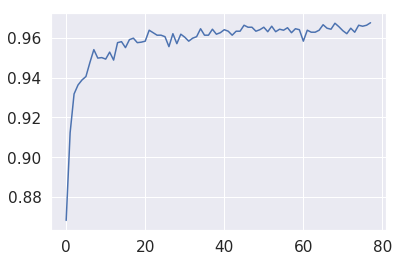

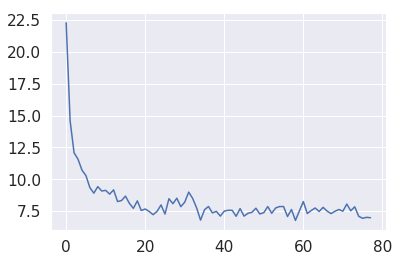

[3, 3, 0, 0, 3, 0, 2, 1, 1, 3, 0, 3, 2, 0, 0, 3, 3, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 3, 3, 3, 3, 1, 1, 1, 3, 0, 2, 1, 1, 3, 1, 0, 3, 3, 1, 1, 1, 0, 3, 3, 0, 0, 3, 1, 3, 0, 2, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 3, 1, 2, 1, 1, 0, 1, 1, 0, 0, 3, 0, 3, 1, 2, 1, 3, 2, 3, 3, 0, 3, 3, 3, 1, 3, 0, 1, 1, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 2, 3, 1, 3, 1, 1, 2, 1, 0, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          919           36            7           38
C.f Soldier           19          981            0            0
C.d Soldier           17            2          979            2
R.f Soldier            2            5            2          991


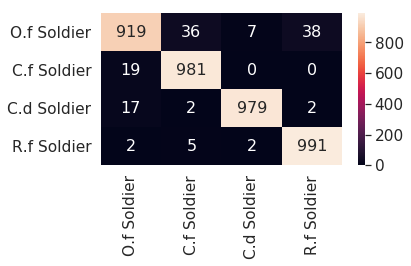


[79] accuracy: 0.966 loss: 7.241

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8.6766869

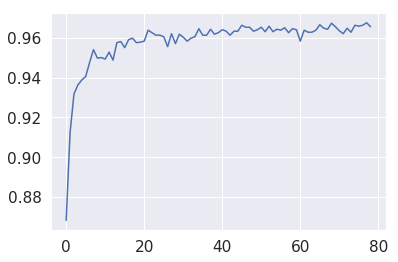

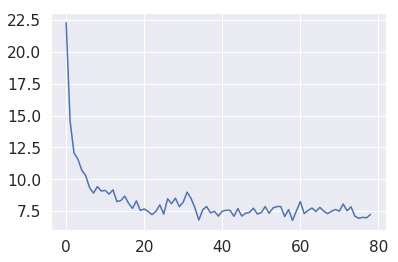

[1, 1, 1, 1, 1, 3, 2, 3, 2, 1, 0, 3, 2, 3, 3, 1, 0, 1, 0, 1, 3, 3, 0, 1, 2, 0, 3, 1, 1, 0, 3, 0, 3, 3, 3, 1, 0, 1, 2, 0, 0, 1, 1, 0, 1, 3, 1, 0, 0, 3, 0, 3, 2, 1, 1, 3, 1, 1, 1, 0, 3, 1, 1, 3, 2, 3, 1, 1, 1, 0, 1, 3, 3, 3, 3, 3, 0, 3, 0, 0, 3, 0, 0, 0, 1, 1, 3, 0, 0, 0, 3, 0, 1, 0, 0, 0, 1, 1, 1, 1, 2, 1, 1, 0, 1, 3, 1, 1, 1, 0, 0, 1, 1, 2, 1, 1, 0, 0, 0, 3, 3, 0, 0, 1, 1, 1, 1, 3, 3, 0, 0, 3, 1, 3, 3, 2, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          915           44            6           35
C.f Soldier           22          975            2            1
C.d Soldier           16            3          981            0
R.f Soldier            2            5            2          991


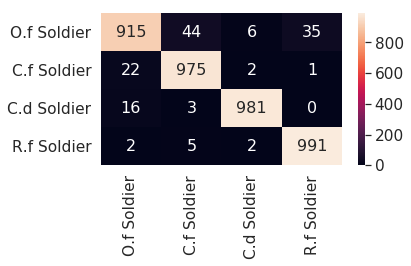


[80] accuracy: 0.966 loss: 7.545

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571752787, 8

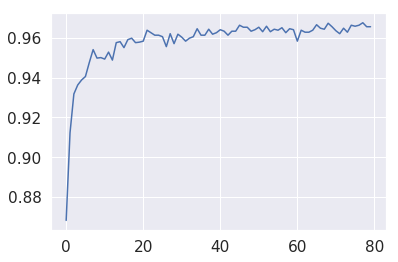

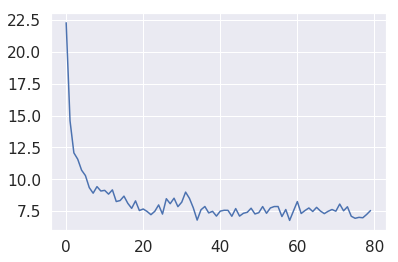

[0, 0, 0, 1, 3, 3, 0, 3, 0, 0, 1, 3, 1, 0, 0, 0, 1, 1, 0, 3, 0, 3, 2, 3, 0, 3, 1, 3, 1, 3, 0, 1, 0, 1, 0, 1, 1, 3, 1, 3, 0, 1, 3, 1, 2, 1, 3, 0, 0, 3, 1, 1, 1, 1, 1, 3, 0, 0, 1, 0, 1, 3, 1, 1, 1, 2, 3, 1, 1, 1, 3, 3, 3, 1, 3, 0, 0, 3, 3, 1, 1, 0, 2, 3, 3, 0, 3, 1, 3, 3, 3, 3, 2, 0, 3, 1, 0, 3, 3, 1, 0, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 2, 1, 0, 1, 1, 1, 1, 3, 1, 3, 1, 0, 0, 0, 3, 0, 3, 1, 1, 3, 1, 1, 0, 3, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          917           43            4           36
C.f Soldier           23          976            1            0
C.d Soldier           14            2          979            5
R.f Soldier            0            8            2          990


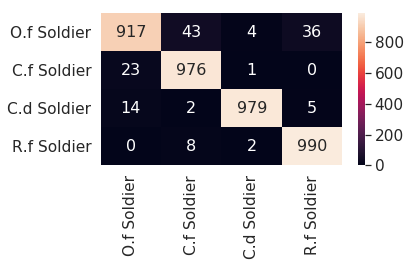


[81] accuracy: 0.965 loss: 7.750

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.330255571

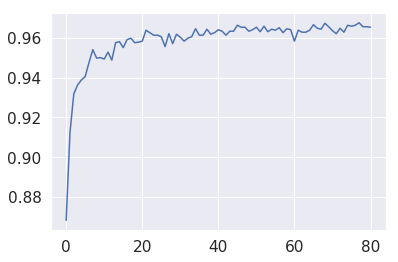

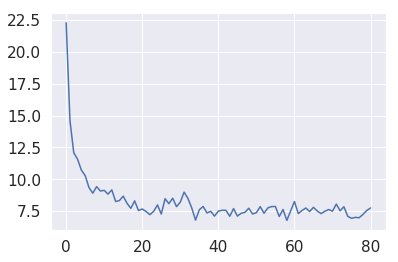

[1, 1, 1, 0, 0, 3, 1, 2, 0, 3, 3, 3, 1, 0, 1, 1, 1, 3, 0, 2, 3, 0, 3, 0, 3, 3, 0, 1, 3, 1, 1, 0, 1, 2, 0, 0, 3, 0, 0, 1, 0, 1, 2, 3, 3, 3, 1, 0, 0, 2, 3, 1, 2, 1, 1, 3, 3, 3, 3, 1, 0, 0, 3, 0, 0, 3, 3, 3, 1, 0, 1, 1, 0, 0, 1, 3, 0, 3, 1, 0, 0, 3, 3, 1, 1, 1, 2, 1, 3, 1, 1, 0, 3, 0, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 3, 3, 1, 1, 2, 1, 0, 3, 2, 1, 1, 1, 3, 0, 3, 0, 0, 3, 1, 1, 1, 3, 3, 3, 3, 0, 3, 0, 0, 0, 1, 0, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          912           39            7           42
C.f Soldier           23          976            1            0
C.d Soldier           13            4          983            0
R.f Soldier            2            6            2          990


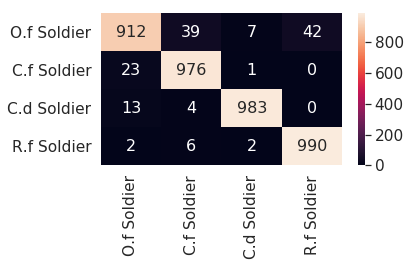


[82] accuracy: 0.963 loss: 7.993

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452983, 8.33

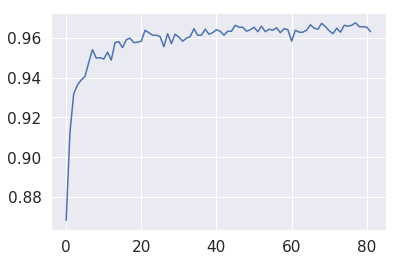

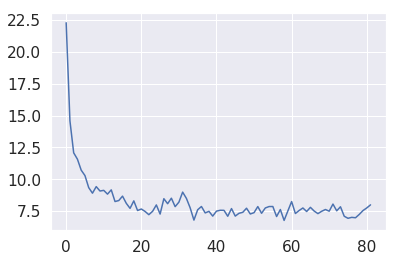

[3, 1, 3, 3, 3, 0, 1, 0, 0, 0, 0, 1, 0, 3, 1, 1, 3, 1, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 0, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 2, 1, 3, 3, 3, 1, 0, 0, 3, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 2, 1, 0, 1, 1, 3, 0, 0, 3, 3, 1, 1, 3, 0, 3, 0, 3, 1, 3, 3, 0, 1, 1, 0, 3, 3, 0, 3, 0, 0, 3, 1, 0, 1, 1, 0, 3, 1, 3, 1, 3, 0, 1, 1, 0, 0, 0, 3, 0, 0, 0, 1, 3, 1, 3, 1, 3, 3, 0, 2, 3, 0, 3, 0, 1, 0, 1, 1, 1, 1, 3, 2, 1, 1, 2, 1, 3, 0, 0, 3, 1, 1, 1, 1, 2]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          911           48            4           37
C.f Soldier           21          978            1            0
C.d Soldier           21            4          973            2
R.f Soldier            4            4            2          990


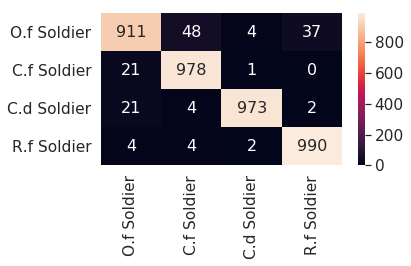


[83] accuracy: 0.963 loss: 7.819

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.252588538452

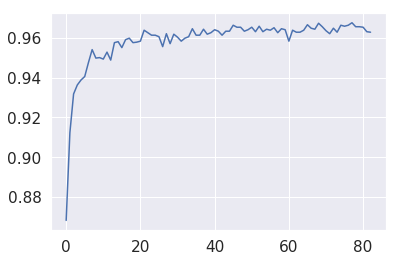

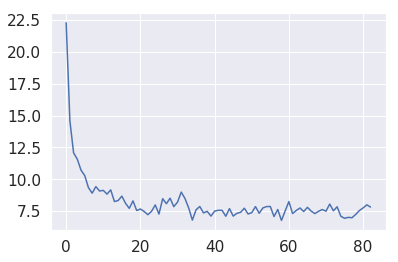

[0, 0, 0, 0, 0, 0, 2, 3, 3, 3, 0, 1, 0, 0, 0, 0, 3, 3, 0, 1, 1, 2, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 3, 3, 1, 3, 1, 0, 1, 0, 0, 0, 2, 0, 1, 1, 3, 3, 1, 0, 0, 3, 3, 0, 3, 0, 1, 1, 1, 1, 1, 1, 0, 1, 3, 0, 3, 3, 3, 1, 1, 2, 3, 1, 3, 1, 0, 3, 1, 3, 1, 3, 0, 2, 3, 1, 3, 0, 3, 0, 1, 3, 1, 0, 1, 3, 0, 1, 1, 3, 1, 3, 0, 2, 3, 1, 0, 1, 2, 1, 3, 0, 3, 3, 3, 1, 1, 3, 2, 2, 3, 1, 1, 3, 2, 1, 1, 1, 3, 1, 2, 1, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          912           43            7           38
C.f Soldier           25          973            2            0
C.d Soldier           18            4          977            1
R.f Soldier            1            8            2          989


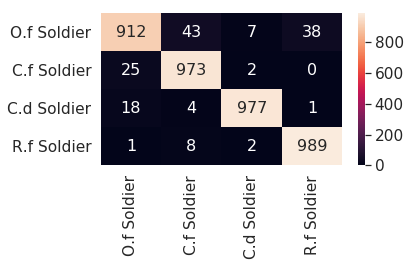


[84] accuracy: 0.963 loss: 8.055

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625, 8.25258

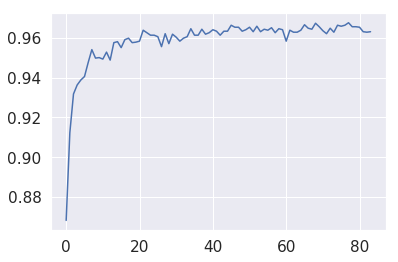

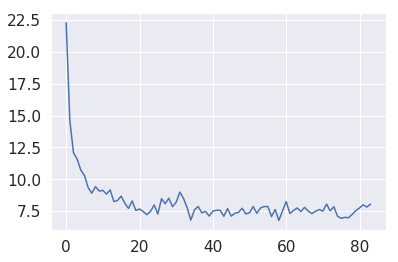

[1, 0, 1, 3, 0, 3, 3, 2, 3, 2, 0, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 0, 3, 2, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 3, 0, 2, 1, 0, 3, 3, 2, 2, 3, 0, 3, 3, 3, 1, 1, 0, 3, 0, 3, 1, 1, 3, 1, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 2, 1, 3, 3, 1, 3, 1, 2, 1, 0, 1, 0, 0, 3, 1, 1, 0, 1, 2, 2, 1, 3, 1, 0, 0, 2, 1, 1, 0, 0, 3, 3, 1, 0, 1, 1, 3, 3, 3, 3, 3, 0, 1, 1, 1, 2, 0, 3, 3, 0, 1, 0, 0, 0, 3, 3, 1, 3, 0, 3, 3, 0, 0, 0, 0, 1, 0, 1, 3, 3, 1, 1, 1, 1, 2, 0, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           46            8           39
C.f Soldier           25          973            2            0
C.d Soldier           18            2          980            0
R.f Soldier            2            3            3          992


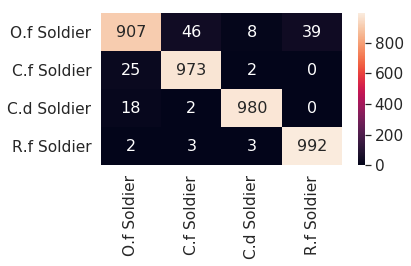


[85] accuracy: 0.964 loss: 7.174

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.169277261942625

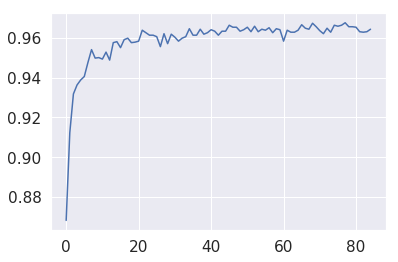

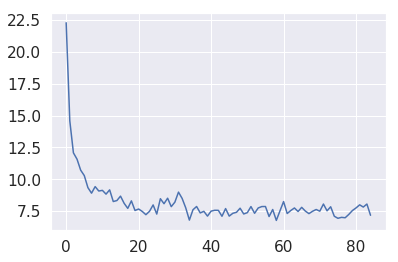

[1, 3, 2, 3, 3, 1, 1, 2, 3, 2, 3, 0, 0, 0, 3, 3, 3, 0, 1, 0, 0, 0, 3, 3, 3, 3, 1, 0, 2, 1, 1, 2, 3, 3, 3, 3, 0, 1, 3, 1, 2, 0, 3, 0, 3, 1, 3, 3, 0, 0, 3, 1, 0, 1, 1, 3, 1, 1, 1, 0, 0, 2, 0, 3, 2, 2, 1, 1, 3, 3, 0, 0, 3, 3, 2, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 0, 1, 1, 1, 3, 1, 0, 0, 1, 1, 3, 3, 3, 1, 1, 0, 3, 3, 1, 0, 1, 3, 3, 3, 0, 1, 3, 1, 0, 3, 1, 3, 1, 2, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          907           48            6           39
C.f Soldier           19          978            2            1
C.d Soldier           16            1          981            2
R.f Soldier            1            5            3          991


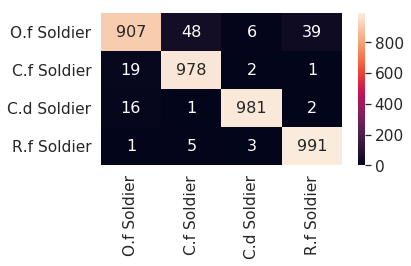


[86] accuracy: 0.969 loss: 7.124

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 9.1692772

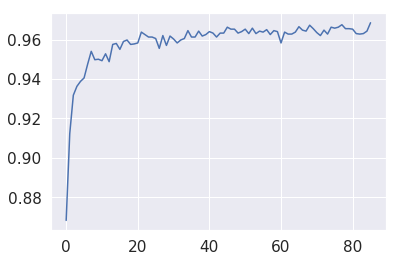

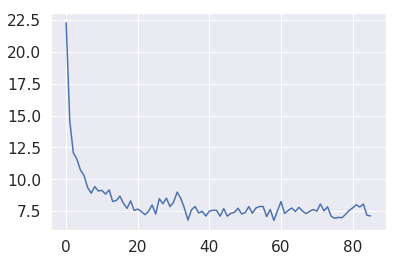

[1, 0, 0, 3, 2, 0, 0, 0, 1, 3, 3, 3, 3, 3, 1, 0, 1, 1, 1, 0, 3, 0, 1, 1, 1, 2, 2, 0, 0, 1, 1, 3, 3, 3, 3, 3, 1, 0, 3, 0, 1, 1, 3, 0, 1, 1, 0, 1, 3, 0, 0, 1, 0, 1, 0, 3, 0, 1, 2, 0, 0, 1, 3, 2, 3, 1, 2, 0, 0, 2, 1, 0, 1, 2, 1, 1, 1, 1, 3, 1, 1, 1, 1, 0, 3, 3, 3, 3, 0, 3, 1, 2, 3, 1, 1, 1, 0, 3, 1, 3, 0, 3, 1, 3, 3, 3, 1, 1, 1, 1, 3, 3, 3, 2, 1, 3, 0, 1, 1, 0, 3, 3, 0, 1, 3, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           40            7           37
C.f Soldier           19          980            1            0
C.d Soldier           11            2          986            1
R.f Soldier            1            5            2          992


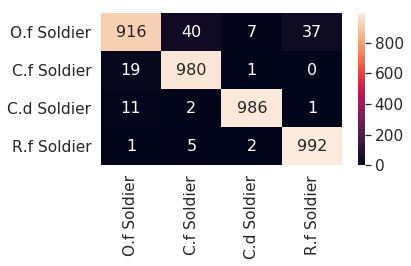


[87] accuracy: 0.969 loss: 7.071

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.834431804716587, 

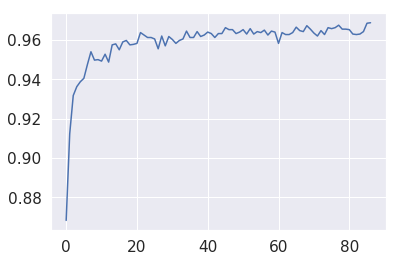

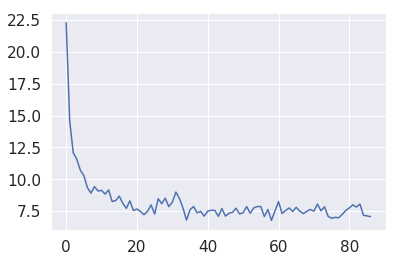

[1, 0, 0, 0, 1, 3, 3, 1, 3, 1, 1, 0, 0, 1, 0, 0, 1, 1, 3, 3, 0, 3, 3, 1, 1, 0, 1, 1, 1, 3, 3, 1, 0, 1, 0, 1, 0, 0, 0, 3, 2, 1, 1, 3, 3, 3, 0, 1, 0, 0, 0, 0, 3, 1, 1, 2, 3, 1, 3, 3, 0, 3, 1, 3, 3, 3, 1, 1, 0, 0, 0, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 0, 3, 1, 3, 0, 1, 1, 2, 3, 3, 3, 0, 0, 1, 0, 1, 1, 3, 0, 0, 2, 3, 1, 1, 1, 0, 2, 1, 1, 1, 3, 2, 0, 3, 1, 1, 1, 3, 3, 0, 0, 3, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          922           42            5           31
C.f Soldier           19          980            1            0
C.d Soldier           14            2          982            2
R.f Soldier            3            4            2          991


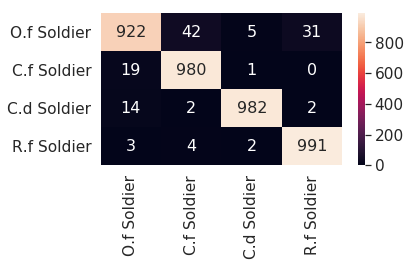


[88] accuracy: 0.969 loss: 7.150

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8.83443180

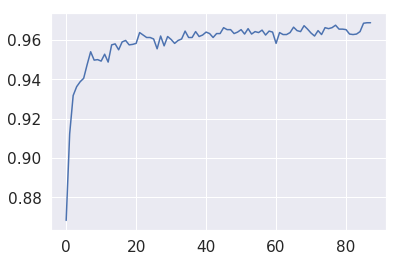

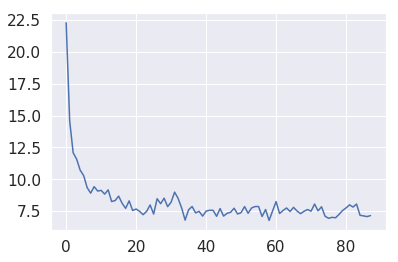

[1, 1, 1, 1, 1, 1, 0, 0, 3, 1, 2, 3, 1, 3, 1, 1, 3, 1, 1, 1, 1, 0, 2, 3, 1, 1, 3, 1, 0, 3, 3, 2, 1, 1, 1, 1, 3, 1, 3, 3, 0, 1, 1, 1, 3, 2, 3, 1, 3, 0, 0, 3, 0, 1, 3, 1, 0, 1, 3, 2, 3, 0, 0, 1, 1, 3, 1, 1, 1, 0, 0, 1, 1, 3, 1, 0, 3, 3, 3, 0, 0, 1, 1, 1, 3, 1, 1, 1, 1, 2, 1, 3, 3, 0, 3, 0, 0, 0, 3, 0, 0, 3, 1, 0, 1, 1, 2, 3, 3, 0, 3, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          918           46            4           32
C.f Soldier           18          980            1            1
C.d Soldier           10            2          988            0
R.f Soldier            1            8            2          989


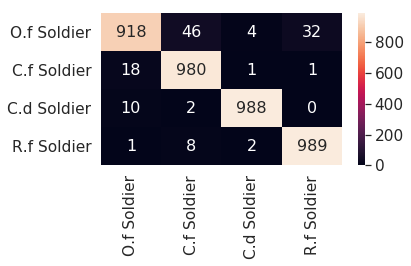


[89] accuracy: 0.967 loss: 7.432

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026976824, 8

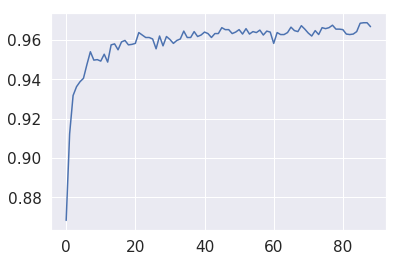

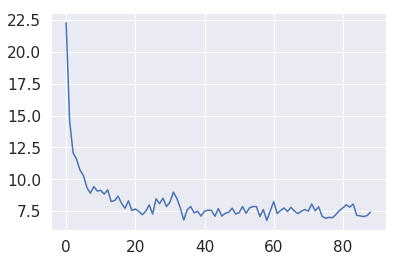

[3, 0, 3, 3, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 3, 0, 2, 2, 3, 3, 0, 3, 1, 1, 1, 0, 3, 0, 2, 1, 3, 2, 1, 2, 3, 0, 3, 2, 3, 1, 1, 2, 3, 3, 1, 3, 0, 1, 1, 1, 3, 0, 3, 3, 3, 1, 1, 0, 3, 0, 1, 1, 3, 0, 1, 3, 0, 0, 1, 1, 3, 0, 3, 3, 3, 3, 3, 1, 3, 1, 1, 1, 1, 1, 0, 1, 3, 0, 2, 0, 1, 1, 0, 0, 3, 1, 1, 2, 1, 2, 0, 3, 3, 0, 0, 0, 3, 1, 0, 1, 1, 0, 1, 0, 1, 3, 3, 1, 3, 1, 0, 0, 1, 1, 3, 1, 0, 3, 3, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           44            5           38
C.f Soldier           20          978            2            0
C.d Soldier           11            2          985            2
R.f Soldier            3            3            3          991


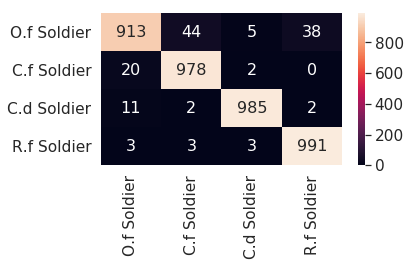


[90] accuracy: 0.964 loss: 7.176

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.130194026

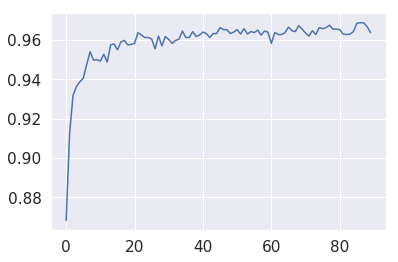

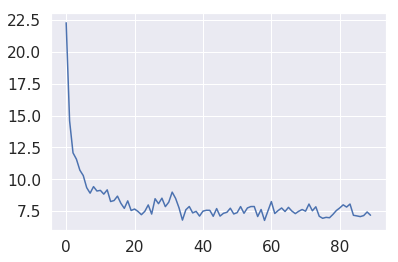

[1, 1, 1, 3, 3, 3, 1, 3, 0, 1, 1, 3, 3, 0, 3, 3, 1, 1, 1, 1, 1, 0, 1, 3, 3, 3, 0, 0, 3, 1, 2, 1, 2, 1, 3, 1, 3, 0, 0, 3, 0, 1, 2, 0, 1, 0, 2, 1, 1, 1, 1, 3, 1, 1, 1, 1, 0, 3, 3, 3, 0, 0, 1, 3, 1, 3, 2, 0, 3, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 3, 0, 1, 0, 1, 1, 1, 0, 0, 3, 0, 3, 0, 0, 0, 0, 3, 1, 1, 0, 0, 0, 0, 0, 3, 0, 1, 1, 1, 1, 0, 0, 2, 1, 1, 2, 0, 1, 3, 1, 3, 2, 0, 0, 1, 3, 0, 1, 2, 1, 1, 2, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          908           55            7           30
C.f Soldier           23          975            1            1
C.d Soldier           16            1          982            1
R.f Soldier            5            3            2          990


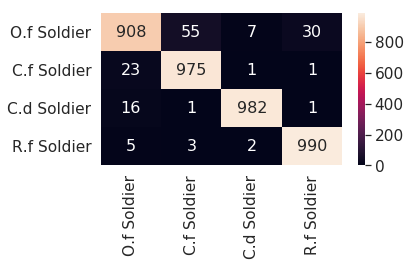


[91] accuracy: 0.965 loss: 6.821

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.078434403985739, 9.

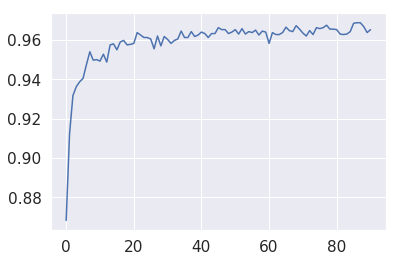

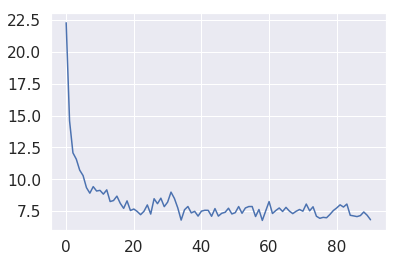

[1, 1, 1, 0, 1, 0, 1, 2, 1, 3, 3, 0, 3, 0, 0, 0, 0, 3, 1, 0, 3, 0, 1, 3, 0, 3, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 3, 3, 3, 1, 3, 1, 1, 0, 2, 3, 0, 3, 3, 2, 0, 3, 1, 0, 0, 1, 1, 0, 1, 1, 0, 3, 2, 1, 1, 3, 0, 3, 1, 0, 3, 1, 3, 1, 1, 3, 2, 3, 1, 1, 3, 1, 3, 0, 0, 1, 0, 1, 3, 0, 0, 1, 3, 1, 0, 1, 1, 0, 3, 1, 2, 3, 3, 0, 2, 3, 2, 3, 1, 0, 0, 1, 0, 0, 1, 1, 2, 0, 0, 0, 1, 3, 1, 0, 3, 2, 1, 3, 3, 1, 3, 3, 0, 1, 3, 0, 0, 3, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          921           35            7           37
C.f Soldier           22          976            1            1
C.d Soldier           17            5          977            1
R.f Soldier            3            8            2          987


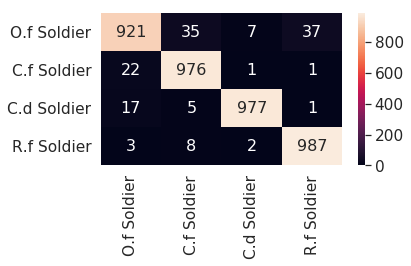


[92] accuracy: 0.967 loss: 7.162

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.07843440398

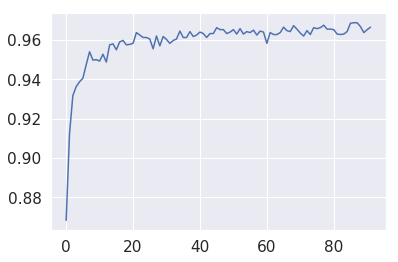

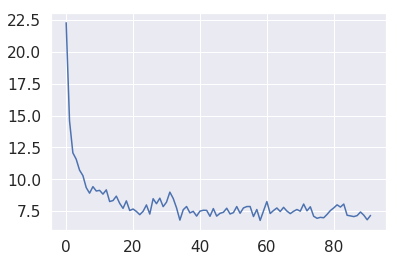

[0, 0, 1, 0, 2, 3, 1, 3, 3, 3, 1, 0, 2, 3, 1, 3, 0, 2, 1, 1, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 3, 0, 0, 3, 0, 3, 1, 0, 1, 1, 3, 3, 0, 3, 1, 3, 1, 3, 2, 1, 0, 3, 0, 0, 2, 1, 3, 3, 3, 3, 1, 1, 3, 1, 0, 1, 0, 3, 1, 0, 1, 1, 1, 1, 3, 0, 1, 0, 0, 3, 2, 0, 0, 1, 0, 0, 2, 3, 3, 0, 2, 1, 1, 0, 1, 2, 1, 2, 0, 1, 0, 1, 1, 1, 0, 0, 3, 0, 3, 1, 1, 2, 0, 3, 0, 3, 2, 3, 0, 3, 1, 1, 1, 3, 1, 3, 3, 3, 0, 2, 1, 0, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           39           10           38
C.f Soldier           21          978            1            0
C.d Soldier           14            2          983            1
R.f Soldier            1            5            2          992


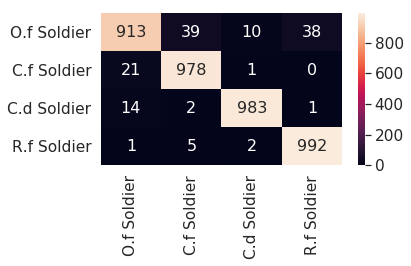


[93] accuracy: 0.967 loss: 7.296

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045778, 9.07

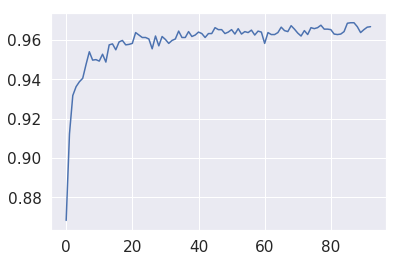

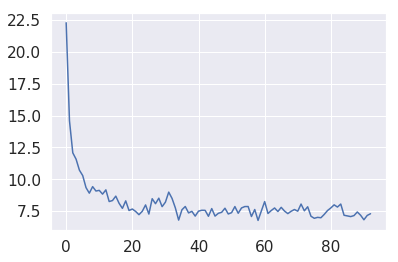

[0, 1, 0, 3, 1, 1, 3, 0, 3, 3, 3, 2, 1, 0, 1, 1, 3, 0, 3, 1, 0, 1, 0, 3, 2, 3, 3, 3, 3, 3, 1, 3, 1, 3, 3, 1, 1, 0, 1, 3, 0, 1, 1, 1, 1, 1, 0, 3, 3, 0, 1, 1, 3, 1, 3, 0, 3, 0, 1, 1, 1, 1, 1, 2, 0, 3, 3, 1, 0, 1, 3, 0, 3, 3, 0, 0, 3, 0, 1, 1, 3, 0, 1, 0, 1, 0, 3, 3, 1, 1, 0, 0, 1, 1, 3, 1, 3, 1, 3, 0, 3, 1, 2, 3, 1, 1, 1, 1, 1, 0, 0, 2, 3, 0, 3, 0, 0, 0, 3, 1, 1, 1, 1, 1, 0, 3, 3, 1, 1, 0, 1, 1, 0]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          913           48            2           37
C.f Soldier           20          978            1            1
C.d Soldier           14            1          982            3
R.f Soldier            0            4            2          994


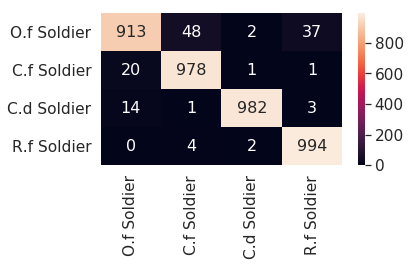


[94] accuracy: 0.968 loss: 7.366

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.423712898045

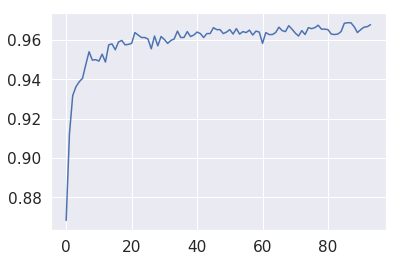

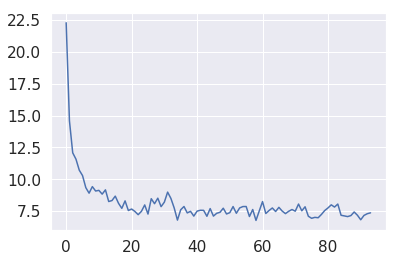

[0, 0, 1, 3, 3, 1, 1, 3, 0, 2, 3, 1, 3, 0, 1, 1, 2, 0, 1, 1, 0, 1, 3, 0, 1, 3, 0, 1, 1, 3, 1, 1, 1, 1, 1, 3, 3, 3, 1, 0, 1, 1, 1, 1, 1, 3, 0, 3, 3, 3, 1, 3, 3, 0, 3, 0, 0, 2, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 3, 1, 3, 3, 1, 0, 0, 1, 0, 1, 0, 3, 0, 1, 0, 1, 3, 0, 3, 3, 0, 3, 1, 2, 0, 1, 0, 1, 1, 0, 1, 2, 1, 2, 3, 1, 1, 1, 0, 3, 0, 0, 3, 3, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 3, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          916           50            3           31
C.f Soldier           20          979            1            0
C.d Soldier           14            0          985            1
R.f Soldier            3            4            2          991


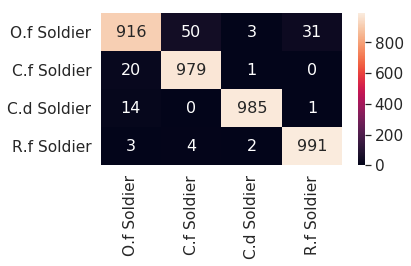


[95] accuracy: 0.966 loss: 7.804

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775, 0.9655]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077, 9.4237

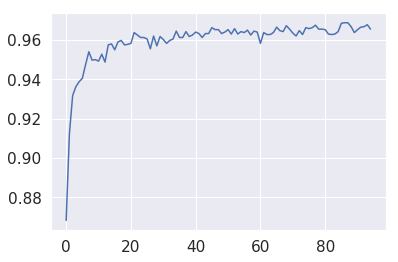

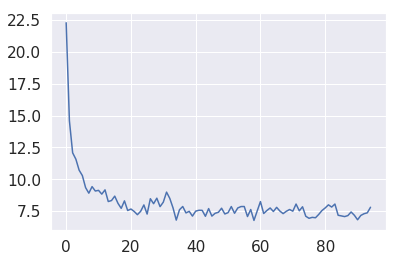

[0, 1, 0, 2, 0, 3, 1, 1, 3, 1, 1, 1, 0, 1, 1, 1, 3, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 2, 2, 3, 3, 2, 3, 1, 1, 3, 1, 3, 0, 3, 3, 3, 1, 3, 3, 3, 3, 1, 3, 3, 1, 1, 0, 1, 0, 1, 3, 1, 3, 2, 2, 1, 0, 1, 3, 0, 2, 0, 3, 1, 1, 3, 3, 3, 0, 0, 0, 3, 1, 3, 1, 3, 3, 1, 3, 1, 3, 0, 0, 1, 1, 3, 0, 1, 3, 0, 3, 1, 0, 0, 1, 1, 1, 3, 3, 3, 1, 1, 1, 2, 0, 0, 1, 1, 3, 0, 0, 3, 0, 0, 1, 1, 1, 1, 1, 3, 3, 1, 1, 1, 0, 0, 0, 3, 1, 1, 2, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          911           44            5           40
C.f Soldier           20          978            2            0
C.d Soldier           12            1          985            2
R.f Soldier            3            7            2          988


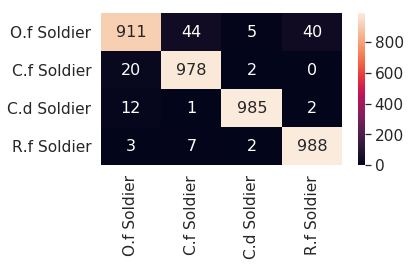


[96] accuracy: 0.968 loss: 7.375

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775, 0.9655, 0.9675]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460214734077

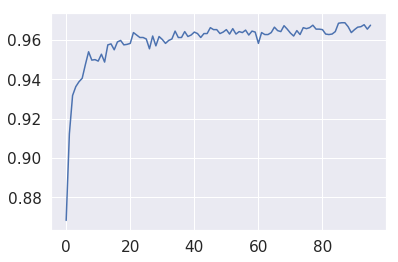

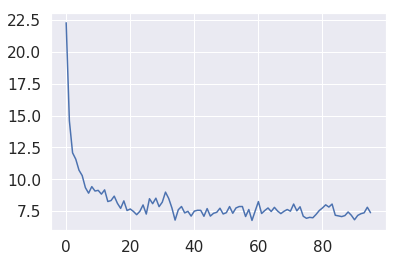

[3, 3, 1, 0, 3, 3, 3, 3, 1, 1, 1, 3, 0, 3, 3, 0, 3, 1, 1, 3, 1, 3, 1, 3, 1, 1, 1, 3, 0, 0, 3, 1, 0, 1, 0, 2, 0, 3, 1, 1, 3, 3, 0, 1, 0, 1, 3, 1, 0, 0, 2, 1, 1, 0, 3, 0, 0, 1, 1, 0, 2, 2, 0, 1, 3, 1, 0, 3, 3, 3, 1, 1, 0, 1, 3, 0, 3, 3, 3, 3, 3, 0, 3, 1, 1, 1, 0, 0, 1, 1, 0, 3, 0, 1, 1, 1, 1, 1, 2, 2, 1, 0, 1, 1, 1, 0, 1, 3, 1, 3, 0, 0, 1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 1, 0, 0, 0, 0, 3, 0, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          920           44            3           33
C.f Soldier           19          979            1            1
C.d Soldier           13            2          981            4
R.f Soldier            2            6            2          990


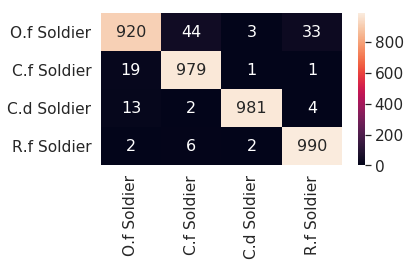


[97] accuracy: 0.964 loss: 8.118

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775, 0.9655, 0.9675, 0.96425]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186, 8.908460

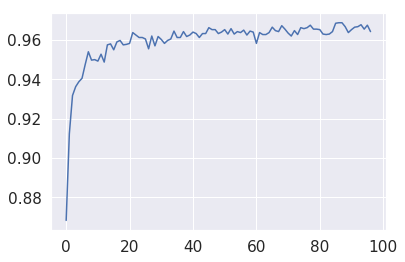

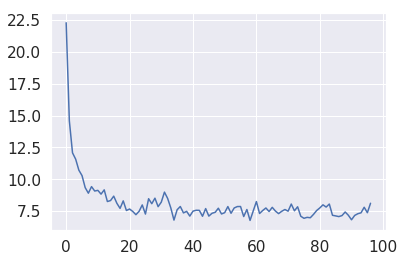

[1, 1, 0, 1, 0, 1, 1, 1, 3, 0, 0, 2, 0, 0, 0, 3, 0, 3, 0, 0, 1, 0, 2, 2, 1, 3, 1, 0, 1, 3, 1, 3, 0, 2, 3, 3, 3, 0, 0, 1, 1, 0, 1, 1, 3, 3, 0, 3, 0, 1, 0, 2, 2, 1, 2, 1, 3, 3, 1, 1, 0, 3, 0, 0, 3, 0, 0, 1, 1, 3, 3, 0, 1, 1, 1, 3, 1, 0, 3, 1, 3, 3, 3, 3, 3, 1, 3, 0, 3, 3, 3, 0, 0, 3, 1, 3, 3, 1, 3, 1, 0, 3, 1, 0, 1, 3, 3, 1, 1, 0, 0, 3, 0, 3, 1, 1, 1, 1, 0, 1, 1, 3, 0, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 1, 1, 3, 1, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          908           46            5           41
C.f Soldier           24          975            1            0
C.d Soldier           13            3          984            0
R.f Soldier            1            7            2          990


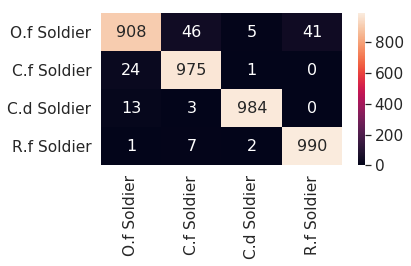


[98] accuracy: 0.967 loss: 7.461

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775, 0.9655, 0.9675, 0.96425, 0.96725]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.344074975699186,

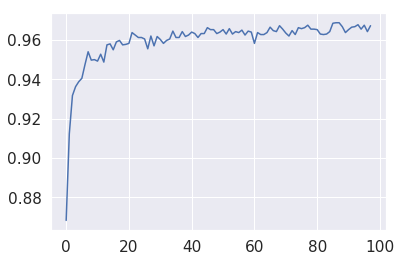

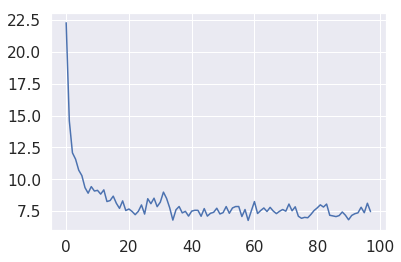

[0, 1, 3, 3, 3, 0, 1, 1, 3, 1, 0, 0, 1, 3, 0, 1, 0, 2, 2, 3, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 3, 2, 1, 1, 1, 1, 3, 3, 1, 3, 3, 0, 3, 1, 0, 0, 3, 3, 0, 3, 3, 0, 1, 1, 0, 0, 3, 0, 3, 3, 3, 3, 2, 0, 1, 0, 3, 0, 0, 1, 2, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 2, 3, 3, 1, 3, 3, 1, 0, 3, 3, 3, 1, 1, 0, 2, 0, 1, 0, 0, 3, 0, 1, 0, 3, 0, 1, 1, 1, 3, 0, 3, 0, 1, 0, 0, 3, 1, 3, 3, 0, 1, 0, 3, 1, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          927           32            4           37
C.f Soldier           25          974            1            0
C.d Soldier           12            3          981            4
R.f Soldier            3            8            2          987


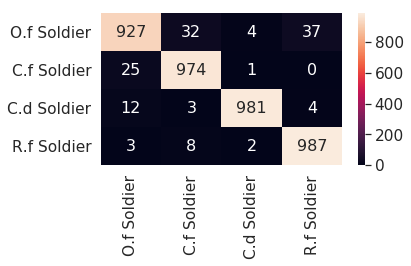


[99] accuracy: 0.963 loss: 7.373

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775, 0.9655, 0.9675, 0.96425, 0.96725, 0.96275]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9.3440749

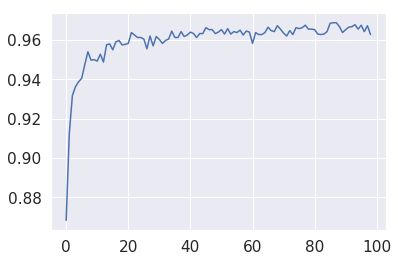

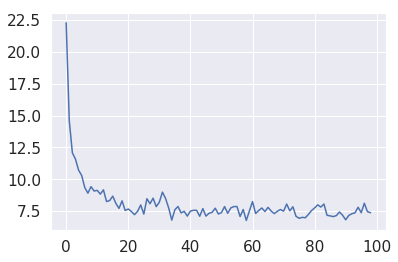

[1, 1, 3, 3, 0, 1, 0, 1, 0, 1, 3, 1, 0, 0, 3, 1, 0, 0, 1, 1, 3, 0, 0, 1, 1, 3, 3, 0, 0, 0, 2, 1, 1, 3, 3, 1, 2, 3, 3, 3, 3, 3, 1, 2, 3, 3, 1, 3, 3, 1, 3, 1, 1, 1, 0, 0, 1, 3, 0, 0, 1, 2, 0, 1, 3, 0, 1, 1, 0, 2, 3, 1, 1, 3, 0, 3, 1, 1, 3, 1, 0, 3, 0, 2, 0, 0, 3, 3, 0, 0, 3, 1, 2, 0, 0, 3, 3, 3, 1, 1, 0, 0, 1, 1, 3, 0, 0, 1, 3, 0, 1, 0, 1, 3, 0, 0, 0, 0, 3, 0, 0, 0, 2, 2, 3, 3, 3, 1, 0, 1, 0, 3, 1, 1, 3, 3, 2, 3, 3, 1, 2, 3, 1, 0, 0, 3, 1, 0, 1]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          911           40            7           42
C.f Soldier           26          972            2            0
C.d Soldier           15            1          980            4
R.f Soldier            5            5            2          988


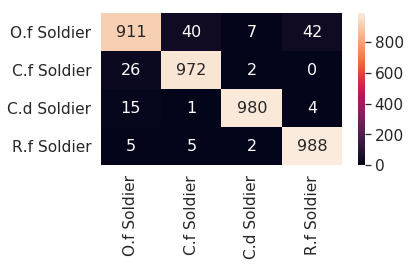


[100] accuracy: 0.963 loss: 7.790

[0.86825, 0.91225, 0.93175, 0.93625, 0.93875, 0.9405, 0.9475, 0.954, 0.94975, 0.95, 0.94925, 0.95275, 0.94875, 0.9575, 0.958, 0.955, 0.959, 0.95975, 0.9575, 0.95775, 0.95825, 0.96375, 0.9625, 0.96125, 0.96125, 0.9605, 0.9555, 0.962, 0.957, 0.96175, 0.96025, 0.95825, 0.95975, 0.9605, 0.9645, 0.96125, 0.96125, 0.96425, 0.96175, 0.9625, 0.964, 0.96325, 0.96125, 0.96325, 0.96325, 0.96625, 0.96525, 0.96525, 0.96325, 0.964, 0.96525, 0.963, 0.96575, 0.963, 0.96425, 0.96375, 0.965, 0.9625, 0.9645, 0.964, 0.95825, 0.96375, 0.96275, 0.96275, 0.96375, 0.9665, 0.96475, 0.96425, 0.96725, 0.9655, 0.9635, 0.962, 0.96475, 0.96275, 0.96625, 0.96575, 0.96625, 0.9675, 0.9655, 0.9655, 0.96525, 0.963, 0.96275, 0.963, 0.96425, 0.9685, 0.96875, 0.96875, 0.96675, 0.96375, 0.96525, 0.9665, 0.96675, 0.96775, 0.9655, 0.9675, 0.96425, 0.96725, 0.96275, 0.963]
[22.28901007771492, 14.593185663223267, 12.076587446033955, 11.575185008347034, 10.71677141264081, 10.289605490863323, 9

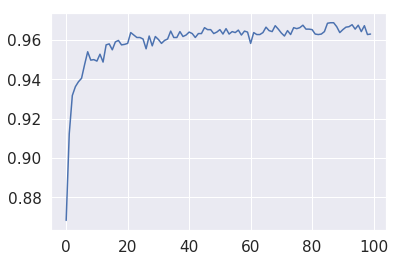

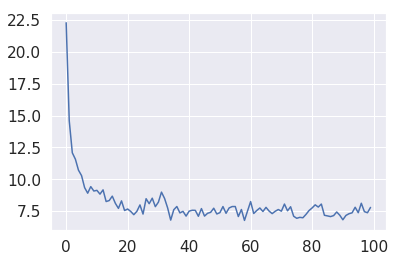

[0, 1, 0, 0, 1, 1, 1, 3, 0, 3, 1, 0, 0, 0, 3, 0, 1, 3, 0, 3, 1, 1, 3, 3, 1, 2, 0, 3, 0, 1, 1, 1, 1, 1, 1, 3, 2, 3, 3, 0, 3, 1, 0, 0, 3, 3, 0, 1, 0, 3, 0, 3, 3, 3, 3, 1, 1, 1, 3, 1, 3, 0, 0, 3, 1, 0, 1, 0, 0, 0, 0, 0, 3, 0, 3, 3, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 3, 3, 0, 0, 1, 0, 3, 0, 1, 1, 1, 3, 1, 1, 1, 3, 1, 1, 2, 0, 3, 3, 3, 3, 1, 1, 1, 3, 0, 3, 1, 0, 2, 3, 3, 1, 2, 0, 0, 1, 3, 0, 0, 0, 0, 3, 3, 0, 1, 2, 1, 0, 1, 3, 3, 3, 3, 3]
             O.f Soldier  C.f Soldier  C.d Soldier  R.f Soldier
O.f Soldier          912           41            3           44
C.f Soldier           26          973            1            0
C.d Soldier           18            2          978            2
R.f Soldier            3            6            2          989


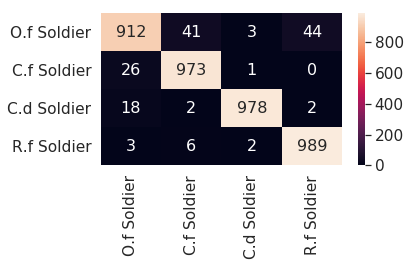

In [19]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
test_acc = []
test_loss = []
# classes2 = ["O. formosanus Worker","C. formosanus Worker", "C. domesticus Worker", "R. flaviceps Worker"]
for model_num in range(1, EPOCH+1):
    wrong_images = []
    wrong_answer = []
    actual_answer = []
    weight_path = model_directory + "%03d_weights.pt" % (model_num)
    state_dict = torch.load(weight_path)
    model.load_state_dict(state_dict)
    running_loss = 0.0
    total = 0
    correct = 0
    confusion_matrix = torch.zeros(len(classes), len(classes))
    for step, (labels, images, paths) in enumerate(testloader):
        optimizer.zero_grad()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        # append to the wrong list (test log file)
        for i in range(len(predicted)):
            if predicted[i] != labels[i]:
#                 print(paths[i], predicted[i], labels[i])
                wrong_images.append(paths[i])
                wrong_answer.append(predicted[i].item())
                actual_answer.append(labels[i].item())
        loss = criterion(outputs, labels)
        running_loss += loss.item()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        for t, p in zip(labels.view(-1), predicted.view(-1)):
#             print(t.item(), p.item())
#             mapp = { 1: 0,
#                     3: 1,
#                     5: 2,
#                     6: 3}
#             confusion_matrix[mapp[t.item()], mapp[p.item()]] += 1
            confusion_matrix[t.item(), p.item()] += 1
    
    running_acc = correct / total
    print('\n[%d] accuracy: %.3f loss: %.3f\n' % (model_num, running_acc, running_loss))
    
    test_acc.append(running_acc)
    test_loss.append(running_loss)
    print(test_acc)
    print(test_loss)
    plt.figure()
    plt.plot(range(0,model_num), test_acc)
    plt.savefig(model_directory + "test_acc_E%03d.jpg" % (model_num), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,model_num), test_loss)
    plt.savefig(model_directory + "test_loss_E%03d.jpg" % (model_num), dpi=500)
    plt.show()
    
    
    print(wrong_answer)
    with open(model_directory + "%03d_wrong.txt" % (model_num), 'w') as wrong:
#         c = zip(wrong_images, wrong_answer, actual_answer)
#         c = sorted(c)
#         (wrong_images, wrong_answer, actual_answer) = zip(*c)
#         print(wrong_images)
        for i in range(len(wrong_images)):
            wrong.write(wrong_images[i] + " " + classes[wrong_answer[i]] + " " + classes[actual_answer[i]])
#             print(wrong_images[i] + " " + classes[wrong_answer[i]] + " " + classes[actual_answer[i]])
            wrong.write("\n")
        wrong.close()
#     print(confusion_matrix)
    confusion_matrix = confusion_matrix.numpy().astype(int)
#     print(confusion_matrix)
    df_cm = pd.DataFrame(confusion_matrix, index = [i for i in classes],
                  columns = [i for i in classes])
    print(df_cm)
    sn.set(font_scale=1.4)#for label size
#     print(classes)
    img = sn.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt="d")
    figure = img.get_figure()
    plt.tight_layout()
    plt.savefig(model_directory + "confusion_matrix_%03d.jpg" % (model_num), dpi=500)
    plt.show()
    


In [20]:
resultfile = open(model_directory+"test_results.txt", "a")
resultfile.write("test")
resultfile.write("\n")
resultfile.write(str(test_acc))
resultfile.write("\n")
resultfile.write(str(test_loss))
resultfile.write("\n")
resultfile.close()
